
## RNN for data with time delays


In [1]:

import pandas as pd
import numpy as np


In [2]:

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')


In [3]:

import matplotlib 
## import pytorch_lightning as pl
import torch 

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable


In [4]:

## Requires Python = 3.9



## Parameters


In [5]:

window                 = 3    ## 90   ## 30          ## seq length

silicon_feature_index  = 0

avg_the_rows_parameter =  30   ##   15




## 1    ->  1 minute time step
## 15   -> 15 minute time step
## 1440 -> 24 hour time step
## 480  -> 8 hour shift
## 60   -> 1 hour time step



## Read the data


In [6]:

for_RNN_data_CIVS = pd.read_csv('RNN_time_DELAYS_265736_1h6hPreCast_rcalix.csv')


In [7]:

for_RNN_data_CIVS.head(5)


,Unnamed: 0,SI_f1,MM_Timestamp_f1,HOST_BLAST_MOISTURE_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,...,Selec_Top_Gas_N2_f3,HOT_BLAST_TMP_NS_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,NAT_GAS _INJECTION_f3,Coke_Rate_f3,Cast_Avg_Si_f2,Cast_Avg_Mn_f2,Slag_Fe_f2
0,0,1.152,2021-08-01 00:00:00,8.084517,158.478922,245.634175,145.396538,220.717349,22.322068,18.729296,...,54.250139,1999.604384,179.749638,2.510680,0.0,4034.234339,992,1.048,0.546,0.05
1,1,1.152,2021-08-01 00:01:00,8.079545,159.637733,252.459217,145.570895,226.360600,22.335329,18.731320,...,54.194257,2000.288837,179.765945,2.489381,0.0,4024.947376,992,1.048,0.546,0.05
2,2,1.152,2021-08-01 00:02:00,8.074573,160.796544,252.645736,145.745252,230.297540,22.348590,18.733343,...,54.138374,1999.242862,179.782251,2.489037,0.0,4011.601682,992,1.048,0.546,0.05
3,3,1.152,2021-08-01 00:03:00,8.069602,161.955355,247.987563,145.919609,225.220292,22.361852,18.735367,...,54.082797,1999.884442,179.798490,2.496867,0.0,4012.024633,992,1.048,0.546,0.05
4,4,1.152,2021-08-01 00:04:00,8.064630,163.102736,226.923719,146.093966,218.827693,22.375113,18.737391,...,54.063779,1999.849729,179.784430,2.501961,0.0,4000.467204,992,1.048,0.546,0.05


In [8]:

for_RNN_data_CIVS


,Unnamed: 0,SI_f1,MM_Timestamp_f1,HOST_BLAST_MOISTURE_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,...,Selec_Top_Gas_N2_f3,HOT_BLAST_TMP_NS_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,NAT_GAS _INJECTION_f3,Coke_Rate_f3,Cast_Avg_Si_f2,Cast_Avg_Mn_f2,Slag_Fe_f2
0,0,1.152000,2021-08-01 00:00:00,8.084517,158.478922,245.634175,145.396538,220.717349,22.322068,18.729296,...,54.250139,1999.604384,179.749638,2.510680,0.0,4034.234339,992,1.048,0.546,0.05
1,1,1.152000,2021-08-01 00:01:00,8.079545,159.637733,252.459217,145.570895,226.360600,22.335329,18.731320,...,54.194257,2000.288837,179.765945,2.489381,0.0,4024.947376,992,1.048,0.546,0.05
2,2,1.152000,2021-08-01 00:02:00,8.074573,160.796544,252.645736,145.745252,230.297540,22.348590,18.733343,...,54.138374,1999.242862,179.782251,2.489037,0.0,4011.601682,992,1.048,0.546,0.05
3,3,1.152000,2021-08-01 00:03:00,8.069602,161.955355,247.987563,145.919609,225.220292,22.361852,18.735367,...,54.082797,1999.884442,179.798490,2.496867,0.0,4012.024633,992,1.048,0.546,0.05
4,4,1.152000,2021-08-01 00:04:00,8.064630,163.102736,226.923719,146.093966,218.827693,22.375113,18.737391,...,54.063779,1999.849729,179.784430,2.501961,0.0,4000.467204,992,1.048,0.546,0.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265731,265731,0.662065,2022-01-31 16:12:00,5.155158,168.935281,202.117809,163.555824,219.714757,20.510372,17.817248,...,55.682915,2162.689809,188.599806,0.000000,0.0,9680.930154,924,0.762,0.402,1.68
265732,265732,0.662446,2022-01-31 16:13:00,5.161362,170.715532,202.106673,164.493156,220.911245,20.510606,17.815391,...,55.688159,2162.438593,188.536026,0.000000,0.0,9665.389423,924,0.762,0.402,1.68
265733,265733,0.662826,2022-01-31 16:14:00,5.167567,172.495783,205.875063,165.430489,222.902059,20.510840,17.813534,...,55.693057,2162.032539,189.264351,0.000000,0.0,9652.217004,924,0.762,0.402,1.68
265734,265734,0.663207,2022-01-31 16:15:00,5.173771,174.440392,212.764586,166.688229,232.269437,20.511074,17.811677,...,55.697567,2160.858603,189.426471,0.000000,0.0,9661.236786,924,0.762,0.402,1.68


In [9]:

cols_list_DF = for_RNN_data_CIVS.columns.values.tolist()
cols_list_DF


['Unnamed: 0',
 'SI_f1',
 'MM_Timestamp_f1',
 'HOST_BLAST_MOISTURE_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'HOT_BLAST_TMP_NS_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'NAT_GAS _INJECTION_f3',
 'Coke_Rate_f3',
 'Cast_Avg_Si_f2',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2']

In [10]:
l_new = ['SI_f1',
 'MM_Timestamp_f1',
 'HOST_BLAST_MOISTURE_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'HOT_BLAST_TMP_NS_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'NAT_GAS _INJECTION_f3',
 'Coke_Rate_f3',
 'Cast_Avg_Si_f2',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2']

In [11]:

for_RNN_data_CIVS = for_RNN_data_CIVS[l_new]


In [12]:

for_RNN_data_CIVS 


,SI_f1,MM_Timestamp_f1,HOST_BLAST_MOISTURE_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,HOT_BLAST_TMP_NS_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,NAT_GAS _INJECTION_f3,Coke_Rate_f3,Cast_Avg_Si_f2,Cast_Avg_Mn_f2,Slag_Fe_f2
0,1.152000,2021-08-01 00:00:00,8.084517,158.478922,245.634175,145.396538,220.717349,22.322068,18.729296,3.559210,54.250139,1999.604384,179.749638,2.510680,0.0,4034.234339,992,1.048,0.546,0.05
1,1.152000,2021-08-01 00:01:00,8.079545,159.637733,252.459217,145.570895,226.360600,22.335329,18.731320,3.559234,54.194257,2000.288837,179.765945,2.489381,0.0,4024.947376,992,1.048,0.546,0.05
2,1.152000,2021-08-01 00:02:00,8.074573,160.796544,252.645736,145.745252,230.297540,22.348590,18.733343,3.559259,54.138374,1999.242862,179.782251,2.489037,0.0,4011.601682,992,1.048,0.546,0.05
3,1.152000,2021-08-01 00:03:00,8.069602,161.955355,247.987563,145.919609,225.220292,22.361852,18.735367,3.559284,54.082797,1999.884442,179.798490,2.496867,0.0,4012.024633,992,1.048,0.546,0.05
4,1.152000,2021-08-01 00:04:00,8.064630,163.102736,226.923719,146.093966,218.827693,22.375113,18.737391,3.559309,54.063779,1999.849729,179.784430,2.501961,0.0,4000.467204,992,1.048,0.546,0.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265731,0.662065,2022-01-31 16:12:00,5.155158,168.935281,202.117809,163.555824,219.714757,20.510372,17.817248,4.376637,55.682915,2162.689809,188.599806,0.000000,0.0,9680.930154,924,0.762,0.402,1.68
265732,0.662446,2022-01-31 16:13:00,5.161362,170.715532,202.106673,164.493156,220.911245,20.510606,17.815391,4.376798,55.688159,2162.438593,188.536026,0.000000,0.0,9665.389423,924,0.762,0.402,1.68
265733,0.662826,2022-01-31 16:14:00,5.167567,172.495783,205.875063,165.430489,222.902059,20.510840,17.813534,4.376959,55.693057,2162.032539,189.264351,0.000000,0.0,9652.217004,924,0.762,0.402,1.68
265734,0.663207,2022-01-31 16:15:00,5.173771,174.440392,212.764586,166.688229,232.269437,20.511074,17.811677,4.377119,55.697567,2160.858603,189.426471,0.000000,0.0,9661.236786,924,0.762,0.402,1.68


In [13]:

for_RNN_data_CIVS.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265736 entries, 0 to 265735
Data columns (total 20 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   SI_f1                   265736 non-null  float64
 1   MM_Timestamp_f1         265736 non-null  object 
 2   HOST_BLAST_MOISTURE_f3  265736 non-null  float64
 3   NE_Uptake_f3            265736 non-null  float64
 4   SE_Uptake_f3            265736 non-null  float64
 5   NW_Uptake_f3            265736 non-null  float64
 6   SW_Uptake_f3            265736 non-null  float64
 7   Selec_Top_Gas_CO_f3     265736 non-null  float64
 8   Selec_Top_Gas_CO2_f3    265736 non-null  float64
 9   Selec_Top_Gas_H2_f3     265736 non-null  float64
 10  Selec_Top_Gas_N2_f3     265736 non-null  float64
 11  HOT_BLAST_TMP_NS_f3     265736 non-null  float64
 12  WINDRATE_f3             265736 non-null  float64
 13  HIGH_PURITY_OXYGEN_f3   265736 non-null  float64
 14  COAL_FLOW_f3        


## Plots


In [14]:

for_RNN_data_CIVS['MM_Timestamp_f1'] = for_RNN_data_CIVS['MM_Timestamp_f1'].astype("datetime64[ns]")

rc22 = for_RNN_data_CIVS['MM_Timestamp_f1'].astype("datetime64[ns]")


In [15]:

rc22


0        2021-08-01 00:00:00
1        2021-08-01 00:01:00
2        2021-08-01 00:02:00
3        2021-08-01 00:03:00
4        2021-08-01 00:04:00
                 ...        
265731   2022-01-31 16:12:00
265732   2022-01-31 16:13:00
265733   2022-01-31 16:14:00
265734   2022-01-31 16:15:00
265735   2022-01-31 16:16:00
Name: MM_Timestamp_f1, Length: 265736, dtype: datetime64[ns]

In [16]:

plt.rcParams["figure.figsize"] = [15, 5]


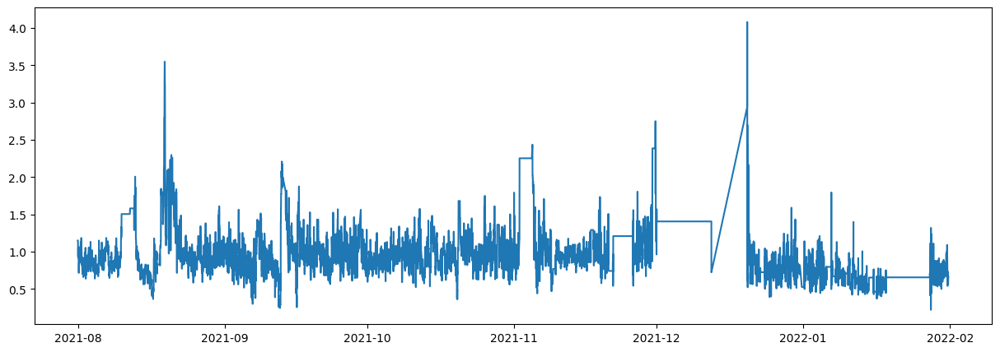

In [17]:

plt.plot(rc22, for_RNN_data_CIVS['SI_f1'])


array([<Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>], dtype=object)

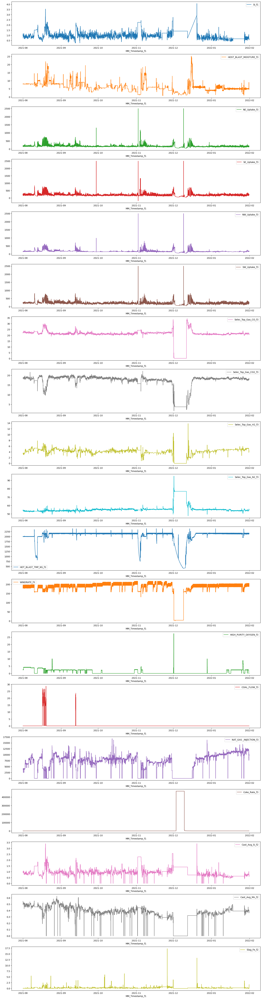

In [18]:

## layout=(4, 3), 
## style=['r', 'r', 'r', 'g', 'g', 'g', 'b', 'b', 'b', 'r', 'r', 'r'],
## xticks=np.arange(0, len(df), 16)

## for_RNN_data_CIVS.plot( xticks=rc22, figsize=(20,80),  subplots=True   )


for_RNN_data_CIVS.plot(x='MM_Timestamp_f1' , kind='line', subplots=True, figsize=(20,80),
        sharex=False, sharey=False, legend=True )


In [19]:

l_new


['SI_f1',
 'MM_Timestamp_f1',
 'HOST_BLAST_MOISTURE_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'HOT_BLAST_TMP_NS_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'NAT_GAS _INJECTION_f3',
 'Coke_Rate_f3',
 'Cast_Avg_Si_f2',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2']

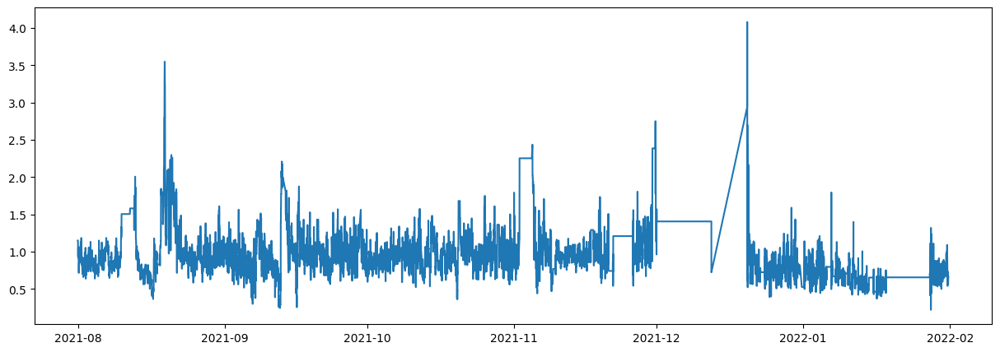

In [20]:

plt.plot(rc22, for_RNN_data_CIVS['SI_f1'])


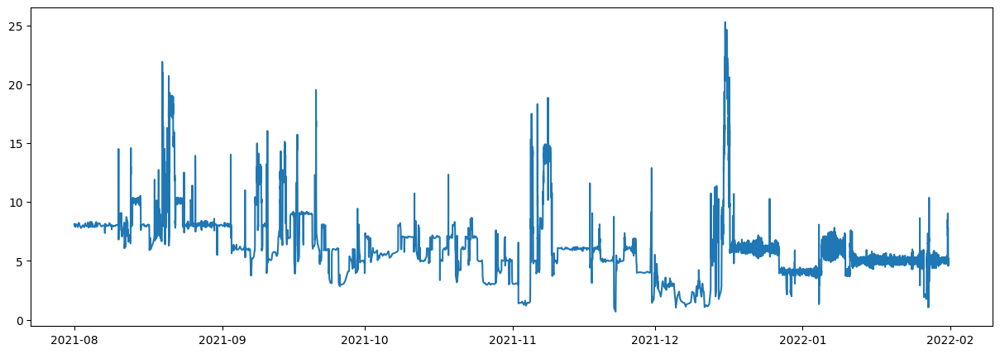

In [21]:

plt.plot(rc22, for_RNN_data_CIVS['HOST_BLAST_MOISTURE_f3'])


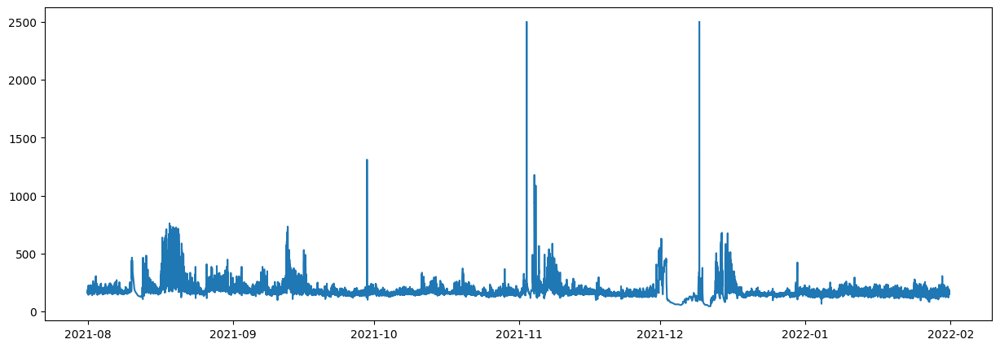

In [22]:

plt.plot(rc22, for_RNN_data_CIVS['NE_Uptake_f3'])


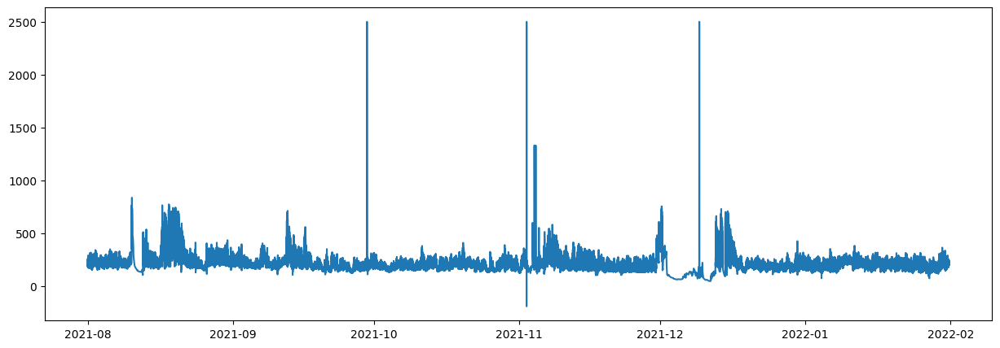

In [23]:

plt.plot(rc22, for_RNN_data_CIVS['SE_Uptake_f3'])


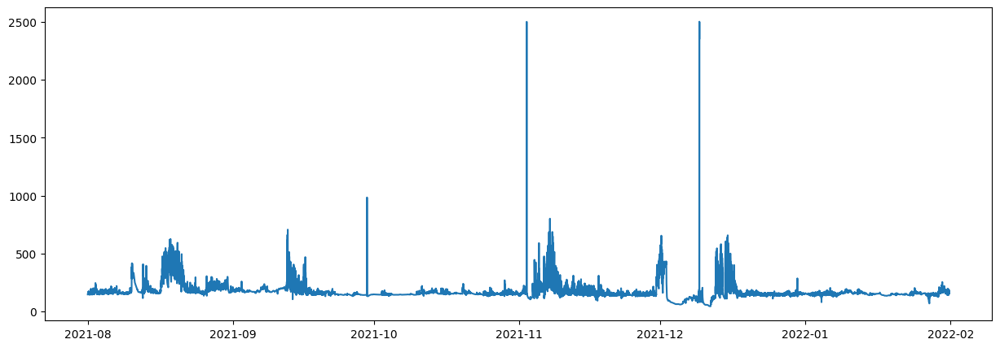

In [24]:

plt.plot(rc22, for_RNN_data_CIVS['NW_Uptake_f3'])


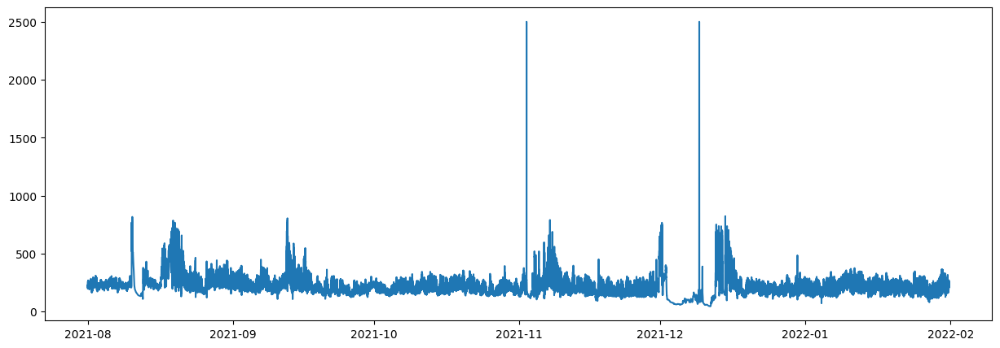

In [25]:

plt.plot(rc22, for_RNN_data_CIVS['SW_Uptake_f3'])


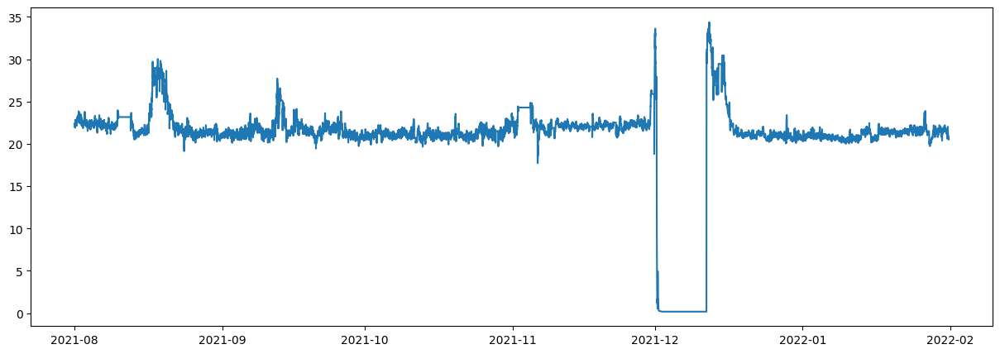

In [26]:

plt.plot(rc22, for_RNN_data_CIVS['Selec_Top_Gas_CO_f3'])


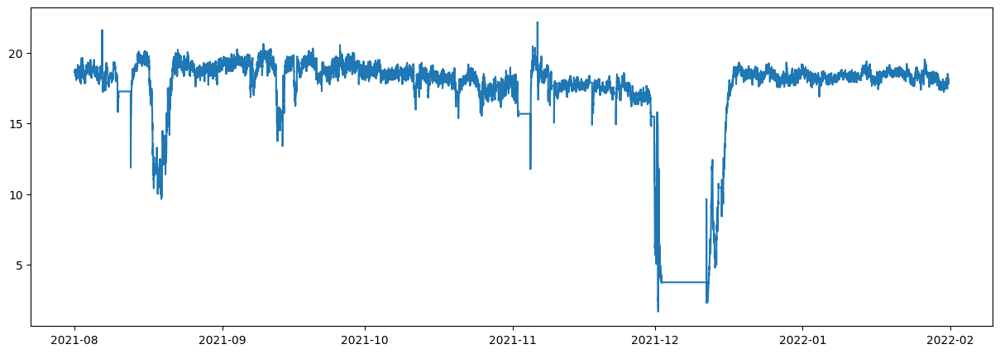

In [27]:

plt.plot(rc22, for_RNN_data_CIVS['Selec_Top_Gas_CO2_f3'])


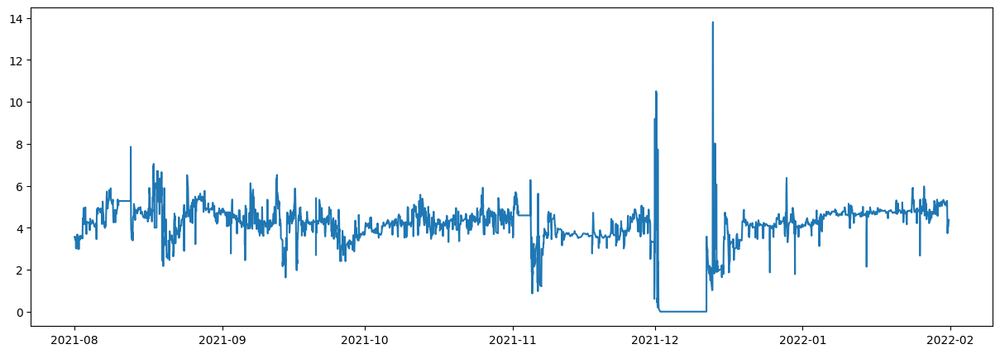

In [28]:

plt.plot(rc22, for_RNN_data_CIVS['Selec_Top_Gas_H2_f3'])


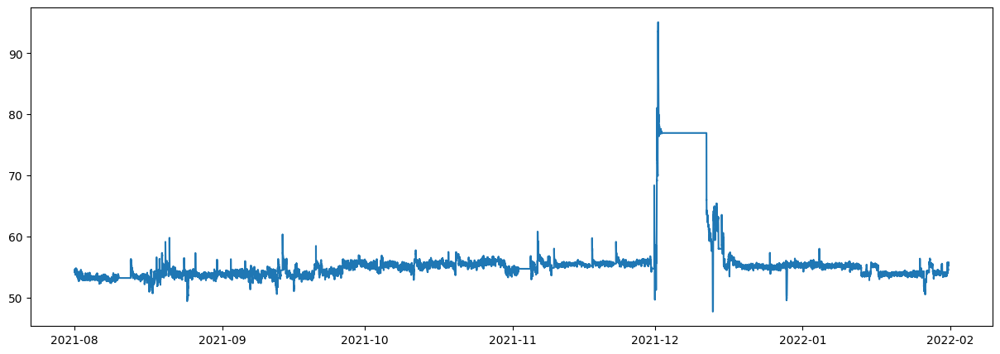

In [29]:

plt.plot(rc22, for_RNN_data_CIVS['Selec_Top_Gas_N2_f3'])


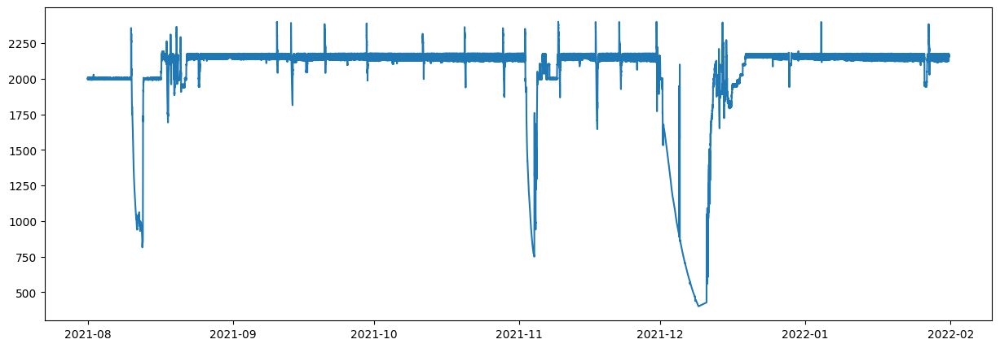

In [30]:

plt.plot(rc22, for_RNN_data_CIVS['HOT_BLAST_TMP_NS_f3'])


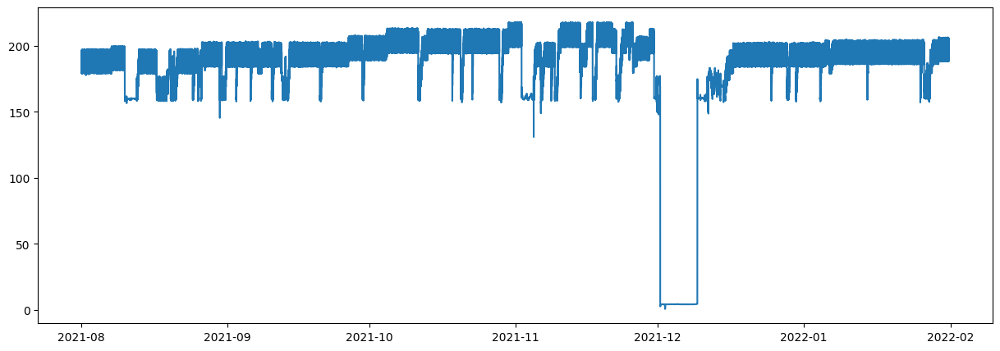

In [31]:

plt.plot(rc22, for_RNN_data_CIVS['WINDRATE_f3'])


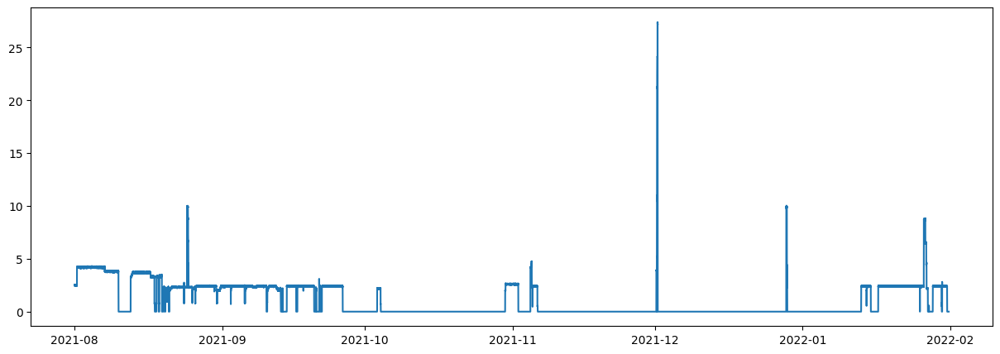

In [32]:

plt.plot(rc22, for_RNN_data_CIVS['HIGH_PURITY_OXYGEN_f3'])


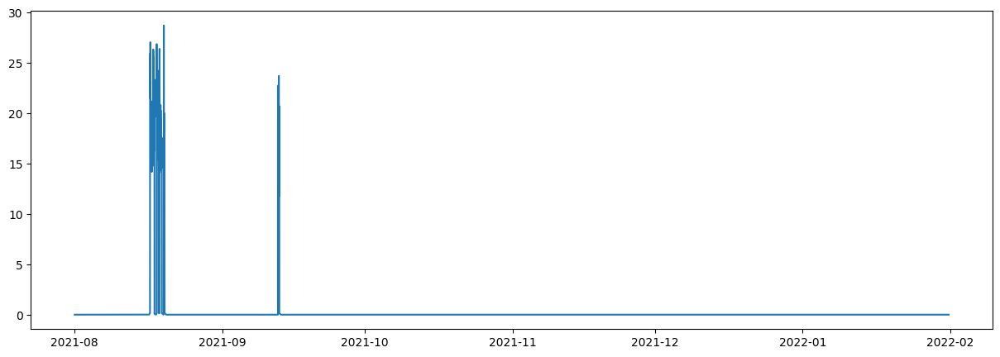

In [33]:

plt.plot(rc22, for_RNN_data_CIVS[ 'COAL_FLOW_f3'])


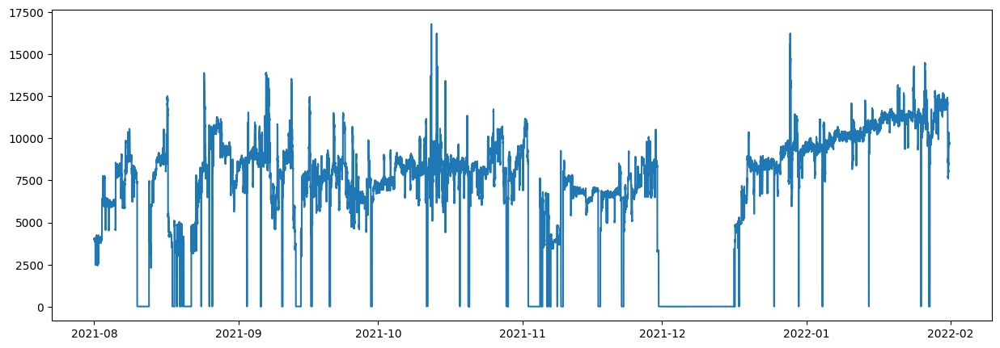

In [34]:

plt.plot(rc22, for_RNN_data_CIVS['NAT_GAS _INJECTION_f3'])


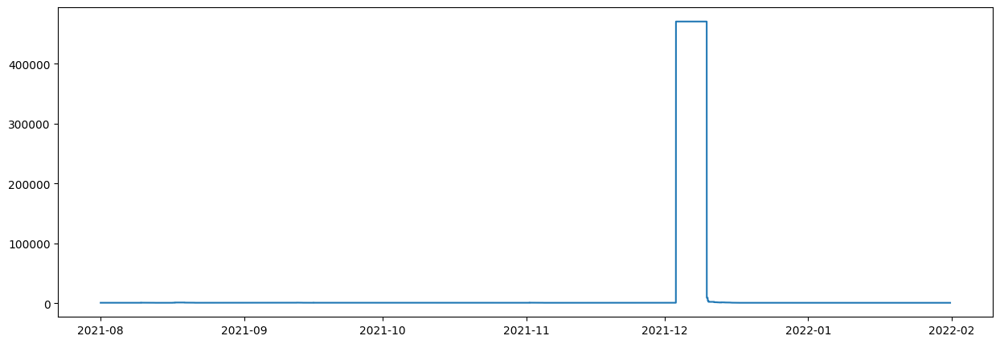

In [35]:

plt.plot(rc22, for_RNN_data_CIVS['Coke_Rate_f3'])


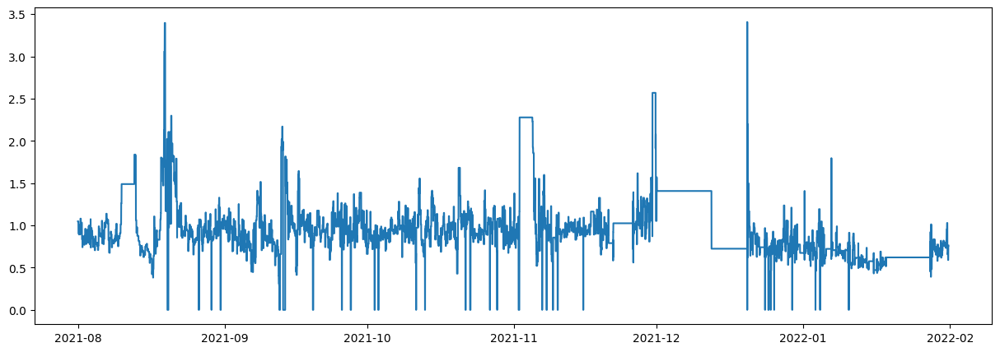

In [36]:

plt.plot(rc22, for_RNN_data_CIVS['Cast_Avg_Si_f2'])


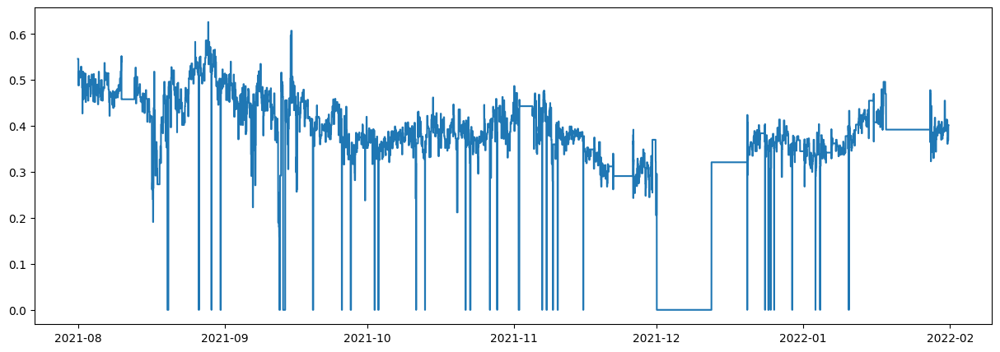

In [37]:

plt.plot(rc22, for_RNN_data_CIVS[ 'Cast_Avg_Mn_f2'])


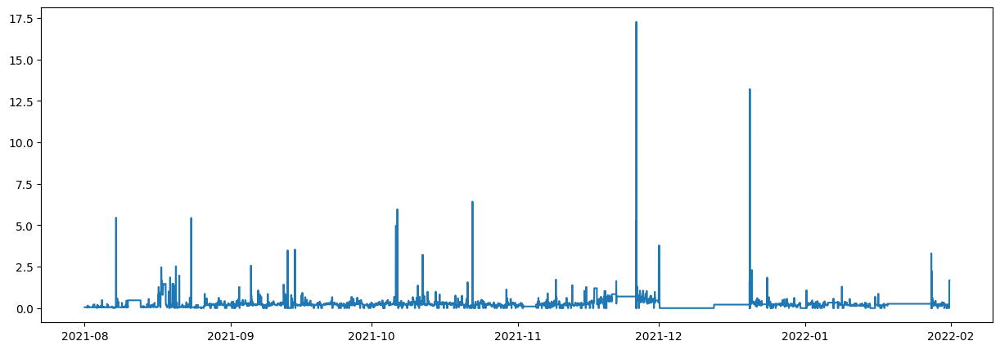

In [38]:

plt.plot(rc22, for_RNN_data_CIVS['Slag_Fe_f2'])



## Back to the Data Processing


In [39]:

l_new2 = ['SI_f1',
 'HOST_BLAST_MOISTURE_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'HOT_BLAST_TMP_NS_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'NAT_GAS _INJECTION_f3',
 'Coke_Rate_f3',
 'Cast_Avg_Si_f2',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2']


In [40]:

## for_RNN_data_CIVS = for_RNN_data_CIVS[ l_new2 ]


In [41]:

for_RNN_data_CIVS.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265736 entries, 0 to 265735
Data columns (total 20 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   SI_f1                   265736 non-null  float64       
 1   MM_Timestamp_f1         265736 non-null  datetime64[ns]
 2   HOST_BLAST_MOISTURE_f3  265736 non-null  float64       
 3   NE_Uptake_f3            265736 non-null  float64       
 4   SE_Uptake_f3            265736 non-null  float64       
 5   NW_Uptake_f3            265736 non-null  float64       
 6   SW_Uptake_f3            265736 non-null  float64       
 7   Selec_Top_Gas_CO_f3     265736 non-null  float64       
 8   Selec_Top_Gas_CO2_f3    265736 non-null  float64       
 9   Selec_Top_Gas_H2_f3     265736 non-null  float64       
 10  Selec_Top_Gas_N2_f3     265736 non-null  float64       
 11  HOT_BLAST_TMP_NS_f3     265736 non-null  float64       
 12  WINDRATE_f3             265736

In [42]:

for_RNN_data_CIVS


,SI_f1,MM_Timestamp_f1,HOST_BLAST_MOISTURE_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,HOT_BLAST_TMP_NS_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,NAT_GAS _INJECTION_f3,Coke_Rate_f3,Cast_Avg_Si_f2,Cast_Avg_Mn_f2,Slag_Fe_f2
0,1.152000,2021-08-01 00:00:00,8.084517,158.478922,245.634175,145.396538,220.717349,22.322068,18.729296,3.559210,54.250139,1999.604384,179.749638,2.510680,0.0,4034.234339,992,1.048,0.546,0.05
1,1.152000,2021-08-01 00:01:00,8.079545,159.637733,252.459217,145.570895,226.360600,22.335329,18.731320,3.559234,54.194257,2000.288837,179.765945,2.489381,0.0,4024.947376,992,1.048,0.546,0.05
2,1.152000,2021-08-01 00:02:00,8.074573,160.796544,252.645736,145.745252,230.297540,22.348590,18.733343,3.559259,54.138374,1999.242862,179.782251,2.489037,0.0,4011.601682,992,1.048,0.546,0.05
3,1.152000,2021-08-01 00:03:00,8.069602,161.955355,247.987563,145.919609,225.220292,22.361852,18.735367,3.559284,54.082797,1999.884442,179.798490,2.496867,0.0,4012.024633,992,1.048,0.546,0.05
4,1.152000,2021-08-01 00:04:00,8.064630,163.102736,226.923719,146.093966,218.827693,22.375113,18.737391,3.559309,54.063779,1999.849729,179.784430,2.501961,0.0,4000.467204,992,1.048,0.546,0.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265731,0.662065,2022-01-31 16:12:00,5.155158,168.935281,202.117809,163.555824,219.714757,20.510372,17.817248,4.376637,55.682915,2162.689809,188.599806,0.000000,0.0,9680.930154,924,0.762,0.402,1.68
265732,0.662446,2022-01-31 16:13:00,5.161362,170.715532,202.106673,164.493156,220.911245,20.510606,17.815391,4.376798,55.688159,2162.438593,188.536026,0.000000,0.0,9665.389423,924,0.762,0.402,1.68
265733,0.662826,2022-01-31 16:14:00,5.167567,172.495783,205.875063,165.430489,222.902059,20.510840,17.813534,4.376959,55.693057,2162.032539,189.264351,0.000000,0.0,9652.217004,924,0.762,0.402,1.68
265734,0.663207,2022-01-31 16:15:00,5.173771,174.440392,212.764586,166.688229,232.269437,20.511074,17.811677,4.377119,55.697567,2160.858603,189.426471,0.000000,0.0,9661.236786,924,0.762,0.402,1.68



## Iterate and mark transitions


In [43]:

for_RNN_data_CIVS.insert(       loc = 0,
                                column = 'control1',
                                value = 0)


for_RNN_data_CIVS.insert(       loc = 0,
                                column = 'control4',
                                value = 0)


for_RNN_data_CIVS.insert(       loc = 0,
                                column = 'control2',
                                value = 0)


for_RNN_data_CIVS.insert(       loc = 0,
                                column = 'control3',
                                value = 0)



for_RNN_data_CIVS


,control3,control2,control4,control1,SI_f1,MM_Timestamp_f1,HOST_BLAST_MOISTURE_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,...,Selec_Top_Gas_N2_f3,HOT_BLAST_TMP_NS_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,NAT_GAS _INJECTION_f3,Coke_Rate_f3,Cast_Avg_Si_f2,Cast_Avg_Mn_f2,Slag_Fe_f2
0,0,0,0,0,1.152000,2021-08-01 00:00:00,8.084517,158.478922,245.634175,145.396538,...,54.250139,1999.604384,179.749638,2.510680,0.0,4034.234339,992,1.048,0.546,0.05
1,0,0,0,0,1.152000,2021-08-01 00:01:00,8.079545,159.637733,252.459217,145.570895,...,54.194257,2000.288837,179.765945,2.489381,0.0,4024.947376,992,1.048,0.546,0.05
2,0,0,0,0,1.152000,2021-08-01 00:02:00,8.074573,160.796544,252.645736,145.745252,...,54.138374,1999.242862,179.782251,2.489037,0.0,4011.601682,992,1.048,0.546,0.05
3,0,0,0,0,1.152000,2021-08-01 00:03:00,8.069602,161.955355,247.987563,145.919609,...,54.082797,1999.884442,179.798490,2.496867,0.0,4012.024633,992,1.048,0.546,0.05
4,0,0,0,0,1.152000,2021-08-01 00:04:00,8.064630,163.102736,226.923719,146.093966,...,54.063779,1999.849729,179.784430,2.501961,0.0,4000.467204,992,1.048,0.546,0.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265731,0,0,0,0,0.662065,2022-01-31 16:12:00,5.155158,168.935281,202.117809,163.555824,...,55.682915,2162.689809,188.599806,0.000000,0.0,9680.930154,924,0.762,0.402,1.68
265732,0,0,0,0,0.662446,2022-01-31 16:13:00,5.161362,170.715532,202.106673,164.493156,...,55.688159,2162.438593,188.536026,0.000000,0.0,9665.389423,924,0.762,0.402,1.68
265733,0,0,0,0,0.662826,2022-01-31 16:14:00,5.167567,172.495783,205.875063,165.430489,...,55.693057,2162.032539,189.264351,0.000000,0.0,9652.217004,924,0.762,0.402,1.68
265734,0,0,0,0,0.663207,2022-01-31 16:15:00,5.173771,174.440392,212.764586,166.688229,...,55.697567,2160.858603,189.426471,0.000000,0.0,9661.236786,924,0.762,0.402,1.68


In [44]:

indeces_to_2500_control2 = []

indeces_to_2500 = [] 

counter_control2 = 0

counter = 500

prev_val = 0.0
    
for index, row in for_RNN_data_CIVS.iterrows():

    ## print( row["SI_f1"]  )
    #########################################################################
    if row["SI_f1"] == prev_val:
        for_RNN_data_CIVS.at[index, 'control1'] = counter
        counter = counter + 1
        indeces_to_2500.append( index )
    else:
        if counter > 2000:
            ## print(counter)
            ## input()
            for_RNN_data_CIVS["control4"][indeces_to_2500 ] = 1
            indeces_to_2500 = []
        else:
            indeces_to_2500 = []
        counter = 0

    ##########################################################################
    if row["SI_f1"] != prev_val:
        for_RNN_data_CIVS.at[index, 'control2'] = counter_control2
        counter_control2 = counter_control2 + 1
        indeces_to_2500_control2.append(  index  )
    else:
        if counter_control2 > 2000:
            ## print(counter)
            ## input()
            for_RNN_data_CIVS["control4"][indeces_to_2500_control2 ] = 1
            indeces_to_2500_control2 = []
        else:
            indeces_to_2500_control2 = []
        counter_control2 = 0

    ##########################################################################
    if row["SI_f1"] == prev_val:
        for_RNN_data_CIVS.at[index, 'control3'] = 1.0

    ##########################################################################
    if index  % 50000 == 0:
        print(index )
    prev_val = row["SI_f1"]
        
    

    


0
50000
100000
150000
200000
250000


array([<Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>, <Axes: xlabel='MM_Timestamp_f1'>,
       <Axes: xlabel='MM_Timestamp_f1'>], dtype=object)

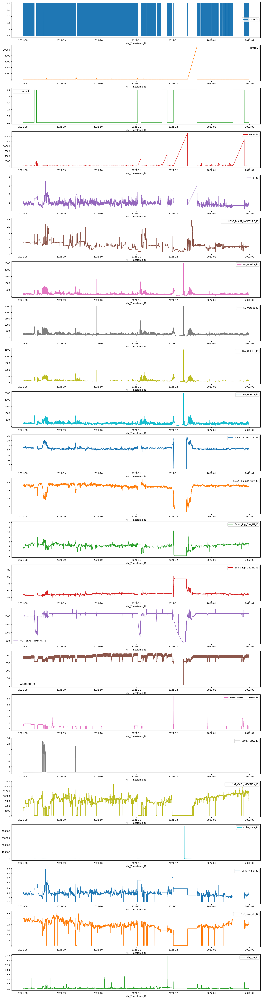

In [45]:

## for_RNN_data_CIVS.plot(  figsize=(20,80),  subplots=True   )


for_RNN_data_CIVS.plot(x='MM_Timestamp_f1' , kind='line', subplots=True, figsize=(20,80),
        sharex=False, sharey=False, legend=True )


In [46]:

for_RNN_data_CIVS


,control3,control2,control4,control1,SI_f1,MM_Timestamp_f1,HOST_BLAST_MOISTURE_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,...,Selec_Top_Gas_N2_f3,HOT_BLAST_TMP_NS_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,NAT_GAS _INJECTION_f3,Coke_Rate_f3,Cast_Avg_Si_f2,Cast_Avg_Mn_f2,Slag_Fe_f2
0,0,0,0,0,1.152000,2021-08-01 00:00:00,8.084517,158.478922,245.634175,145.396538,...,54.250139,1999.604384,179.749638,2.510680,0.0,4034.234339,992,1.048,0.546,0.05
1,1,0,0,0,1.152000,2021-08-01 00:01:00,8.079545,159.637733,252.459217,145.570895,...,54.194257,2000.288837,179.765945,2.489381,0.0,4024.947376,992,1.048,0.546,0.05
2,1,0,0,1,1.152000,2021-08-01 00:02:00,8.074573,160.796544,252.645736,145.745252,...,54.138374,1999.242862,179.782251,2.489037,0.0,4011.601682,992,1.048,0.546,0.05
3,1,0,0,2,1.152000,2021-08-01 00:03:00,8.069602,161.955355,247.987563,145.919609,...,54.082797,1999.884442,179.798490,2.496867,0.0,4012.024633,992,1.048,0.546,0.05
4,1,0,0,3,1.152000,2021-08-01 00:04:00,8.064630,163.102736,226.923719,146.093966,...,54.063779,1999.849729,179.784430,2.501961,0.0,4000.467204,992,1.048,0.546,0.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265731,0,57,0,0,0.662065,2022-01-31 16:12:00,5.155158,168.935281,202.117809,163.555824,...,55.682915,2162.689809,188.599806,0.000000,0.0,9680.930154,924,0.762,0.402,1.68
265732,0,58,0,0,0.662446,2022-01-31 16:13:00,5.161362,170.715532,202.106673,164.493156,...,55.688159,2162.438593,188.536026,0.000000,0.0,9665.389423,924,0.762,0.402,1.68
265733,0,59,0,0,0.662826,2022-01-31 16:14:00,5.167567,172.495783,205.875063,165.430489,...,55.693057,2162.032539,189.264351,0.000000,0.0,9652.217004,924,0.762,0.402,1.68
265734,0,60,0,0,0.663207,2022-01-31 16:15:00,5.173771,174.440392,212.764586,166.688229,...,55.697567,2160.858603,189.426471,0.000000,0.0,9661.236786,924,0.762,0.402,1.68



## Drop row with value above x


In [47]:

## for_RNN_data_CIVS = for_RNN_data_CIVS.drop( for_RNN_data_CIVS[ for_RNN_data_CIVS.control4 == 1 ].index ) ## , inplace = True)

for_RNN_data_CIVS = for_RNN_data_CIVS [ for_RNN_data_CIVS ["control4"] == 0].reset_index( drop=True )  ## this one


In [48]:

for_RNN_data_CIVS


,control3,control2,control4,control1,SI_f1,MM_Timestamp_f1,HOST_BLAST_MOISTURE_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,...,Selec_Top_Gas_N2_f3,HOT_BLAST_TMP_NS_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,NAT_GAS _INJECTION_f3,Coke_Rate_f3,Cast_Avg_Si_f2,Cast_Avg_Mn_f2,Slag_Fe_f2
0,0,0,0,0,1.152000,2021-08-01 00:00:00,8.084517,158.478922,245.634175,145.396538,...,54.250139,1999.604384,179.749638,2.510680,0.0,4034.234339,992,1.048,0.546,0.05
1,1,0,0,0,1.152000,2021-08-01 00:01:00,8.079545,159.637733,252.459217,145.570895,...,54.194257,2000.288837,179.765945,2.489381,0.0,4024.947376,992,1.048,0.546,0.05
2,1,0,0,1,1.152000,2021-08-01 00:02:00,8.074573,160.796544,252.645736,145.745252,...,54.138374,1999.242862,179.782251,2.489037,0.0,4011.601682,992,1.048,0.546,0.05
3,1,0,0,2,1.152000,2021-08-01 00:03:00,8.069602,161.955355,247.987563,145.919609,...,54.082797,1999.884442,179.798490,2.496867,0.0,4012.024633,992,1.048,0.546,0.05
4,1,0,0,3,1.152000,2021-08-01 00:04:00,8.064630,163.102736,226.923719,146.093966,...,54.063779,1999.849729,179.784430,2.501961,0.0,4000.467204,992,1.048,0.546,0.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212427,0,57,0,0,0.662065,2022-01-31 16:12:00,5.155158,168.935281,202.117809,163.555824,...,55.682915,2162.689809,188.599806,0.000000,0.0,9680.930154,924,0.762,0.402,1.68
212428,0,58,0,0,0.662446,2022-01-31 16:13:00,5.161362,170.715532,202.106673,164.493156,...,55.688159,2162.438593,188.536026,0.000000,0.0,9665.389423,924,0.762,0.402,1.68
212429,0,59,0,0,0.662826,2022-01-31 16:14:00,5.167567,172.495783,205.875063,165.430489,...,55.693057,2162.032539,189.264351,0.000000,0.0,9652.217004,924,0.762,0.402,1.68
212430,0,60,0,0,0.663207,2022-01-31 16:15:00,5.173771,174.440392,212.764586,166.688229,...,55.697567,2160.858603,189.426471,0.000000,0.0,9661.236786,924,0.762,0.402,1.68


array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
      dtype=object)

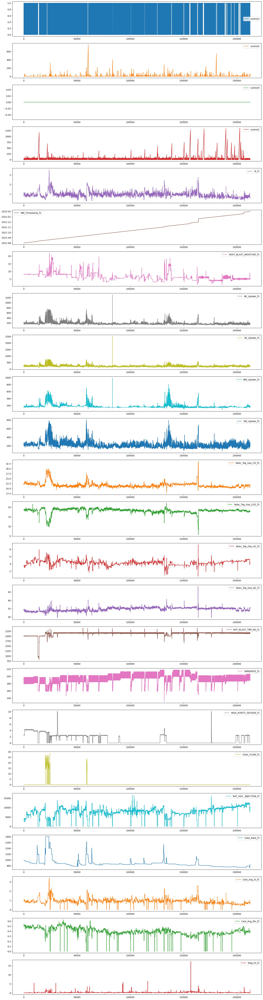

In [49]:

## for_RNN_data_CIVS.plot(  figsize=(20,80),  subplots=True   )

for_RNN_data_CIVS.plot( kind='line', subplots=True, figsize=(20,80),
        sharex=False, sharey=False, legend=True )



## Remove date time columns 


In [50]:

l_new2 = ['SI_f1',
 'HOST_BLAST_MOISTURE_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'HOT_BLAST_TMP_NS_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'NAT_GAS _INJECTION_f3',
 'Coke_Rate_f3',
 'Cast_Avg_Si_f2',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2']


In [51]:

for_RNN_data_CIVS = for_RNN_data_CIVS[ l_new2 ]


In [52]:

for_RNN_data_CIVS.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 212432 entries, 0 to 212431
Data columns (total 19 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   SI_f1                   212432 non-null  float64
 1   HOST_BLAST_MOISTURE_f3  212432 non-null  float64
 2   NE_Uptake_f3            212432 non-null  float64
 3   SE_Uptake_f3            212432 non-null  float64
 4   NW_Uptake_f3            212432 non-null  float64
 5   SW_Uptake_f3            212432 non-null  float64
 6   Selec_Top_Gas_CO_f3     212432 non-null  float64
 7   Selec_Top_Gas_CO2_f3    212432 non-null  float64
 8   Selec_Top_Gas_H2_f3     212432 non-null  float64
 9   Selec_Top_Gas_N2_f3     212432 non-null  float64
 10  HOT_BLAST_TMP_NS_f3     212432 non-null  float64
 11  WINDRATE_f3             212432 non-null  float64
 12  HIGH_PURITY_OXYGEN_f3   212432 non-null  float64
 13  COAL_FLOW_f3            212432 non-null  float64
 14  NAT_GAS _INJECTION_f

In [53]:

for_RNN_data_CIVS


,SI_f1,HOST_BLAST_MOISTURE_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,HOT_BLAST_TMP_NS_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,NAT_GAS _INJECTION_f3,Coke_Rate_f3,Cast_Avg_Si_f2,Cast_Avg_Mn_f2,Slag_Fe_f2
0,1.152000,8.084517,158.478922,245.634175,145.396538,220.717349,22.322068,18.729296,3.559210,54.250139,1999.604384,179.749638,2.510680,0.0,4034.234339,992,1.048,0.546,0.05
1,1.152000,8.079545,159.637733,252.459217,145.570895,226.360600,22.335329,18.731320,3.559234,54.194257,2000.288837,179.765945,2.489381,0.0,4024.947376,992,1.048,0.546,0.05
2,1.152000,8.074573,160.796544,252.645736,145.745252,230.297540,22.348590,18.733343,3.559259,54.138374,1999.242862,179.782251,2.489037,0.0,4011.601682,992,1.048,0.546,0.05
3,1.152000,8.069602,161.955355,247.987563,145.919609,225.220292,22.361852,18.735367,3.559284,54.082797,1999.884442,179.798490,2.496867,0.0,4012.024633,992,1.048,0.546,0.05
4,1.152000,8.064630,163.102736,226.923719,146.093966,218.827693,22.375113,18.737391,3.559309,54.063779,1999.849729,179.784430,2.501961,0.0,4000.467204,992,1.048,0.546,0.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212427,0.662065,5.155158,168.935281,202.117809,163.555824,219.714757,20.510372,17.817248,4.376637,55.682915,2162.689809,188.599806,0.000000,0.0,9680.930154,924,0.762,0.402,1.68
212428,0.662446,5.161362,170.715532,202.106673,164.493156,220.911245,20.510606,17.815391,4.376798,55.688159,2162.438593,188.536026,0.000000,0.0,9665.389423,924,0.762,0.402,1.68
212429,0.662826,5.167567,172.495783,205.875063,165.430489,222.902059,20.510840,17.813534,4.376959,55.693057,2162.032539,189.264351,0.000000,0.0,9652.217004,924,0.762,0.402,1.68
212430,0.663207,5.173771,174.440392,212.764586,166.688229,232.269437,20.511074,17.811677,4.377119,55.697567,2160.858603,189.426471,0.000000,0.0,9661.236786,924,0.762,0.402,1.68



## Average the rows to control time step



## Sanity check


In [54]:



data = [
[20 , 9,   15,  47],
[2,   50,  25,  26],
[4,   11,  38,  44],
[6,   33,  16,  25],
[8 ,  37,  27,  25],
[10,  28,  48,  32],
[12,  47,  35,  45],
[14,  8,   16,  7],
[16,  12,  16,  30],
[18 , 22,  39 , 29],
[20 , 9,   15,  47],
[20 , 9,   15,  47],
[2,   50,  25,  26],
[4,   11,  38,  44],
[6,   33,  16,  25],
[8 ,  37,  27,  25],
[10,  28,  48,  32],
[12,  47,  35,  45],
[14,  8,   16,  7],
[16,  12,  16,  30],
[18 , 22,  39 , 29],
[20 , 9,   15,  47],
[2,   50,  25,  26],
[4,   11,  38,  44],
[6,   33,  16,  25],
[8 ,  37,  27,  25],
[10,  28,  48,  32],
[12,  47,  35,  45],
[14,  8,   16,  7],
[16,  12,  16,  30]
]



df_example = pd.DataFrame( data, columns=['a', 'b', 'c', 'd'] )
 

print(df_example)


     a   b   c   d
0   20   9  15  47
1    2  50  25  26
2    4  11  38  44
3    6  33  16  25
4    8  37  27  25
5   10  28  48  32
6   12  47  35  45
7   14   8  16   7
8   16  12  16  30
9   18  22  39  29
10  20   9  15  47
11  20   9  15  47
12   2  50  25  26
13   4  11  38  44
14   6  33  16  25
15   8  37  27  25
16  10  28  48  32
17  12  47  35  45
18  14   8  16   7
19  16  12  16  30
20  18  22  39  29
21  20   9  15  47
22   2  50  25  26
23   4  11  38  44
24   6  33  16  25
25   8  37  27  25
26  10  28  48  32
27  12  47  35  45
28  14   8  16   7
29  16  12  16  30


In [55]:

print(df_example.shape)


(30, 4)


In [56]:

avg_df_example = df_example.groupby(np.arange(len(df_example))//avg_the_rows_parameter).mean()
avg_df_example.shape


(1, 4)

In [57]:

avg_df_example


,a,b,c,d
0,11.066667,25.266667,26.7,31.6



## Now Avg to change time step


In [58]:

## for_RNN_data_CIVS

print(for_RNN_data_CIVS.shape)


(212432, 19)


In [59]:

for_RNN_data_CIVS = for_RNN_data_CIVS.groupby(np.arange(len(for_RNN_data_CIVS))//avg_the_rows_parameter).mean()
for_RNN_data_CIVS.shape


(7082, 19)

In [60]:

for_RNN_data_CIVS


,SI_f1,HOST_BLAST_MOISTURE_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,HOT_BLAST_TMP_NS_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,NAT_GAS _INJECTION_f3,Coke_Rate_f3,Cast_Avg_Si_f2,Cast_Avg_Mn_f2,Slag_Fe_f2
0,1.108000,8.024506,158.729666,212.358825,147.924713,209.309713,22.310169,18.711507,3.559568,54.147579,1998.931834,180.738725,2.494778,0.0,4019.473786,992.0,1.048000,0.546000,0.050
1,0.932000,8.118498,175.146033,211.228338,154.863268,225.775004,22.131139,18.627050,3.560314,54.256238,2002.184251,180.074070,2.500274,0.0,4013.138209,992.0,1.048000,0.546000,0.050
2,1.037833,8.083251,181.347682,221.346494,156.957409,236.529020,22.068835,18.568728,3.561673,54.379957,1999.559922,180.846189,2.501140,0.0,4010.597199,992.0,1.048000,0.546000,0.050
3,1.059000,8.031831,187.182173,229.730127,157.035268,244.685378,22.001893,18.542784,3.563502,54.492525,1998.886100,180.330778,2.499367,0.0,4009.920353,992.0,1.048000,0.546000,0.050
4,0.964333,7.980411,184.583279,229.603971,161.489804,242.458502,22.141760,18.654745,3.557004,54.304156,1999.582291,180.045291,2.500893,0.0,3970.606236,992.0,1.029067,0.538267,0.050
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7077,0.565133,4.830594,163.094466,208.909404,162.467210,215.832669,20.742204,18.103771,4.360173,55.352050,2156.248707,190.120272,0.000000,0.0,9679.291675,924.0,0.590000,0.369000,0.000
7078,0.602500,4.873487,170.117821,218.768900,165.610459,234.636540,20.815511,18.004222,4.364992,55.415638,2169.107880,190.297789,0.000000,0.0,9627.134747,924.0,0.590000,0.369000,0.000
7079,0.645897,4.989997,163.638488,210.213733,162.189832,224.787771,20.831189,17.899722,4.369811,55.403079,2169.712912,189.362734,0.000000,0.0,9680.936331,924.0,0.670267,0.384400,0.784
7080,0.657310,5.083703,166.969232,213.854707,164.488948,228.306758,20.564781,17.838864,4.374629,55.635157,2161.870325,190.178854,0.000000,0.0,9707.204561,924.0,0.762000,0.402000,1.680



## Create datasets of selected features


In [61]:

pd.options.display.max_columns = None


In [62]:

def window_seq_conversion_multi_feature(df, window, target_index):
    d = df.values
    ## print( d )
    print( d.shape )
    x = []
    n = len(df)
    n_features = df.shape[1]
    ## print(n_features)
    ## print(n)

    idx = df.index[ : -window]
    print(idx)
    print(  idx.shape  )


    for start in range(n-window):
        end = start + window
        ## print(start, "....", end)
        x.append( d[ start:end, : ] )

    ## print(x)
    cols_x = [ f'xt_{i}_fx_{j}' for i in range(1, window+1) for j in range(0, n_features)]
    cols_y = [ f'y_fy_{j}' for j in range(0, n_features)]
    ## print(  cols  )

    x = np.array(x)
    print(x.shape)
    x = np.array(x).reshape(n-window, -1)
    print(x.shape)

    y = df.iloc[ window: , : ].values
    print( y.shape )
    ## print( y.reshape(-1).shape )

    df_xs = pd.DataFrame(x  , columns=cols_x,  index=idx)
    df_y  = pd.DataFrame(y  , columns=cols_y,  index=idx)
    ## print(df_y)
    return pd.concat( [df_xs, df_y], axis=1 )



## Make Data Sequential


In [63]:

 
res_multi_feature_df = window_seq_conversion_multi_feature( for_RNN_data_CIVS, window,  silicon_feature_index )


(7082, 19)
Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
       ...
       7069, 7070, 7071, 7072, 7073, 7074, 7075, 7076, 7077, 7078],
      dtype='int64', length=7079)
(7079,)
(7079, 3, 19)
(7079, 57)
(7079, 19)


In [64]:

res_multi_feature_df


,xt_1_fx_0,xt_1_fx_1,xt_1_fx_2,xt_1_fx_3,xt_1_fx_4,xt_1_fx_5,xt_1_fx_6,xt_1_fx_7,xt_1_fx_8,xt_1_fx_9,xt_1_fx_10,xt_1_fx_11,xt_1_fx_12,xt_1_fx_13,xt_1_fx_14,xt_1_fx_15,xt_1_fx_16,xt_1_fx_17,xt_1_fx_18,xt_2_fx_0,xt_2_fx_1,xt_2_fx_2,xt_2_fx_3,xt_2_fx_4,xt_2_fx_5,xt_2_fx_6,xt_2_fx_7,xt_2_fx_8,xt_2_fx_9,xt_2_fx_10,xt_2_fx_11,xt_2_fx_12,xt_2_fx_13,xt_2_fx_14,xt_2_fx_15,xt_2_fx_16,xt_2_fx_17,xt_2_fx_18,xt_3_fx_0,xt_3_fx_1,xt_3_fx_2,xt_3_fx_3,xt_3_fx_4,xt_3_fx_5,xt_3_fx_6,xt_3_fx_7,xt_3_fx_8,xt_3_fx_9,xt_3_fx_10,xt_3_fx_11,xt_3_fx_12,xt_3_fx_13,xt_3_fx_14,xt_3_fx_15,xt_3_fx_16,xt_3_fx_17,xt_3_fx_18,y_fy_0,y_fy_1,y_fy_2,y_fy_3,y_fy_4,y_fy_5,y_fy_6,y_fy_7,y_fy_8,y_fy_9,y_fy_10,y_fy_11,y_fy_12,y_fy_13,y_fy_14,y_fy_15,y_fy_16,y_fy_17,y_fy_18
0,1.108000,8.024506,158.729666,212.358825,147.924713,209.309713,22.310169,18.711507,3.559568,54.147579,1998.931834,180.738725,2.494778,0.0,4019.473786,992.0,1.048000,0.546000,0.050000,0.932000,8.118498,175.146033,211.228338,154.863268,225.775004,22.131139,18.627050,3.560314,54.256238,2002.184251,180.074070,2.500274,0.0,4013.138209,992.0,1.048000,0.546000,0.050000,1.037833,8.083251,181.347682,221.346494,156.957409,236.529020,22.068835,18.568728,3.561673,54.379957,1999.559922,180.846189,2.501140,0.0,4010.597199,992.0,1.048000,0.546000,0.050000,1.059000,8.031831,187.182173,229.730127,157.035268,244.685378,22.001893,18.542784,3.563502,54.492525,1998.886100,180.330778,2.499367,0.0,4009.920353,992.0,1.048000,0.546000,0.050
1,0.932000,8.118498,175.146033,211.228338,154.863268,225.775004,22.131139,18.627050,3.560314,54.256238,2002.184251,180.074070,2.500274,0.0,4013.138209,992.0,1.048000,0.546000,0.050000,1.037833,8.083251,181.347682,221.346494,156.957409,236.529020,22.068835,18.568728,3.561673,54.379957,1999.559922,180.846189,2.501140,0.0,4010.597199,992.0,1.048000,0.546000,0.050000,1.059000,8.031831,187.182173,229.730127,157.035268,244.685378,22.001893,18.542784,3.563502,54.492525,1998.886100,180.330778,2.499367,0.0,4009.920353,992.0,1.048000,0.546000,0.050000,0.964333,7.980411,184.583279,229.603971,161.489804,242.458502,22.141760,18.654745,3.557004,54.304156,1999.582291,180.045291,2.500893,0.0,3970.606236,992.0,1.029067,0.538267,0.050
2,1.037833,8.083251,181.347682,221.346494,156.957409,236.529020,22.068835,18.568728,3.561673,54.379957,1999.559922,180.846189,2.501140,0.0,4010.597199,992.0,1.048000,0.546000,0.050000,1.059000,8.031831,187.182173,229.730127,157.035268,244.685378,22.001893,18.542784,3.563502,54.492525,1998.886100,180.330778,2.499367,0.0,4009.920353,992.0,1.048000,0.546000,0.050000,0.964333,7.980411,184.583279,229.603971,161.489804,242.458502,22.141760,18.654745,3.557004,54.304156,1999.582291,180.045291,2.500893,0.0,3970.606236,992.0,1.029067,0.538267,0.050000,1.019467,7.928990,173.269960,220.569094,153.067483,228.942806,22.140504,18.779676,3.474496,54.235106,2000.377529,180.602305,2.501619,0.0,3908.180244,992.0,0.906000,0.488000,0.050
3,1.059000,8.031831,187.182173,229.730127,157.035268,244.685378,22.001893,18.542784,3.563502,54.492525,1998.886100,180.330778,2.499367,0.0,4009.920353,992.0,1.048000,0.546000,0.050000,0.964333,7.980411,184.583279,229.603971,161.489804,242.458502,22.141760,18.654745,3.557004,54.304156,1999.582291,180.045291,2.500893,0.0,3970.606236,992.0,1.029067,0.538267,0.050000,1.019467,7.928990,173.269960,220.569094,153.067483,228.942806,22.140504,18.779676,3.474496,54.235106,2000.377529,180.602305,2.501619,0.0,3908.180244,992.0,0.906000,0.488000,0.050000,0.978200,7.938689,161.442145,208.191098,150.562328,216.738663,22.353126,18.639537,3.473435,54.146978,2000.228818,180.009601,2.503149,0.0,3935.319570,992.0,0.906000,0.488000,0.050
4,0.964333,7.980411,184.583279,229.603971,161.489804,242.458502,22.141760,18.654745,3.557004,54.304156,1999.582291,180.045291,2.500893,0.0,3970.606236,992.0,1.029067,0.538267,0.050000,1.019467,7.928990,173.269960,220.569094,153.067483,228.942806,22.140504,18.779676,3.474496,54.235106,2000.377529,180.602305,2.501619,0.0,3908.180244,992.0,0.906000,0.48

In [65]:

print( res_multi_feature_df.shape )


(7079, 76)



## Drop desired columns from Sequential Data Frame (such as silicon from X)


In [66]:

'''

df = res_multi_feature_df

df.drop(  list(   df.filter(regex='_fx_0')   ), axis=1, inplace=True)

no_silicon_in_seq_X_df = df

print( df.shape )

'''


"\n\ndf = res_multi_feature_df\n\ndf.drop(  list(   df.filter(regex='_fx_0')   ), axis=1, inplace=True)\n\nno_silicon_in_seq_X_df = df\n\nprint( df.shape )\n\n"

In [67]:

print( res_multi_feature_df.shape )


(7079, 76)


In [68]:

res_multi_feature_df


,xt_1_fx_0,xt_1_fx_1,xt_1_fx_2,xt_1_fx_3,xt_1_fx_4,xt_1_fx_5,xt_1_fx_6,xt_1_fx_7,xt_1_fx_8,xt_1_fx_9,xt_1_fx_10,xt_1_fx_11,xt_1_fx_12,xt_1_fx_13,xt_1_fx_14,xt_1_fx_15,xt_1_fx_16,xt_1_fx_17,xt_1_fx_18,xt_2_fx_0,xt_2_fx_1,xt_2_fx_2,xt_2_fx_3,xt_2_fx_4,xt_2_fx_5,xt_2_fx_6,xt_2_fx_7,xt_2_fx_8,xt_2_fx_9,xt_2_fx_10,xt_2_fx_11,xt_2_fx_12,xt_2_fx_13,xt_2_fx_14,xt_2_fx_15,xt_2_fx_16,xt_2_fx_17,xt_2_fx_18,xt_3_fx_0,xt_3_fx_1,xt_3_fx_2,xt_3_fx_3,xt_3_fx_4,xt_3_fx_5,xt_3_fx_6,xt_3_fx_7,xt_3_fx_8,xt_3_fx_9,xt_3_fx_10,xt_3_fx_11,xt_3_fx_12,xt_3_fx_13,xt_3_fx_14,xt_3_fx_15,xt_3_fx_16,xt_3_fx_17,xt_3_fx_18,y_fy_0,y_fy_1,y_fy_2,y_fy_3,y_fy_4,y_fy_5,y_fy_6,y_fy_7,y_fy_8,y_fy_9,y_fy_10,y_fy_11,y_fy_12,y_fy_13,y_fy_14,y_fy_15,y_fy_16,y_fy_17,y_fy_18
0,1.108000,8.024506,158.729666,212.358825,147.924713,209.309713,22.310169,18.711507,3.559568,54.147579,1998.931834,180.738725,2.494778,0.0,4019.473786,992.0,1.048000,0.546000,0.050000,0.932000,8.118498,175.146033,211.228338,154.863268,225.775004,22.131139,18.627050,3.560314,54.256238,2002.184251,180.074070,2.500274,0.0,4013.138209,992.0,1.048000,0.546000,0.050000,1.037833,8.083251,181.347682,221.346494,156.957409,236.529020,22.068835,18.568728,3.561673,54.379957,1999.559922,180.846189,2.501140,0.0,4010.597199,992.0,1.048000,0.546000,0.050000,1.059000,8.031831,187.182173,229.730127,157.035268,244.685378,22.001893,18.542784,3.563502,54.492525,1998.886100,180.330778,2.499367,0.0,4009.920353,992.0,1.048000,0.546000,0.050
1,0.932000,8.118498,175.146033,211.228338,154.863268,225.775004,22.131139,18.627050,3.560314,54.256238,2002.184251,180.074070,2.500274,0.0,4013.138209,992.0,1.048000,0.546000,0.050000,1.037833,8.083251,181.347682,221.346494,156.957409,236.529020,22.068835,18.568728,3.561673,54.379957,1999.559922,180.846189,2.501140,0.0,4010.597199,992.0,1.048000,0.546000,0.050000,1.059000,8.031831,187.182173,229.730127,157.035268,244.685378,22.001893,18.542784,3.563502,54.492525,1998.886100,180.330778,2.499367,0.0,4009.920353,992.0,1.048000,0.546000,0.050000,0.964333,7.980411,184.583279,229.603971,161.489804,242.458502,22.141760,18.654745,3.557004,54.304156,1999.582291,180.045291,2.500893,0.0,3970.606236,992.0,1.029067,0.538267,0.050
2,1.037833,8.083251,181.347682,221.346494,156.957409,236.529020,22.068835,18.568728,3.561673,54.379957,1999.559922,180.846189,2.501140,0.0,4010.597199,992.0,1.048000,0.546000,0.050000,1.059000,8.031831,187.182173,229.730127,157.035268,244.685378,22.001893,18.542784,3.563502,54.492525,1998.886100,180.330778,2.499367,0.0,4009.920353,992.0,1.048000,0.546000,0.050000,0.964333,7.980411,184.583279,229.603971,161.489804,242.458502,22.141760,18.654745,3.557004,54.304156,1999.582291,180.045291,2.500893,0.0,3970.606236,992.0,1.029067,0.538267,0.050000,1.019467,7.928990,173.269960,220.569094,153.067483,228.942806,22.140504,18.779676,3.474496,54.235106,2000.377529,180.602305,2.501619,0.0,3908.180244,992.0,0.906000,0.488000,0.050
3,1.059000,8.031831,187.182173,229.730127,157.035268,244.685378,22.001893,18.542784,3.563502,54.492525,1998.886100,180.330778,2.499367,0.0,4009.920353,992.0,1.048000,0.546000,0.050000,0.964333,7.980411,184.583279,229.603971,161.489804,242.458502,22.141760,18.654745,3.557004,54.304156,1999.582291,180.045291,2.500893,0.0,3970.606236,992.0,1.029067,0.538267,0.050000,1.019467,7.928990,173.269960,220.569094,153.067483,228.942806,22.140504,18.779676,3.474496,54.235106,2000.377529,180.602305,2.501619,0.0,3908.180244,992.0,0.906000,0.488000,0.050000,0.978200,7.938689,161.442145,208.191098,150.562328,216.738663,22.353126,18.639537,3.473435,54.146978,2000.228818,180.009601,2.503149,0.0,3935.319570,992.0,0.906000,0.488000,0.050
4,0.964333,7.980411,184.583279,229.603971,161.489804,242.458502,22.141760,18.654745,3.557004,54.304156,1999.582291,180.045291,2.500893,0.0,3970.606236,992.0,1.029067,0.538267,0.050000,1.019467,7.928990,173.269960,220.569094,153.067483,228.942806,22.140504,18.779676,3.474496,54.235106,2000.377529,180.602305,2.501619,0.0,3908.180244,992.0,0.906000,0.48


## Drop last in X input sequence

* predict the one not seen , i think




In [69]:

window_str = str(window)
window_str


'3'

In [70]:

string_match_last_seq = "xt_" + window_str
string_match_last_seq 


'xt_3'

In [71]:

'''

df = res_multi_feature_df

df.drop(  list(   df.filter(regex=string_match_last_seq)   ), axis=1, inplace=True)

no_silicon_in_seq_X_df = df

print( df.shape )

'''


'\n\ndf = res_multi_feature_df\n\ndf.drop(  list(   df.filter(regex=string_match_last_seq)   ), axis=1, inplace=True)\n\nno_silicon_in_seq_X_df = df\n\nprint( df.shape )\n\n'

In [72]:

print( res_multi_feature_df.shape )


(7079, 76)


In [73]:

res_multi_feature_df


,xt_1_fx_0,xt_1_fx_1,xt_1_fx_2,xt_1_fx_3,xt_1_fx_4,xt_1_fx_5,xt_1_fx_6,xt_1_fx_7,xt_1_fx_8,xt_1_fx_9,xt_1_fx_10,xt_1_fx_11,xt_1_fx_12,xt_1_fx_13,xt_1_fx_14,xt_1_fx_15,xt_1_fx_16,xt_1_fx_17,xt_1_fx_18,xt_2_fx_0,xt_2_fx_1,xt_2_fx_2,xt_2_fx_3,xt_2_fx_4,xt_2_fx_5,xt_2_fx_6,xt_2_fx_7,xt_2_fx_8,xt_2_fx_9,xt_2_fx_10,xt_2_fx_11,xt_2_fx_12,xt_2_fx_13,xt_2_fx_14,xt_2_fx_15,xt_2_fx_16,xt_2_fx_17,xt_2_fx_18,xt_3_fx_0,xt_3_fx_1,xt_3_fx_2,xt_3_fx_3,xt_3_fx_4,xt_3_fx_5,xt_3_fx_6,xt_3_fx_7,xt_3_fx_8,xt_3_fx_9,xt_3_fx_10,xt_3_fx_11,xt_3_fx_12,xt_3_fx_13,xt_3_fx_14,xt_3_fx_15,xt_3_fx_16,xt_3_fx_17,xt_3_fx_18,y_fy_0,y_fy_1,y_fy_2,y_fy_3,y_fy_4,y_fy_5,y_fy_6,y_fy_7,y_fy_8,y_fy_9,y_fy_10,y_fy_11,y_fy_12,y_fy_13,y_fy_14,y_fy_15,y_fy_16,y_fy_17,y_fy_18
0,1.108000,8.024506,158.729666,212.358825,147.924713,209.309713,22.310169,18.711507,3.559568,54.147579,1998.931834,180.738725,2.494778,0.0,4019.473786,992.0,1.048000,0.546000,0.050000,0.932000,8.118498,175.146033,211.228338,154.863268,225.775004,22.131139,18.627050,3.560314,54.256238,2002.184251,180.074070,2.500274,0.0,4013.138209,992.0,1.048000,0.546000,0.050000,1.037833,8.083251,181.347682,221.346494,156.957409,236.529020,22.068835,18.568728,3.561673,54.379957,1999.559922,180.846189,2.501140,0.0,4010.597199,992.0,1.048000,0.546000,0.050000,1.059000,8.031831,187.182173,229.730127,157.035268,244.685378,22.001893,18.542784,3.563502,54.492525,1998.886100,180.330778,2.499367,0.0,4009.920353,992.0,1.048000,0.546000,0.050
1,0.932000,8.118498,175.146033,211.228338,154.863268,225.775004,22.131139,18.627050,3.560314,54.256238,2002.184251,180.074070,2.500274,0.0,4013.138209,992.0,1.048000,0.546000,0.050000,1.037833,8.083251,181.347682,221.346494,156.957409,236.529020,22.068835,18.568728,3.561673,54.379957,1999.559922,180.846189,2.501140,0.0,4010.597199,992.0,1.048000,0.546000,0.050000,1.059000,8.031831,187.182173,229.730127,157.035268,244.685378,22.001893,18.542784,3.563502,54.492525,1998.886100,180.330778,2.499367,0.0,4009.920353,992.0,1.048000,0.546000,0.050000,0.964333,7.980411,184.583279,229.603971,161.489804,242.458502,22.141760,18.654745,3.557004,54.304156,1999.582291,180.045291,2.500893,0.0,3970.606236,992.0,1.029067,0.538267,0.050
2,1.037833,8.083251,181.347682,221.346494,156.957409,236.529020,22.068835,18.568728,3.561673,54.379957,1999.559922,180.846189,2.501140,0.0,4010.597199,992.0,1.048000,0.546000,0.050000,1.059000,8.031831,187.182173,229.730127,157.035268,244.685378,22.001893,18.542784,3.563502,54.492525,1998.886100,180.330778,2.499367,0.0,4009.920353,992.0,1.048000,0.546000,0.050000,0.964333,7.980411,184.583279,229.603971,161.489804,242.458502,22.141760,18.654745,3.557004,54.304156,1999.582291,180.045291,2.500893,0.0,3970.606236,992.0,1.029067,0.538267,0.050000,1.019467,7.928990,173.269960,220.569094,153.067483,228.942806,22.140504,18.779676,3.474496,54.235106,2000.377529,180.602305,2.501619,0.0,3908.180244,992.0,0.906000,0.488000,0.050
3,1.059000,8.031831,187.182173,229.730127,157.035268,244.685378,22.001893,18.542784,3.563502,54.492525,1998.886100,180.330778,2.499367,0.0,4009.920353,992.0,1.048000,0.546000,0.050000,0.964333,7.980411,184.583279,229.603971,161.489804,242.458502,22.141760,18.654745,3.557004,54.304156,1999.582291,180.045291,2.500893,0.0,3970.606236,992.0,1.029067,0.538267,0.050000,1.019467,7.928990,173.269960,220.569094,153.067483,228.942806,22.140504,18.779676,3.474496,54.235106,2000.377529,180.602305,2.501619,0.0,3908.180244,992.0,0.906000,0.488000,0.050000,0.978200,7.938689,161.442145,208.191098,150.562328,216.738663,22.353126,18.639537,3.473435,54.146978,2000.228818,180.009601,2.503149,0.0,3935.319570,992.0,0.906000,0.488000,0.050
4,0.964333,7.980411,184.583279,229.603971,161.489804,242.458502,22.141760,18.654745,3.557004,54.304156,1999.582291,180.045291,2.500893,0.0,3970.606236,992.0,1.029067,0.538267,0.050000,1.019467,7.928990,173.269960,220.569094,153.067483,228.942806,22.140504,18.779676,3.474496,54.235106,2000.377529,180.602305,2.501619,0.0,3908.180244,992.0,0.906000,0.48


## Need to adjust windows based on previous step


In [74]:


## window = window - 1



In [75]:


window


3


## Utility Functions


In [76]:

class Standardize:
    
    def __init__(self, df, split=0.10):
        self.data  = df
        self.split = split
    
    def split_data(self):
        n           = int( len( self.data ) * self.split )
        train       = self.data.iloc[   :-n ] 
        test        = self.data.iloc[ -n:   ]
        n           = int( len(   train   ) * self.split )
        train       = train.iloc[   :-n ] 
        val         = train.iloc[ -n:   ]
        assert len(test) + len(train) + len(val) == len(self.data)
        return train, test, val
    
    def _transform(self, data):
        data_s = ( data - self.mu ) / self.sigma          
        return data_s
    
    def fit_transform(self):
        train, test, val    = self.split_data()
        self.mu             = train.mean() 
        self.sigma          = train.std()
        train_s             = self._transform( train )
        test_s              = self._transform( test  )
        val_s               = self._transform( val   )
        return train_s, test_s, val_s
    
    def inverse(self,   data):
        return ( data * self.sigma     ) + self.mu          ## all data
        
    def inverse_y(self, data):
        print(self.sigma.shape)
        print(self.mu.shape)
        print(self.mu[-19:].shape)
        print(self.sigma[-19:].shape)
        print(data.shape)
        the_sigma = self.sigma[-19:]
        the_mu    = self.mu[-19:]

        the_sigma = np.expand_dims(the_sigma, axis=0)
        the_mu    = np.expand_dims(the_mu,    axis=0)

        print(the_sigma.shape)
        print(the_sigma.shape)
        
        return ( data * the_sigma ) + the_mu       


In [77]:

scale_civs = Standardize(  res_multi_feature_df , split=0.20 )


In [78]:

train_si, test_si, val_si = scale_civs.fit_transform()


In [79]:

train_si


,xt_1_fx_0,xt_1_fx_1,xt_1_fx_2,xt_1_fx_3,xt_1_fx_4,xt_1_fx_5,xt_1_fx_6,xt_1_fx_7,xt_1_fx_8,xt_1_fx_9,xt_1_fx_10,xt_1_fx_11,xt_1_fx_12,xt_1_fx_13,xt_1_fx_14,xt_1_fx_15,xt_1_fx_16,xt_1_fx_17,xt_1_fx_18,xt_2_fx_0,xt_2_fx_1,xt_2_fx_2,xt_2_fx_3,xt_2_fx_4,xt_2_fx_5,xt_2_fx_6,xt_2_fx_7,xt_2_fx_8,xt_2_fx_9,xt_2_fx_10,xt_2_fx_11,xt_2_fx_12,xt_2_fx_13,xt_2_fx_14,xt_2_fx_15,xt_2_fx_16,xt_2_fx_17,xt_2_fx_18,xt_3_fx_0,xt_3_fx_1,xt_3_fx_2,xt_3_fx_3,xt_3_fx_4,xt_3_fx_5,xt_3_fx_6,xt_3_fx_7,xt_3_fx_8,xt_3_fx_9,xt_3_fx_10,xt_3_fx_11,xt_3_fx_12,xt_3_fx_13,xt_3_fx_14,xt_3_fx_15,xt_3_fx_16,xt_3_fx_17,xt_3_fx_18,y_fy_0,y_fy_1,y_fy_2,y_fy_3,y_fy_4,y_fy_5,y_fy_6,y_fy_7,y_fy_8,y_fy_9,y_fy_10,y_fy_11,y_fy_12,y_fy_13,y_fy_14,y_fy_15,y_fy_16,y_fy_17,y_fy_18
0,0.359510,0.444220,-0.532473,-0.083250,-0.573393,-0.276650,0.368827,0.287175,-1.034841,-0.270032,-0.935032,-0.417813,0.571232,-0.156927,-1.182443,0.343127,0.262407,1.531672,-0.492514,-0.212882,0.482817,-0.228547,-0.102978,-0.443680,-0.009416,0.243516,0.228536,-1.033816,-0.169508,-0.909963,-0.482458,0.575134,-0.156927,-1.184744,0.343279,0.262377,1.532417,-0.492567,0.131186,0.466952,-0.113873,0.070805,-0.404792,0.165108,0.199956,0.188009,-1.031914,-0.055007,-0.930189,-0.407619,0.576010,-0.156927,-1.185663,0.343430,0.262346,1.533163,-0.492621,0.199959,0.444407,-0.006012,0.214785,-0.403674,0.297428,0.153171,0.169937,-1.029380,0.049177,-0.935382,-0.457780,0.575162,-0.156927,-1.185879,0.343581,0.262315,1.533910,-0.492674
1,-0.212905,0.483856,-0.228159,-0.102695,-0.443289,-0.009021,0.243421,0.228452,-1.033784,-0.169277,-0.909962,-0.482333,0.574824,-0.156927,-1.184833,0.343127,0.262407,1.531672,-0.492514,0.131329,0.467968,-0.113608,0.071028,-0.404435,0.165338,0.199873,0.187985,-1.031886,-0.054797,-0.930192,-0.407504,0.575700,-0.156927,-1.185702,0.343279,0.262377,1.532417,-0.492567,0.200027,0.445311,-0.005751,0.214970,-0.403334,0.297636,0.153064,0.169970,-1.029319,0.049358,-0.935383,-0.457655,0.574851,-0.156927,-1.185918,0.343430,0.262346,1.533163,-0.492621,-0.107924,0.422784,-0.054168,0.212616,-0.320244,0.261249,0.251146,0.247784,-1.038603,-0.125454,-0.930015,-0.485495,0.576159,-0.156927,-1.200703,0.343581,0.201699,1.443946,-0.492674
2,0.131303,0.468992,-0.113197,0.071343,-0.404022,0.165776,0.199779,0.187901,-1.031854,-0.054558,-0.930191,-0.407381,0.575390,-0.156927,-1.185791,0.343127,0.262407,1.531672,-0.492514,0.200171,0.446306,-0.005473,0.215206,-0.402976,0.297879,0.152981,0.169946,-1.029291,0.049575,-0.935386,-0.457538,0.574541,-0.156927,-1.185957,0.343279,0.262377,1.532417,-0.492567,-0.107861,0.423671,-0.053912,0.212800,-0.319880,0.261453,0.251039,0.247818,-1.038541,-0.125285,-0.930017,-0.485369,0.575848,-0.156927,-1.200742,0.343430,0.201729,1.443223,-0.492621,0.071385,0.401162,-0.263795,0.057264,-0.477987,0.041662,0.250266,0.334649,-1.155713,-0.189468,-0.923886,-0.431421,0.576633,-0.156927,-1.224241,0.343581,-0.192307,0.859181,-0.492674
3,0.200145,0.447309,-0.005042,0.215546,-0.402562,0.298350,0.152888,0.169862,-1.029259,0.049820,-0.935385,-0.457414,0.574231,-0.156927,-1.186046,0.343127,0.262407,1.531672,-0.492514,-0.107722,0.424644,-0.053640,0.213036,-0.319495,0.261692,0.250956,0.247793,-1.038513,-0.125080,-0.930020,-0.485251,0.575538,-0.156927,-1.200782,0.343279,0.201759,1.442500,-0.492567,0.071451,0.402030,-0.263566,0.057437,-0.477668,0.041844,0.250159,0.334683,-1.155648,-0.189302,-0.923887,-0.431295,0.576323,-0.156927,-1.224281,0.343430,-0.192281,0.858609,-0.492621,-0.062826,0.405241,-0.482955,-0.155572,-0.524907,-0.156616,0.399204,0.237209,-1.157218,-0.271169,-0.925032,-0.488960,0.577633,-0.156927,-1.214008,0.343581,-0.192307,0.859181,-0.492674
4,-0.107746,0.425626,-0.053218,0.213376,-0.319035,0.262154,0.250861,0.247709,-1.038481,-0.124846,-0.930018,-0.485127,0.575229,-0.156927,-1.200871,0.343127,0.201789,1.441778,-0.492514,0.071593,0.402982,-0.263317,0.057659,-0.477335,0.042061,0.250076,0.334658,-1.155618,-0.189102,-0.923890,-0.431179,0.576013,-0.156927,-1.224321,0.343279,-0.192254,0.858038,-0.49


## Some Sanity Checks


In [80]:

print( scale_civs.split)


0.2


In [81]:

print(f'''
SI: train: { len(train_si) } , val:{ len(val_si) }, test: { len(test_si) } 
''')



SI: train: 4532 , val:1132, test: 1415 



In [82]:

numpy_array = train_si.values
type(numpy_array)


numpy.ndarray

In [83]:

torch_tensor = torch.from_numpy(numpy_array)
type(torch_tensor)


torch.Tensor

In [84]:

from_torch_to_numpy = torch_tensor.detach().numpy()
type(from_torch_to_numpy)


numpy.ndarray


## Convert to Torch tensors Option 1


In [85]:

def Convert_to_RNN_tensors( list_data_civs ):
    
    y = [ torch.from_numpy(  col.iloc[ :,  -19: ].values.reshape(-1, 19)                         ).float()   for col in list_data_civs ]
    x = [ torch.from_numpy(  col.iloc[ :, :-19 ].values.reshape( *col.iloc[ :, :-19 ].shape )  ).float()   for col in list_data_civs ]
    
    return y, x


In [86]:

list_data_civs = [ train_si, val_si, test_si ]

y, x           = Convert_to_RNN_tensors(   list_data_civs  )


In [87]:

y_train_si = y[0]
y_val_si   = y[1]
y_test_si  = y[2]
x_train_si = x[0]
x_val_si   = x[1]
x_test_si  = x[2]


In [88]:

print( y_train_si.shape )
print(   y_val_si.shape ) 
print(  y_test_si.shape ) 
print( x_train_si.shape )
print(   x_val_si.shape )
print(  x_test_si.shape )


torch.Size([4532, 19])
torch.Size([1132, 19])
torch.Size([1415, 19])
torch.Size([4532, 57])
torch.Size([1132, 57])
torch.Size([1415, 57])



## Parameters (set these manually)


In [89]:

params_si = {
'seq_length': window,       ## this is the window
'input_size': 19, ## 18,  ## 4,            ## x input size -> my_4_cols = [  'SI_f1', 'HM_Temp_f1', 'Slag_CaO_f2', 'C_perce_sat_f1' ]
'output_size':19,
'units': 40,         ## 32,                 ## neurons in hidden layers
'n_layers':1,
'epochs': 500,
'print_every': 25,
'lr':  0.01,
'train_data': (x_train_si, y_train_si),
'val_data':     (x_val_si, y_val_si),
'test_data':   (x_test_si, y_test_si),
'idx': test_si.index,                        ## needed for validation, use test set here
'scale': scale_civs
}



plt.rcParams["figure.figsize"] = [14, 5] 


In [90]:

test_si.index


Index([5664, 5665, 5666, 5667, 5668, 5669, 5670, 5671, 5672, 5673,
       ...
       7069, 7070, 7071, 7072, 7073, 7074, 7075, 7076, 7077, 7078],
      dtype='int64', length=1415)


## Training Function



In [91]:

def train_model_pt(model_type='RNN', **kwargs):
    """
    Parameters:
        input_size: input size
        output_size: output size
        n_features: number of features (hidden dimension)
        n_layers: number of layers
        train_data: tuple ex (x_train, y_train)
        val_data: tuple ex (x_val, y_val)
        epochs: number of epochs
        print_every: output and history tracking
        lr: learning rate
    """
    if model_type=='RNN':
        model = RNN(kwargs['seq_length'],
                    kwargs['input_size'], 
                    kwargs['output_size'], 
                    kwargs['units'], 
                    kwargs['n_layers'])
    elif model_type=='LSTM':
        model = LSTM(kwargs['seq_length'],
                     kwargs['input_size'], 
                     kwargs['output_size'], 
                     kwargs['units'], 
                     kwargs['n_layers'])
    elif model_type=='GRU':
         model = LSTM(kwargs['seq_length'],
                      kwargs['input_size'], 
                      kwargs['output_size'], 
                      kwargs['units'], 
                      kwargs['n_layers'])
        
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=kwargs['lr'])
    
    x_train, y_train = kwargs['train_data']
    x_val, y_val     = kwargs['val_data']
    x_test, y_test   = kwargs['test_data']
    
    history = {'loss': [], 'val_loss': []}
    # batch_size = x_train.shape[0]
    model.train()
    epochs      = kwargs['epochs']
    print_every = kwargs['print_every']

    ## epochs = 200
    
    for batch_i, epoch in enumerate(range(epochs)):

        
        h = model.init_hidden( x_train.shape[0])
        optimizer.zero_grad()
        
        pred, h = model( x_train, h )   #model(x_train)
        #hidden = hidden.data
  
        loss    = criterion(pred, y_train)        
        loss.backward()
        optimizer.step()
        
        if batch_i % print_every == 0:
            model.eval()
            with torch.no_grad():
                val_h        = model.init_hidden( x_val.shape[0] )
                val_p, val_h = model(x_val, val_h)
                val_loss     = criterion(val_p, y_val)
                history['val_loss'].append(val_loss.item())
            model.train()
            history['loss'].append(loss.item())
            print(f'{batch_i}/{epochs} - Loss:  {loss.item()}, val_loss: {val_loss.item()}')
    
    ## Prediction
    model.eval()
    with torch.no_grad():
        h0    = model.init_hidden( x_test.shape[0] )
        y_hat = model(x_test, h0)
        
    y_hat, _ = y_hat
    mse_loss_air = criterion(y_hat, y_test)
    print(f'Test MSE Loss: {mse_loss_air.item():.4f}')
    
    ## Plotting
    fig, ax = plt.subplots(2, 1) 

    ax[0].set_title(f'{model_type}: Loss and Validation Loss per epoch')
    ax[0].plot(history['loss'], 'k--', label='loss')
    ax[0].plot(history['val_loss'], 'k', label='val_loss')
    ax[0].legend()
    ax[1].set_title(f"{model_type} TEST MSE = {mse_loss_air.item():.4f}: Forecast vs Actual (Out-of-Sample data)")
    scale = kwargs['scale']
    print("ricardo check this")
    print(y_test.shape)
    print(y_hat.shape )
    actual = scale.inverse_y(y_test.detach().numpy() ) ## .ravel() )
    pred   = scale.inverse_y( y_hat.detach().numpy() ) ## .ravel() )
    idx = kwargs['idx']
    ##pd.Series(actual, index=idx).plot(style='k--', label='actual', alpha=0.65, color='blue')
    ##pd.Series(pred,   index=idx).plot(style='k',   label='forecast' , color='red')
    print(actual.shape)
    print(pred.shape)
    actual = actual[:, 0]
    pred   =   pred[:, 0]
    pd.Series(actual, index=idx).plot( label='actual',    color='blue')
    pd.Series(pred,   index=idx).plot( label='forecast' , color='red' )
    fig.tight_layout()
    ax[1].legend(); plt.show()
    
    return model, history



## Inference Utility functions


In [92]:

def bins_inference_model_pt(model, x_test, y_test ):

    model_type='RNN'

    n_test = x_test.shape[0]

    list_real_si = []
    list_pred_si = []

    input_test_x = 0

    for i in range( n_test ):

        if i == 0:
            input_test_x = x_test[i]    
            input_test_x = input_test_x.unsqueeze(0)

        if i % 10000 == 0:
            print(i)
        
        model.eval()
        with torch.no_grad():
            h0       = model.init_hidden( 1 )
            
            y_pred, h0 = model( input_test_x , h0 )
           
            
            temp_x_test = input_test_x[:, 19:]   ## 19 if si included, 18 if si not included 
            
            concat_part = y_pred[:, 0:]       ## 0 if si in x, 1 if si not in x
            new_x_test = torch.cat((temp_x_test , concat_part), 1)
            
            
            input_test_x = new_x_test
            
            
            y_pred_si     = y_pred[:, 0].detach().numpy() 
            y_real_si     = y_test[i, 0].detach().numpy() 


            the_sigma = scale_civs.sigma[-19]
            the_mu    = scale_civs.mu[-19]

            y_pred_si = (y_pred_si * the_sigma) + the_mu 
            y_real_si = (y_real_si * the_sigma) + the_mu 

            list_real_si.append(y_real_si )
            list_pred_si.append(y_pred_si)

    l_real = list_real_si
    l_pred = list_pred_si
 
    x = [ i for i in range(len(l_real)) ] 
    print(len(x))
  
    # plot lines 

    plt.plot(x, l_real, label = "real", color='red') 
    plt.plot(x, l_pred, label = "pred", color='blue') 
    plt.legend() 
    plt.show()

## return list_real_si, list_pred_si
            


In [93]:


def inference_model_pt_2(model, model_type='RNN', **kwargs):
    ''' 
    if model_type=='RNN':
        model = RNN(kwargs['seq_length'],
                    kwargs['input_size'], 
                    kwargs['output_size'], 
                    kwargs['units'], 
                    kwargs['n_layers'])
    elif model_type=='LSTM':
        model = LSTM(kwargs['seq_length'],
                     kwargs['input_size'], 
                     kwargs['output_size'], 
                     kwargs['units'], 
                     kwargs['n_layers'])
    elif model_type=='GRU':
         model = LSTM(kwargs['seq_length'],
                      kwargs['input_size'], 
                      kwargs['output_size'], 
                      kwargs['units'], 
                      kwargs['n_layers'])
        
    '''
    
    x_test, y_test   = kwargs['test_data']
    n_test = x_test.shape[0]

    list_real_si = []
    list_pred_si = []

    input_test_x = 0

    ## h0       = model.init_hidden( 1 )
    
    for i in range( n_test ):

        ## if i == 0:
        input_test_x = x_test[i]    ## [1, 30x18]
        input_test_x = input_test_x.unsqueeze(0)

        if i % 10000 == 0:
            print(i)
        
        model.eval()
        with torch.no_grad():
            h0       = model.init_hidden( 1 )
          
            y_pred, h0 = model( input_test_x , h0 )
           
            
      
            y_pred_si     = y_pred[:, 0].detach().numpy() 

            y_real_si     = y_test[i, 0].detach().numpy() 

     

            the_sigma = scale_civs.sigma[-19]
            the_mu    = scale_civs.mu[-19]

            y_pred_si = (y_pred_si * the_sigma) + the_mu 
            y_real_si = (y_real_si * the_sigma) + the_mu 

            list_real_si.append(y_real_si )
            list_pred_si.append(y_pred_si)

    return list_real_si, list_pred_si
            
        



In [94]:

def inference_model_pt(model, model_type='RNN', **kwargs):

    
    x_test, y_test   = kwargs['test_data']
    n_test = x_test.shape[0]

    list_real_si = []
    list_pred_si = []

    input_test_x = 0

    ## h0       = model.init_hidden( 1 )
    
    for i in range( n_test ):

        if i == 0:
            input_test_x = x_test[i]    ## [1, 30x18]
            input_test_x = input_test_x.unsqueeze(0)

        if i % 10000 == 0:
            print(i)
        
        model.eval()
        with torch.no_grad():
            h0       = model.init_hidden( 1 )
           
            y_pred, h0 = model( input_test_x , h0 )
          

            
            temp_x_test = input_test_x[:, 19:]
         
            concat_part = y_pred[:, 0:]
           
            new_x_test = torch.cat((temp_x_test , concat_part), 1)
          
            
            
            input_test_x = new_x_test
            
            
            y_pred_si     = y_pred[:, 0].detach().numpy() 

            y_real_si     = y_test[i, 0].detach().numpy() 

        

            the_sigma = scale_civs.sigma[-19]
            the_mu    = scale_civs.mu[-19]

            y_pred_si = (y_pred_si * the_sigma) + the_mu 
            y_real_si = (y_real_si * the_sigma) + the_mu 

            list_real_si.append(y_real_si )
            list_pred_si.append(y_pred_si)

    return list_real_si, list_pred_si
            
        



## Normal RNN


In [95]:

## n_features: number of features (hidden dimension)

class RNN(nn.Module):
    
    def __init__(self, seq_length, input_size, output_size, n_features, n_layers):
        super(RNN, self).__init__()
        self.n_layers   = n_layers
        self.output_size= output_size
        self.hidden_dim = n_features
        self.seq_length = seq_length
        self.input_size = input_size
        ## rnn_basic_rc = nn.RNN(   vector_size, hidden_size,  n_layers  )
        self.rnn        = nn.RNN(input_size, n_features, n_layers,  batch_first=False)
        self.dropout    = nn.Dropout(0.2)
        self.fc         = nn.Linear(n_features, output_size)

        
        self.fc1        = nn.Linear(n_features, 30)
        self.relu       = nn.ReLU()
        self.fc2        = nn.Linear(30, output_size)
        
    def forward(self, x, hn):
        ## print(x.shape)
        ##                    3                4
        x = x.view(-1, self.seq_length, self.input_size)
        
        ## print(x.shape)
        ## print( x[0, :, :])
        ## torch.Size([2826, 12 ])
        ## torch.Size([706,  12 ])
        ## torch.Size([882,  12 ])
        ## x comes in as [ batch_n, 3, 4]
        ## first reshape to [ batch_n, 3, 4 ], then
        ## with batch_first=false, need to reshape to 
        ##    (   seq_len,  batch_size,    vector_size)
       

        x = x.permute(1, 0, 2)

        
        rnn_o, hn = self.rnn(x, hn)
  
        rnn_o     = self.dropout(rnn_o)
        
        # reshape
        ## rnn_o  = rnn_o.view(-1, self.hidden_dim)

        ########################################
        ## original      
        ## output = self.fc( hn )
        ########################################
        ## remove
        output = self.fc1( hn )
        output = self.relu( output ) 
        output = self.fc2( output )
        ########################################
    
        ##                     batch_size, n_classes) 
        output  = output.view( -1,  self.output_size ) 
        
        return output, hn

    def init_hidden(self, batch_size_x_data):
        ## hidden has shape (n_layers  , batch_size, rnn_hidden_size)
        ##                  (  n_layers, batch_size, rnn_hidden_size)
        ## hidden_rc   = torch.zeros( 1,   N_batches_rc,         128)
        
        weight = next( self.parameters() ).data
        hidden = weight.new(   self.n_layers, 1, self.hidden_dim).zero_()
        N_batches_rc = batch_size_x_data    ## or is this the size of the x set ??
        hidden2 = torch.zeros( self.n_layers,   N_batches_rc,    self.hidden_dim )
        return hidden2



## Training Loop and Evaluation


0/500 - Loss:  1.033158779144287, val_loss: 0.6341691613197327
25/500 - Loss:  0.23656615614891052, val_loss: 0.20017609000205994
50/500 - Loss:  0.13133224844932556, val_loss: 0.11543168127536774
75/500 - Loss:  0.09708165377378464, val_loss: 0.08676126599311829
100/500 - Loss:  0.0833050087094307, val_loss: 0.075648732483387
125/500 - Loss:  0.07783961296081543, val_loss: 0.06919470429420471
150/500 - Loss:  0.07468153536319733, val_loss: 0.0693177580833435
175/500 - Loss:  0.07054673135280609, val_loss: 0.06332013756036758
200/500 - Loss:  0.07074183225631714, val_loss: 0.06333942711353302
225/500 - Loss:  0.06640372425317764, val_loss: 0.06053207442164421
250/500 - Loss:  0.06497267633676529, val_loss: 0.059650808572769165
275/500 - Loss:  0.06469601392745972, val_loss: 0.05855467543005943
300/500 - Loss:  0.06605254858732224, val_loss: 0.063510000705719
325/500 - Loss:  0.06180958449840546, val_loss: 0.05724379047751427
350/500 - Loss:  0.062080688774585724, val_loss: 0.0595815777

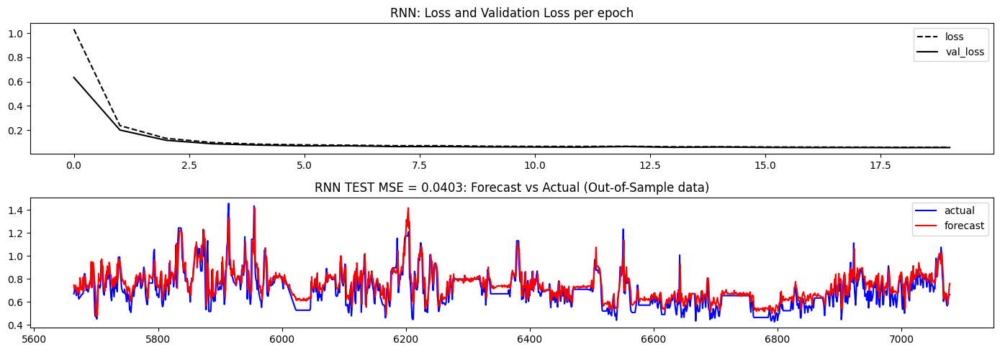

In [96]:

si_normal_rnn, history_normal_rnn = train_model_pt('RNN', **params_si)



## Inference simple RNN



## Inference sanity check first


In [97]:

model = si_normal_rnn


In [98]:


l_real, l_pred = inference_model_pt_2(model, model_type='RNN', **params_si)


0


In [99]:

l_real[:20]


[0.6701333516575041,
 0.6945333514481496,
 0.7340000189779606,
 0.7052000114135476,
 0.6553333238432836,
 0.6790666413499427,
 0.6959999718339985,
 0.6699666490142091,
 0.6255113279102797,
 0.6321122467587986,
 0.6404795978381159,
 0.6488469489174333,
 0.6572142999967507,
 0.6647356021726963,
 0.6660000204627368,
 0.6741000168630318,
 0.7731333545292922,
 0.8446000019552969,
 0.842999997462379,
 0.7542000138473319]

In [100]:

l_pred[:20]


[array([0.7462971], dtype=float32),
 array([0.7086069], dtype=float32),
 array([0.7266404], dtype=float32),
 array([0.7443787], dtype=float32),
 array([0.7127433], dtype=float32),
 array([0.6746452], dtype=float32),
 array([0.7245972], dtype=float32),
 array([0.72415817], dtype=float32),
 array([0.68463856], dtype=float32),
 array([0.66551477], dtype=float32),
 array([0.8100724], dtype=float32),
 array([0.78265995], dtype=float32),
 array([0.7085095], dtype=float32),
 array([0.70288455], dtype=float32),
 array([0.7130262], dtype=float32),
 array([0.81372243], dtype=float32),
 array([0.69040775], dtype=float32),
 array([0.7983259], dtype=float32),
 array([0.82878494], dtype=float32),
 array([0.7932376], dtype=float32)]

In [101]:

## plt.rcParams["figure.figsize"] = [14, 5] 


1415


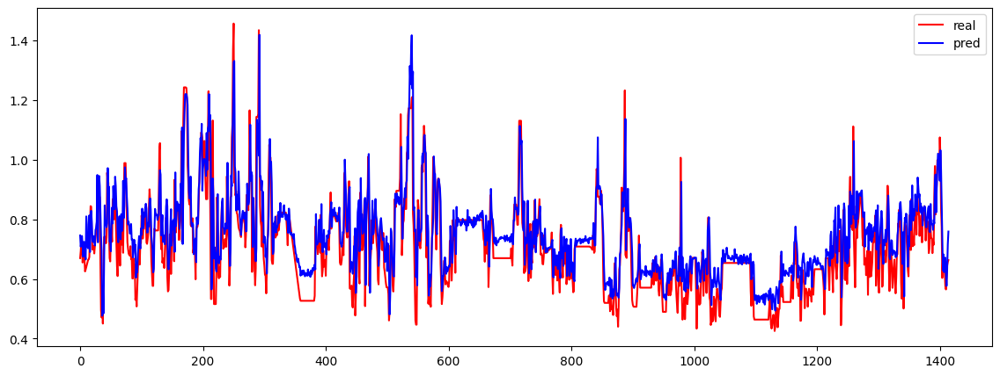

In [102]:


  
# create data 
x = [ i for i in range(len(l_real)) ] 
print(len(x))
  
# plot lines 

plt.plot(x, l_real, label = "real", color='red') 
plt.plot(x, l_pred, label = "pred", color='blue') 
plt.legend() 
plt.show()



## Now run actual INFERENCE to predict x vector and silicon together


In [103]:

model = si_normal_rnn


In [104]:

l_real, l_pred = inference_model_pt(model, model_type='RNN', **params_si)


0


In [105]:

l_real[:20]


[0.6701333516575041,
 0.6945333514481496,
 0.7340000189779606,
 0.7052000114135476,
 0.6553333238432836,
 0.6790666413499427,
 0.6959999718339985,
 0.6699666490142091,
 0.6255113279102797,
 0.6321122467587986,
 0.6404795978381159,
 0.6488469489174333,
 0.6572142999967507,
 0.6647356021726963,
 0.6660000204627368,
 0.6741000168630318,
 0.7731333545292922,
 0.8446000019552969,
 0.842999997462379,
 0.7542000138473319]

In [106]:

l_pred[:20]


[array([0.7462971], dtype=float32),
 array([0.7735764], dtype=float32),
 array([0.7920007], dtype=float32),
 array([0.8107389], dtype=float32),
 array([0.8281396], dtype=float32),
 array([0.8476802], dtype=float32),
 array([0.86580175], dtype=float32),
 array([0.88006246], dtype=float32),
 array([0.89087194], dtype=float32),
 array([0.8993053], dtype=float32),
 array([0.9063085], dtype=float32),
 array([0.9121273], dtype=float32),
 array([0.9158238], dtype=float32),
 array([0.91613734], dtype=float32),
 array([0.91553164], dtype=float32),
 array([0.91193676], dtype=float32),
 array([0.92253584], dtype=float32),
 array([0.9383309], dtype=float32),
 array([0.95951045], dtype=float32),
 array([0.98086655], dtype=float32)]

1415


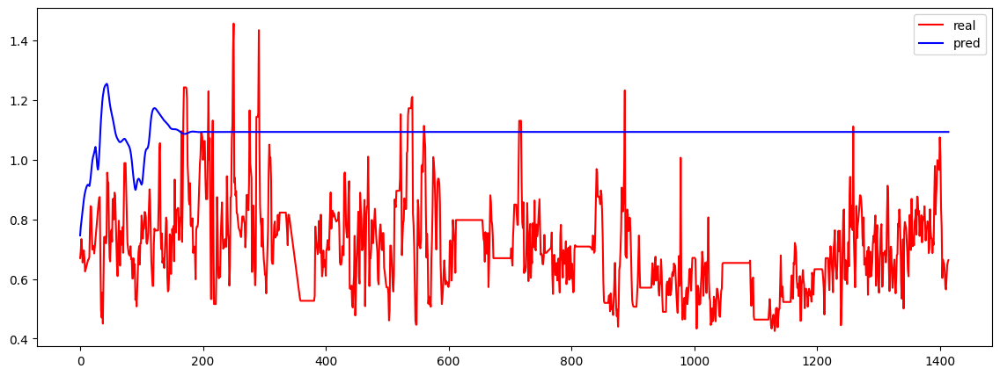

In [107]:

# create data 
x = [ i for i in range(len(l_real)) ] 
print(len(x))
  
# plot lines 

plt.plot(x, l_real, label = "real", color='red') 
plt.plot(x, l_pred, label = "pred", color='blue') 
plt.legend() 
plt.show()



## Break up test set into test bins 

* example
* input is 30 (about 7.5 hours)
* predicts rest of week


In [108]:

model = si_normal_rnn


In [109]:

x_test, y_test   = params_si['test_data']

## l_real, l_pred = bins_inference_model_pt(model, x_test, y_test)




In [110]:

x_test.shape


torch.Size([1415, 57])

In [111]:

bin_size = int( x_test.shape[0] / window )
bin_size 


471

In [114]:

1415 / 30


47.166666666666664

In [115]:

bin_size = 30


torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


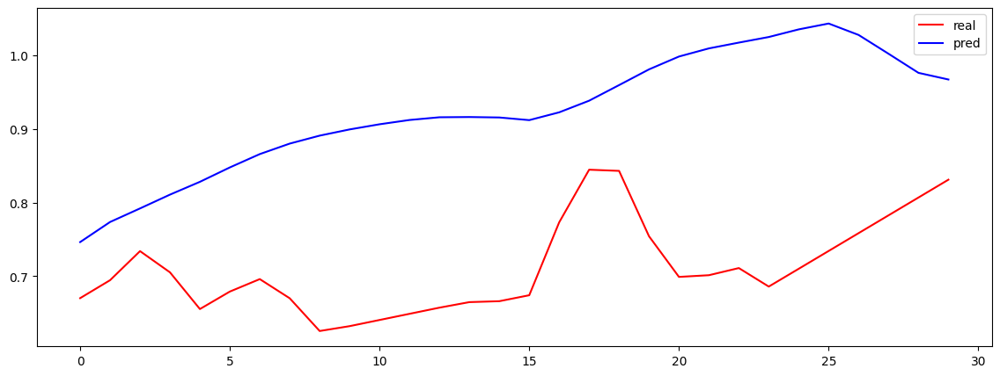

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


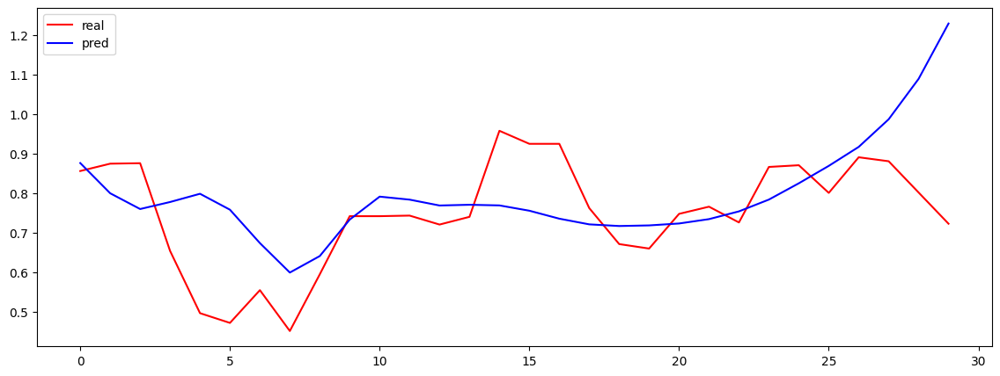

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


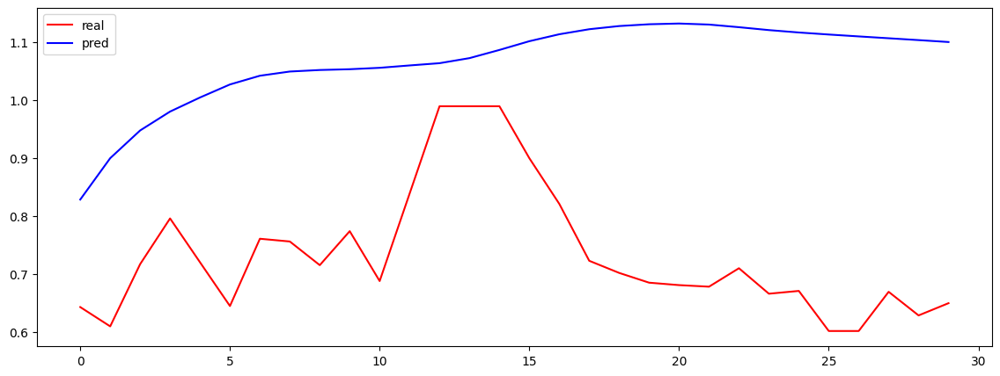

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


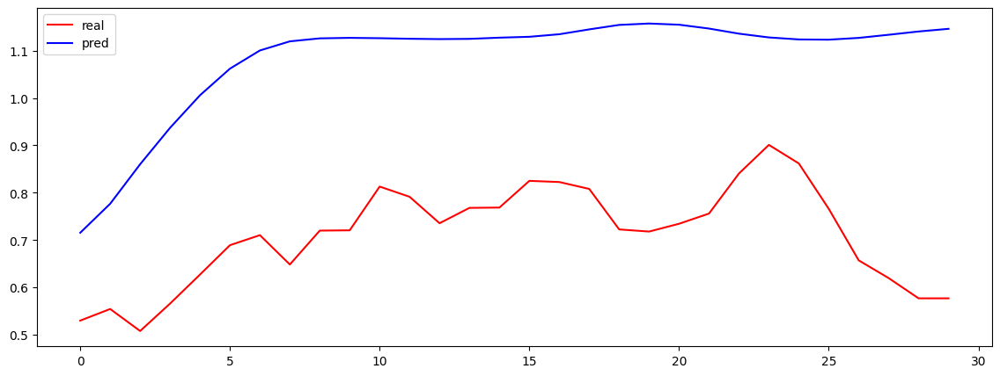

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


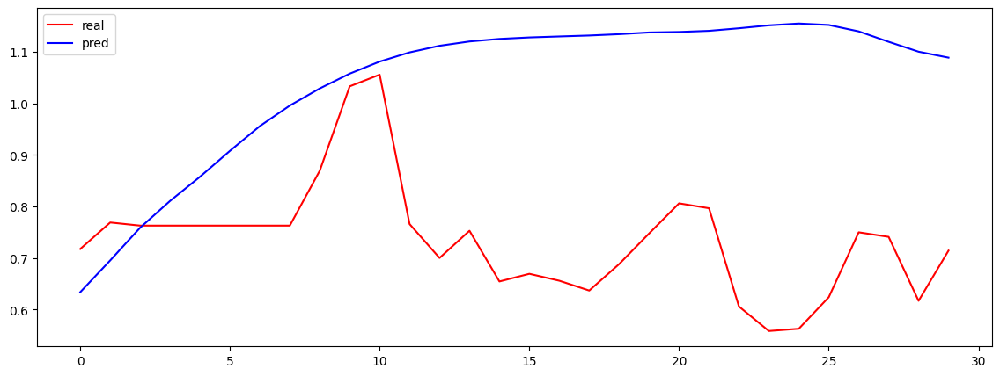

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


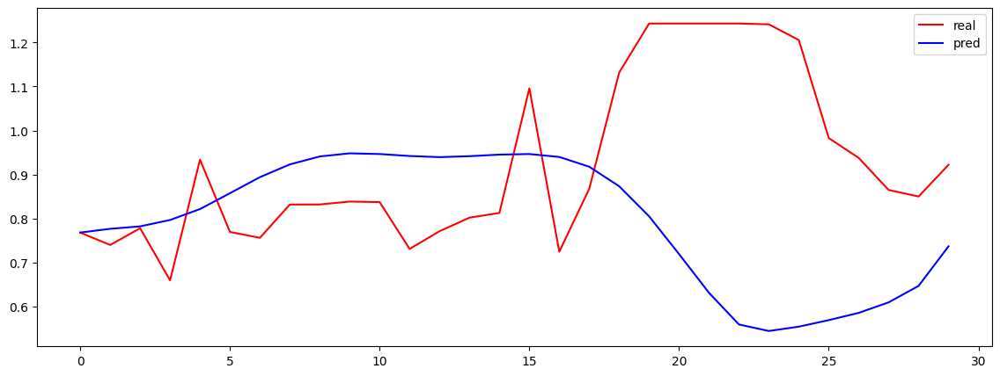

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


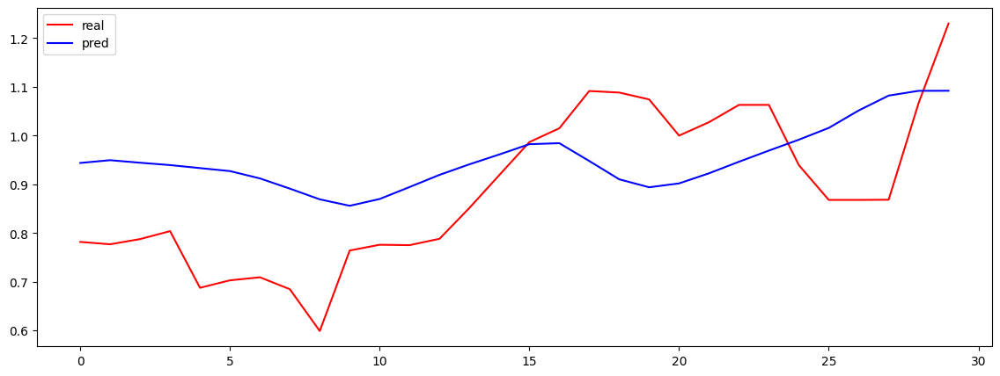

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


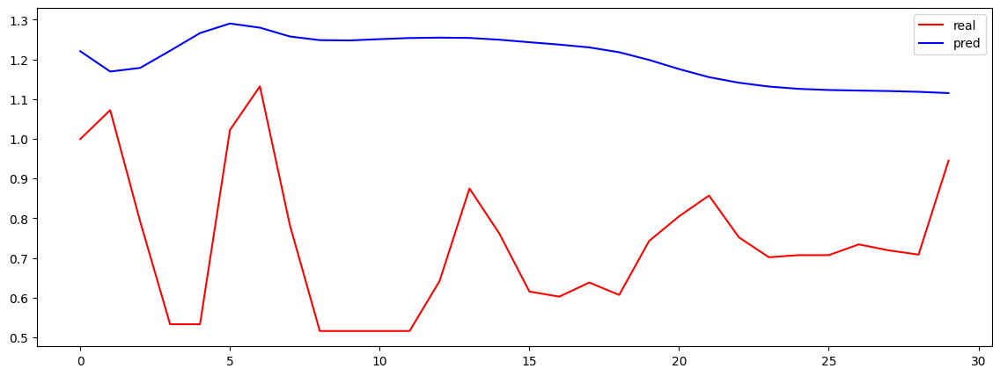

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


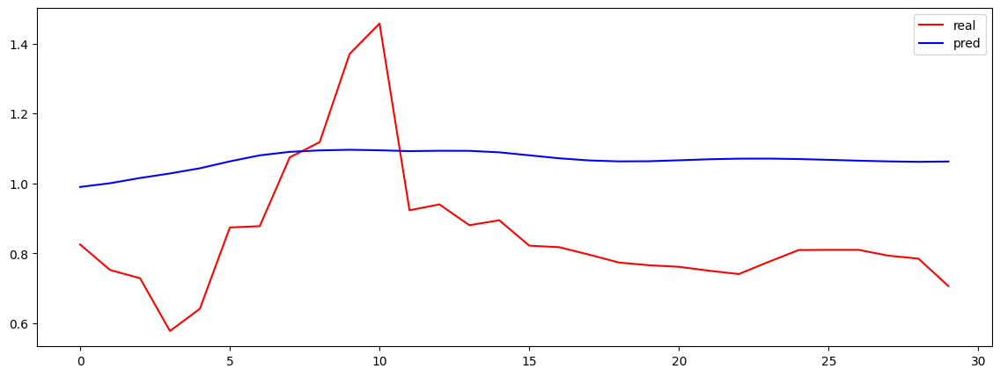

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


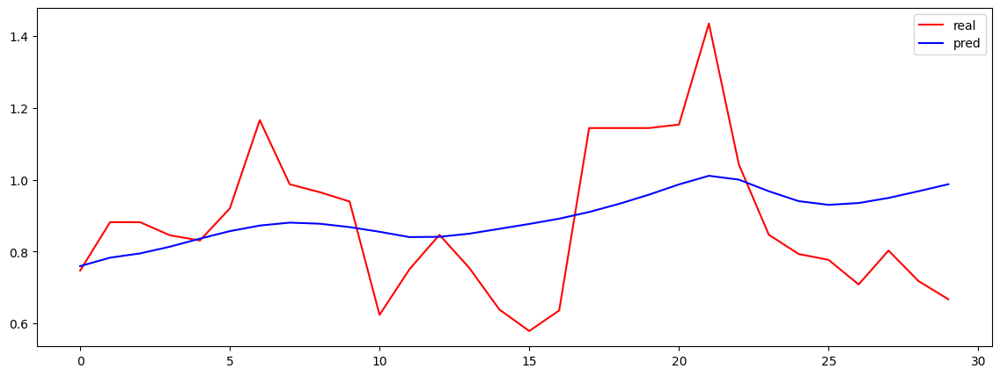

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


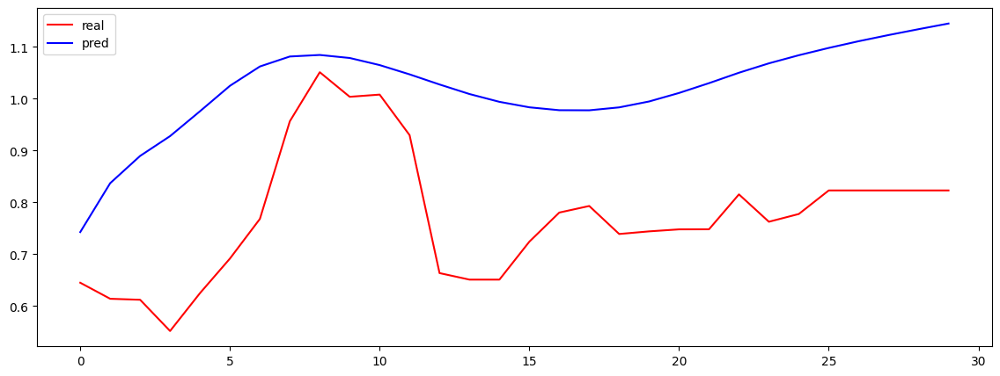

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


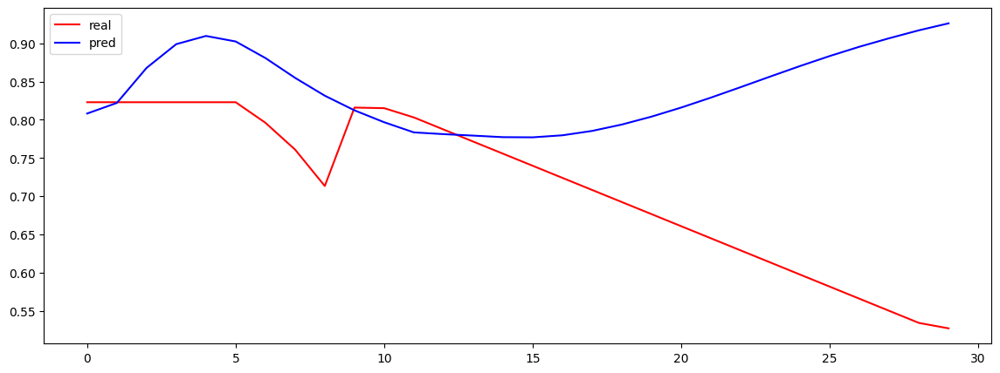

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


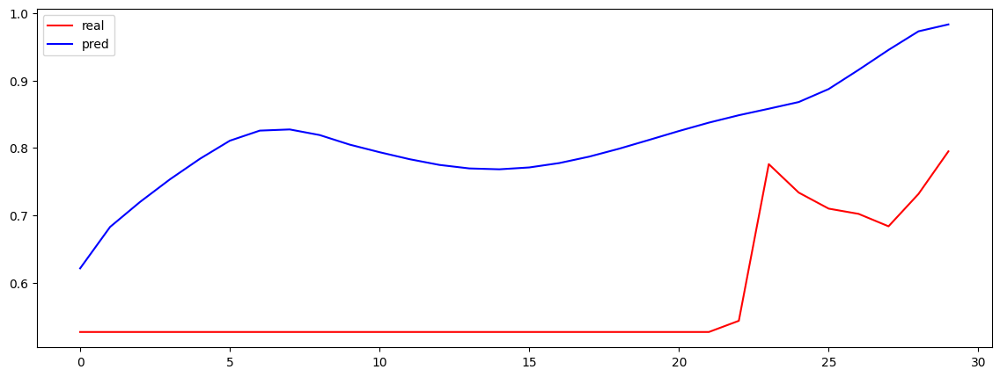

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


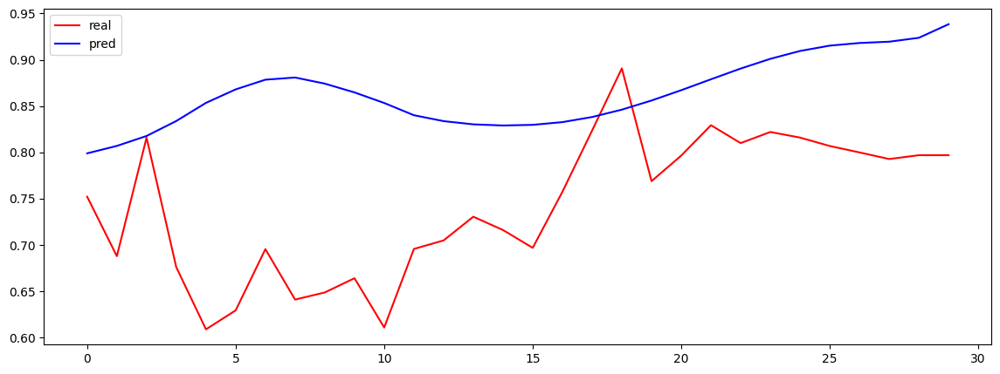

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


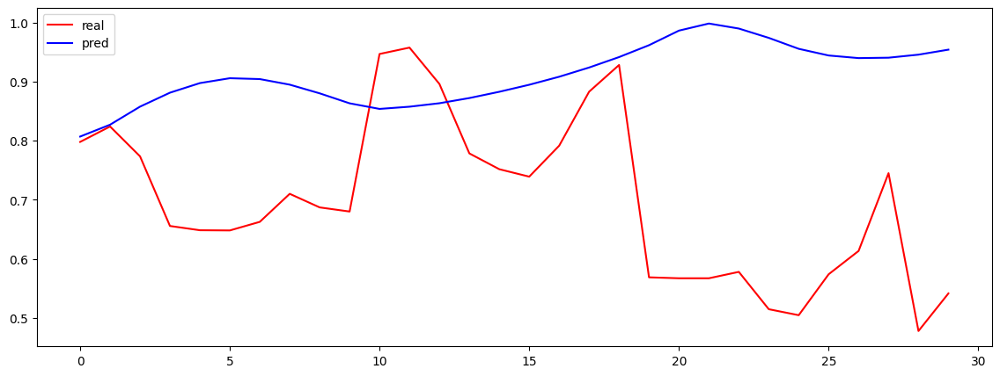

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


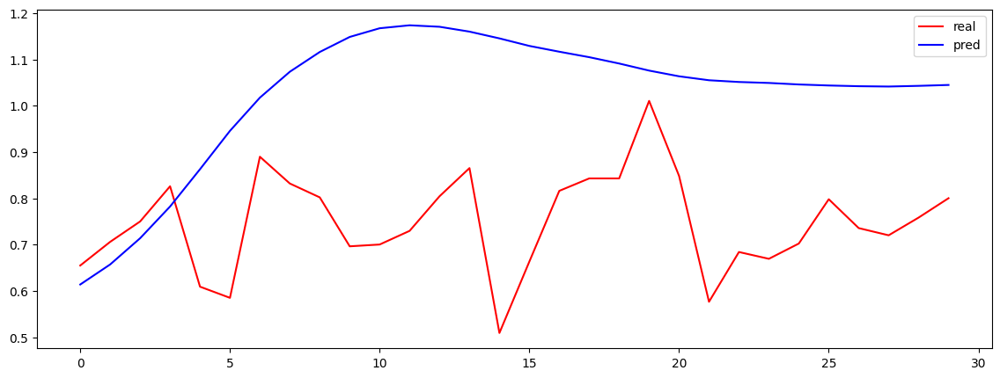

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


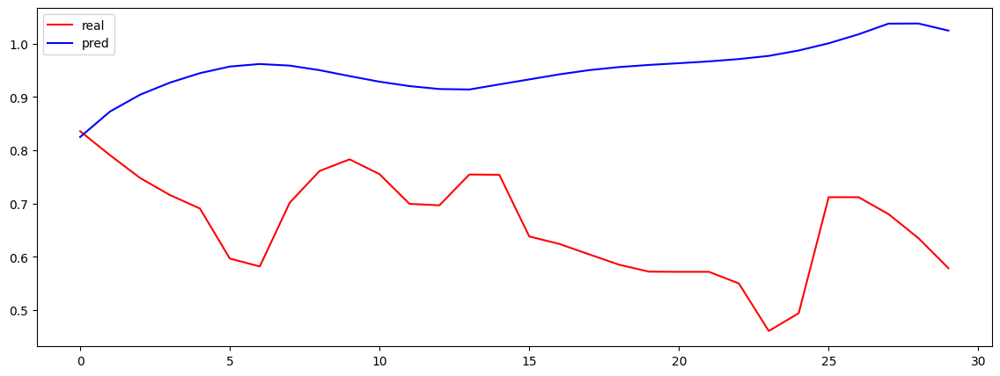

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


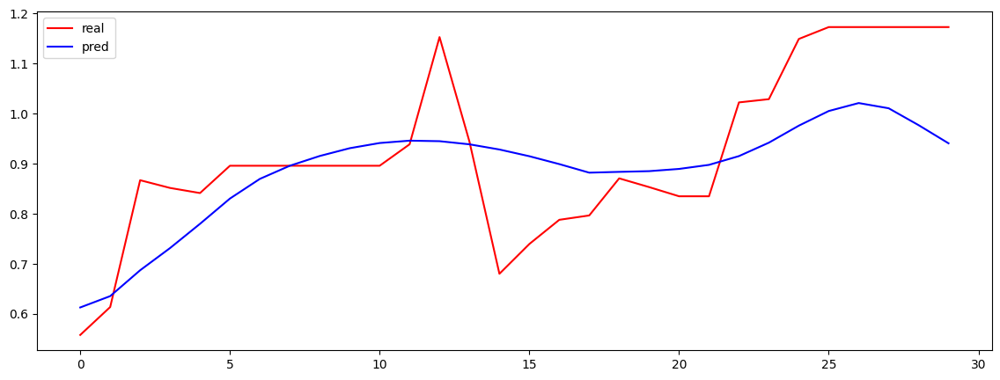

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


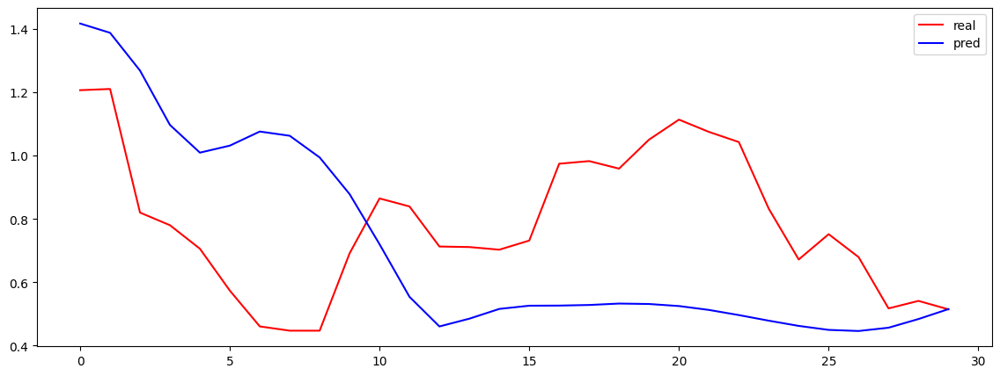

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


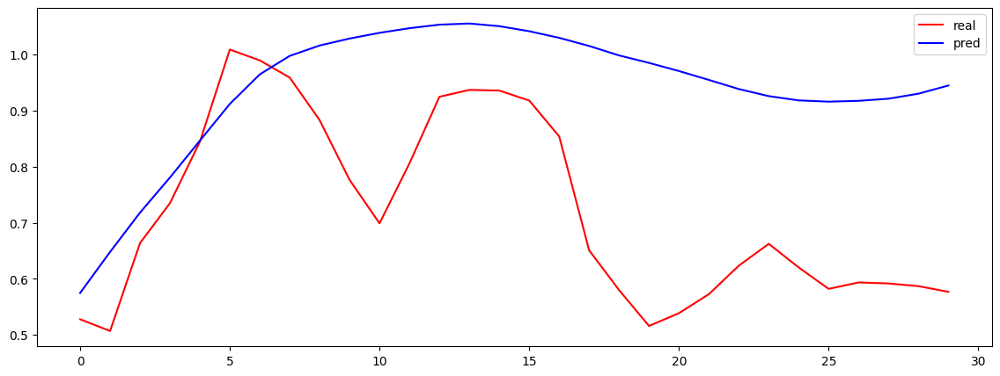

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


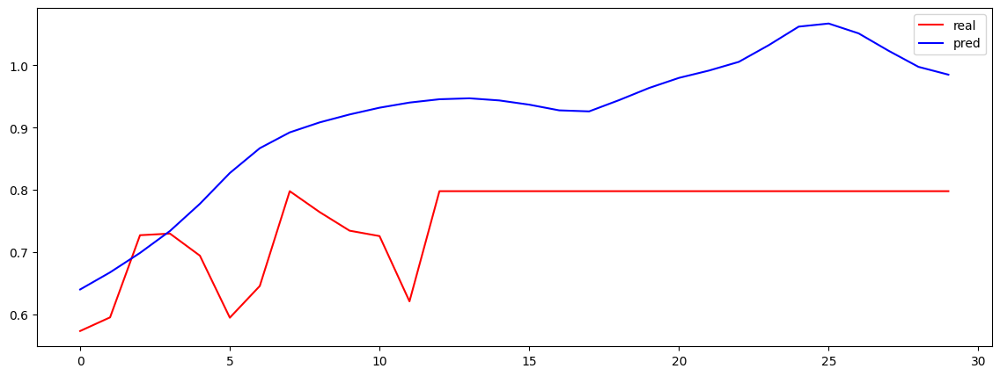

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


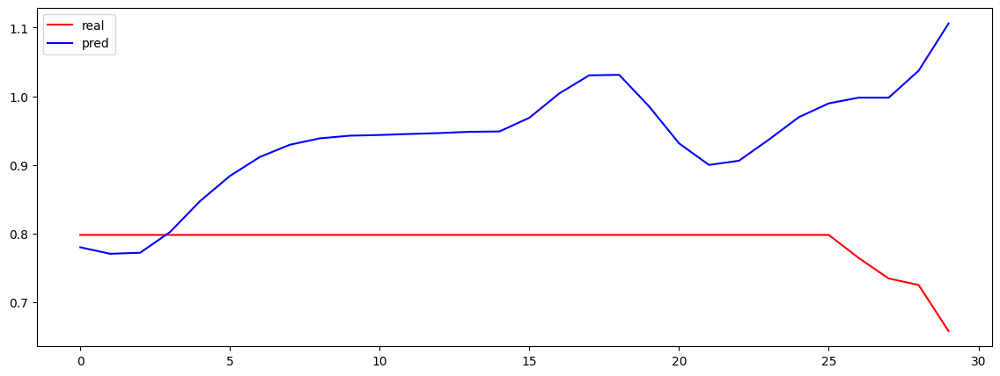

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


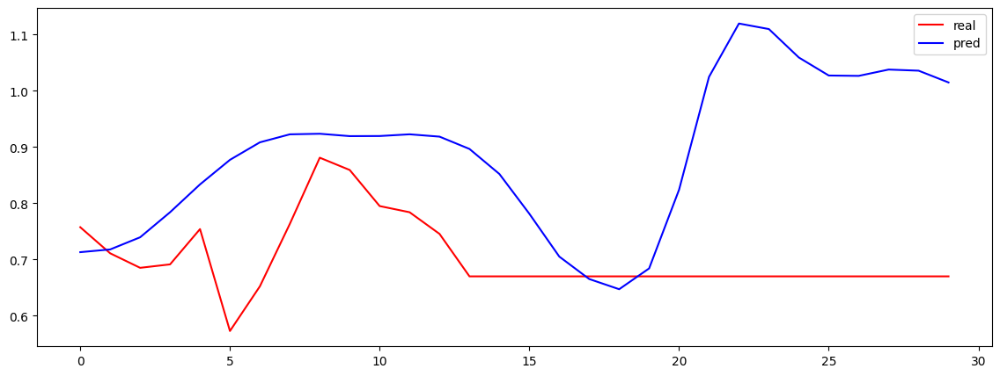

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


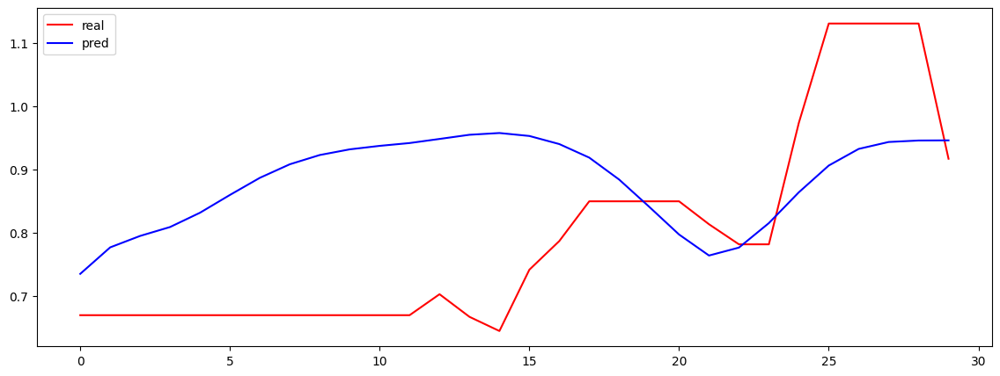

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


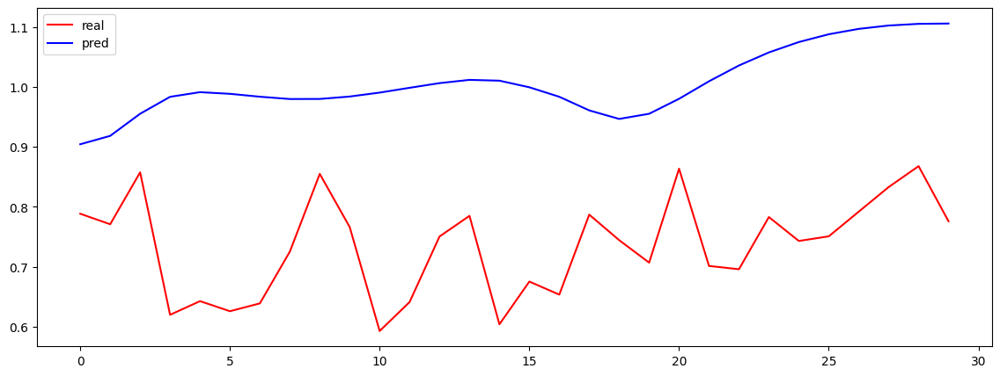

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


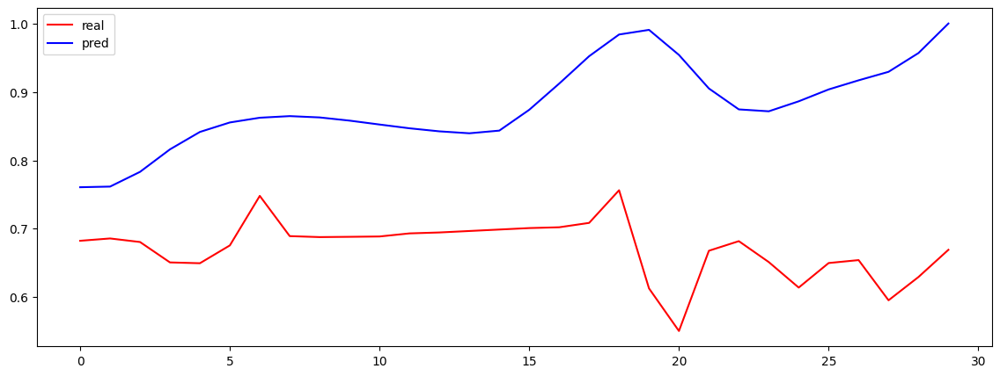

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


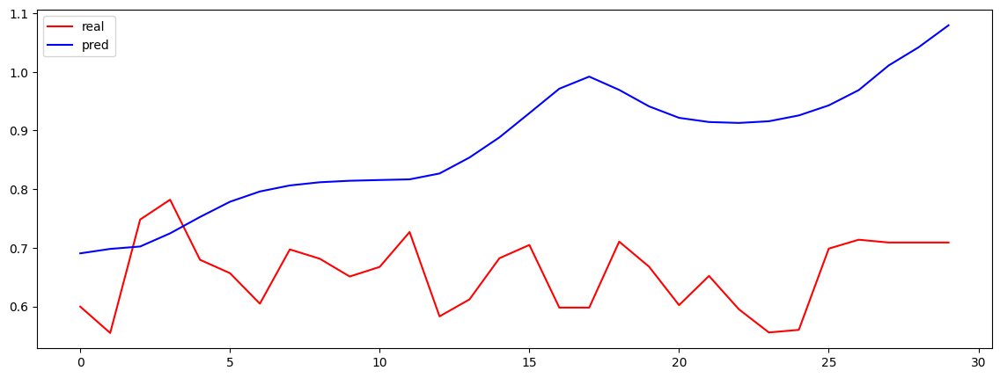

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


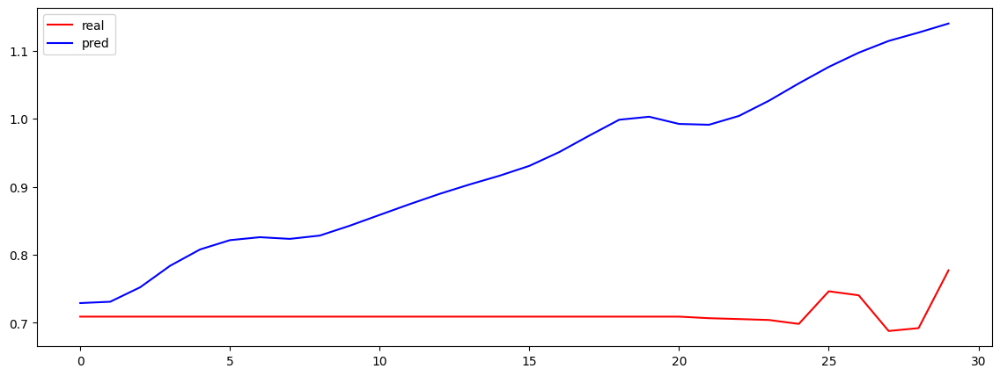

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


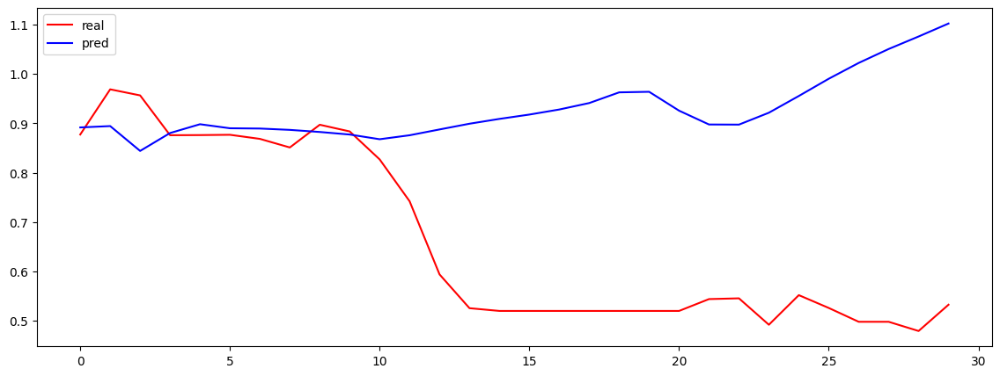

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


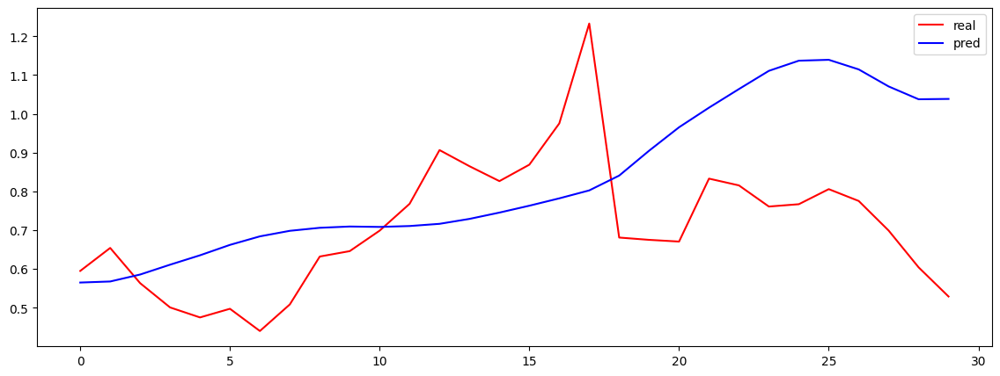

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


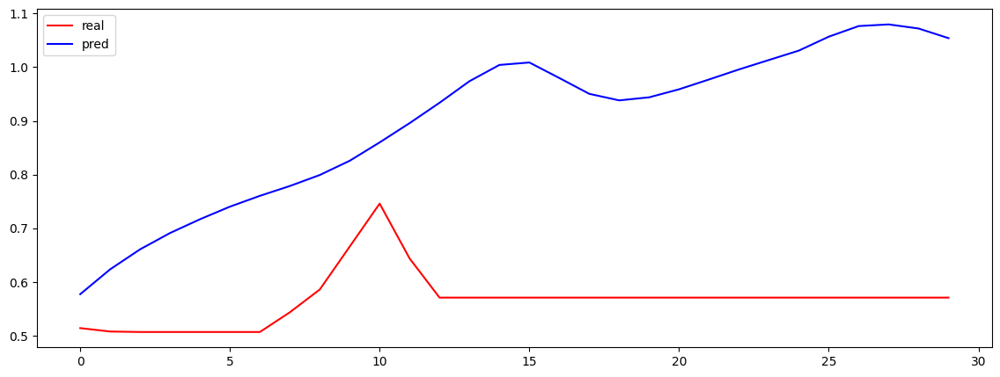

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


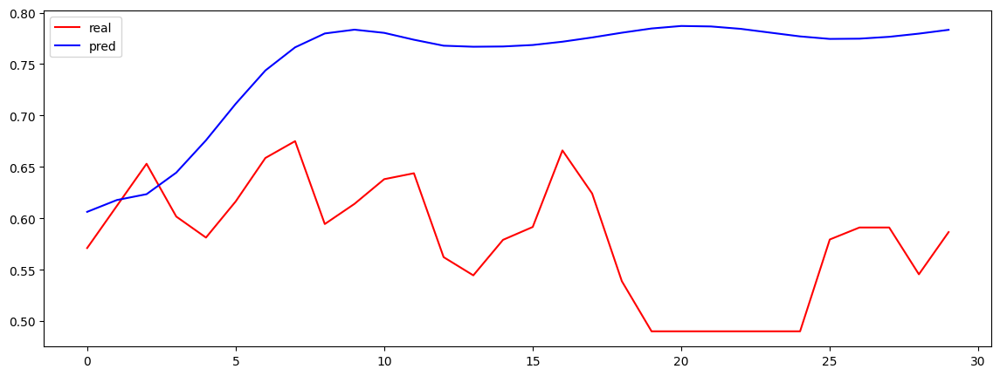

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


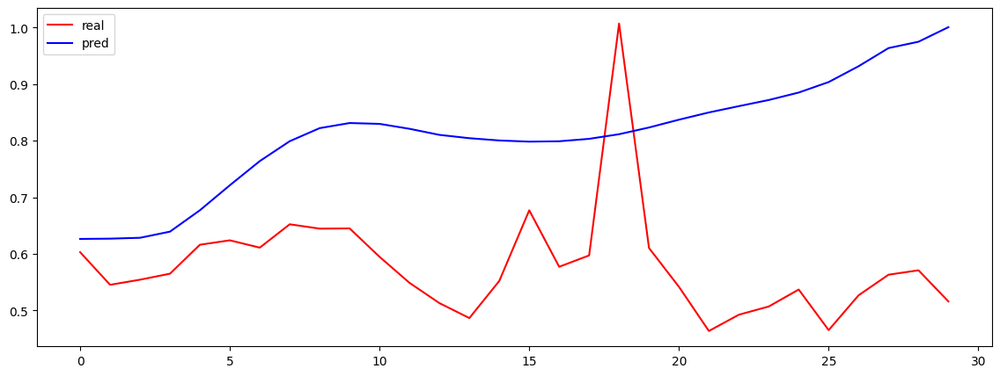

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


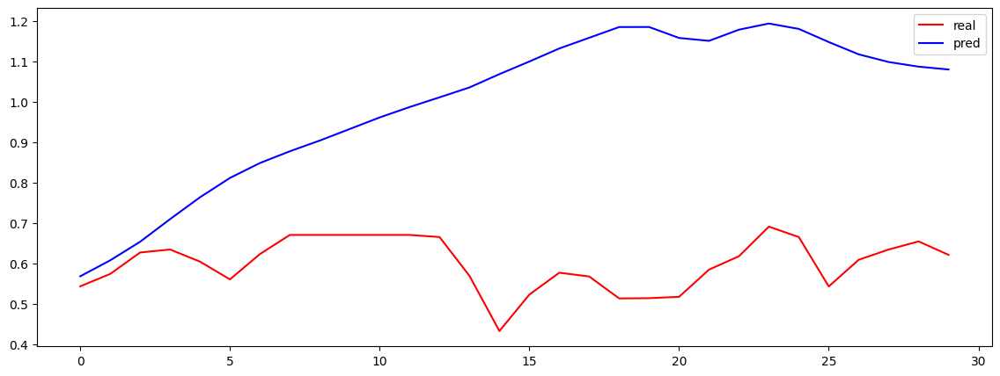

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


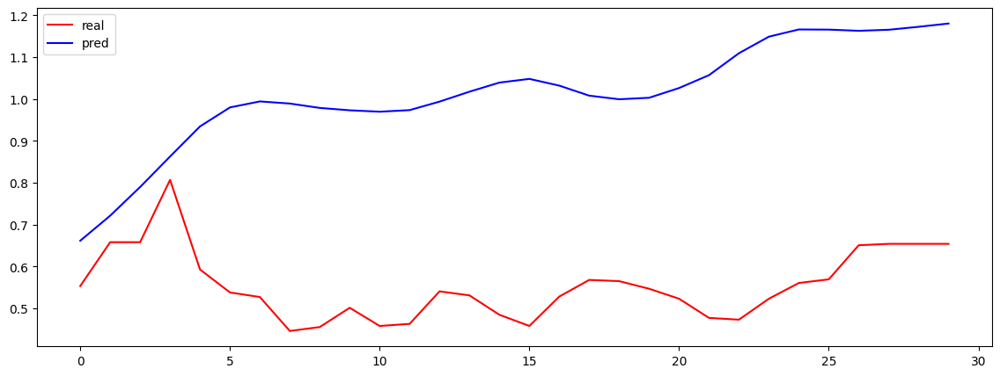

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


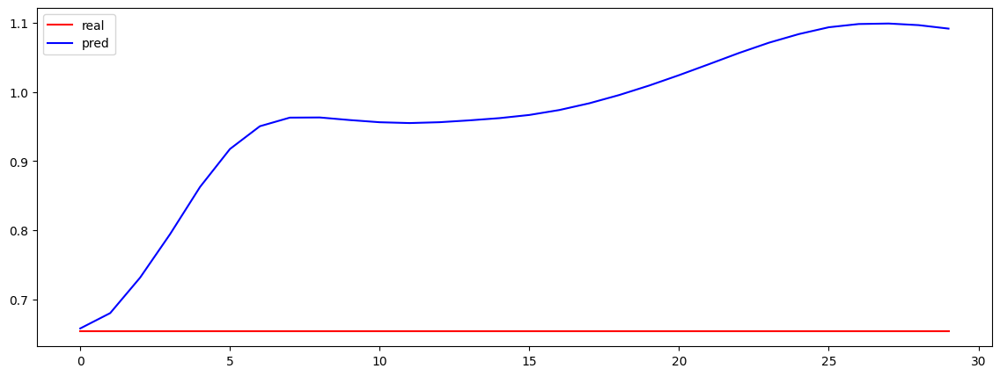

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


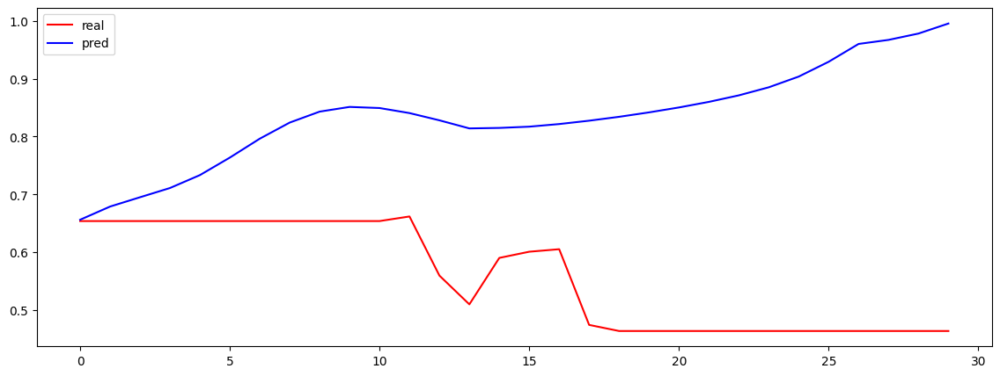

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


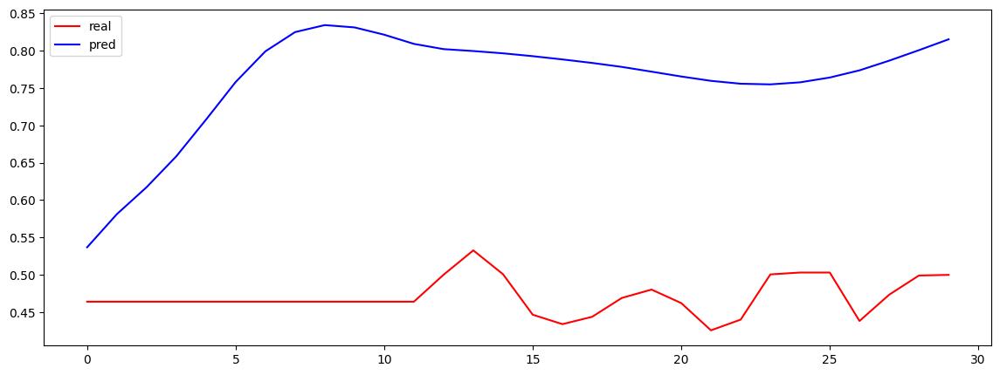

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


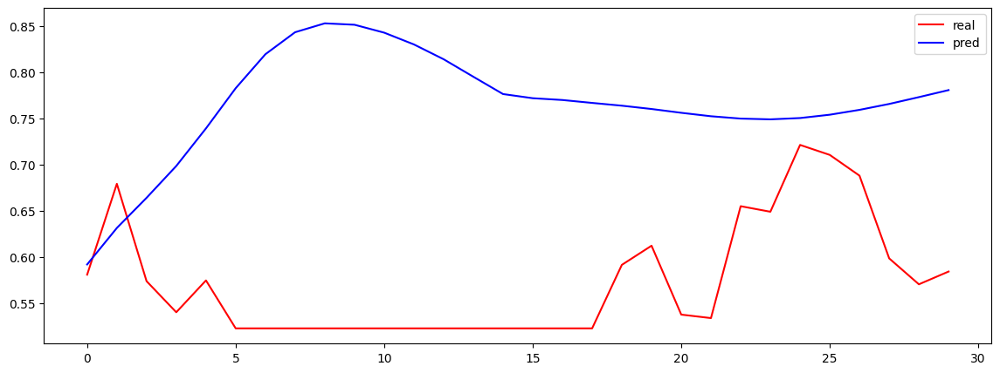

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


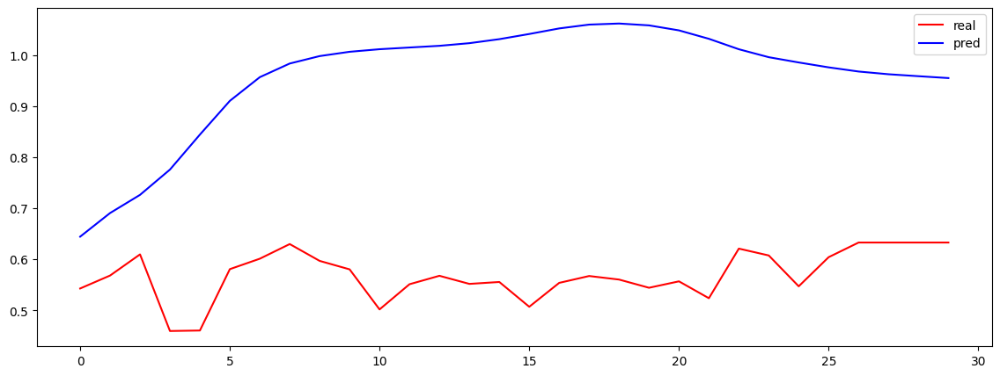

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


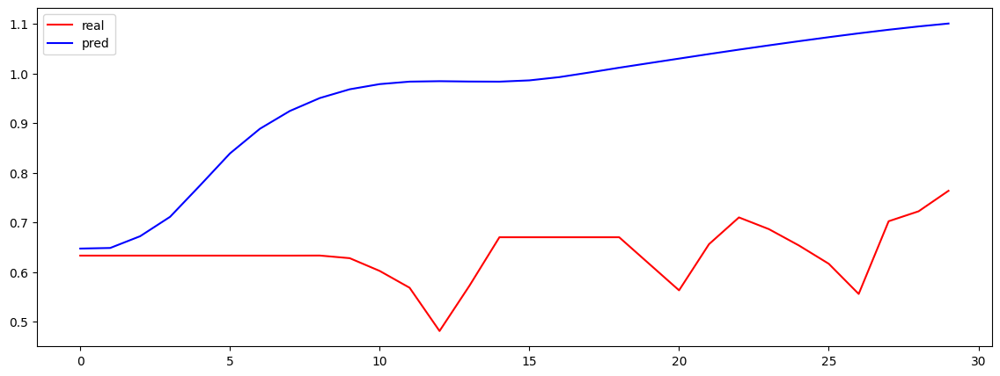

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


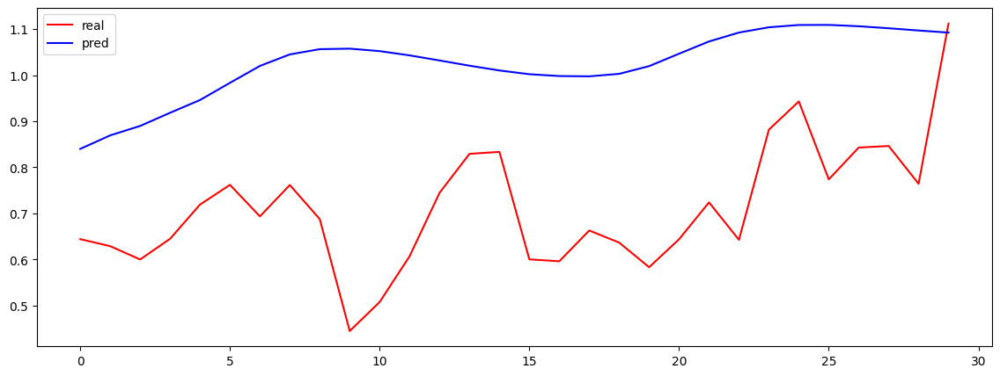

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


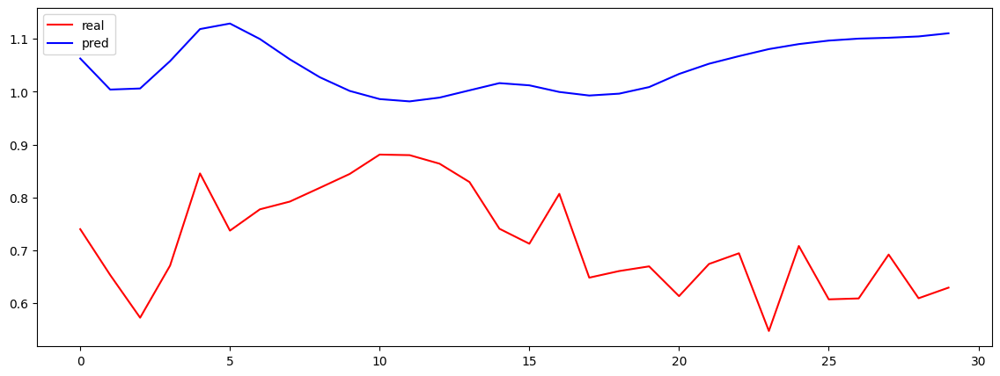

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


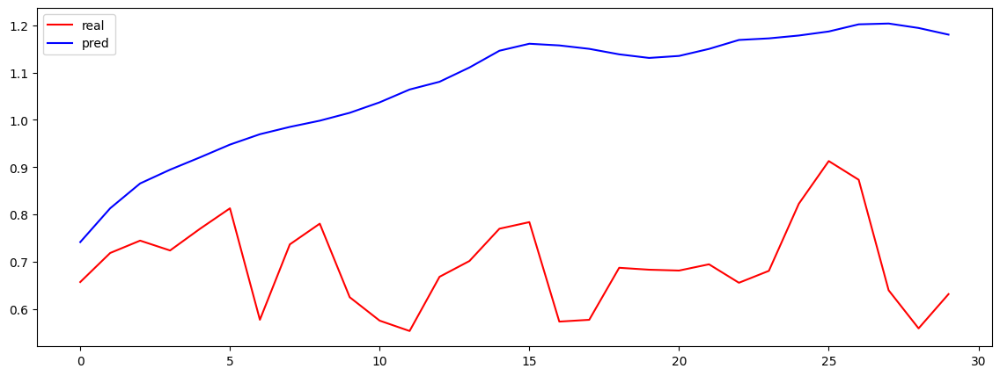

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


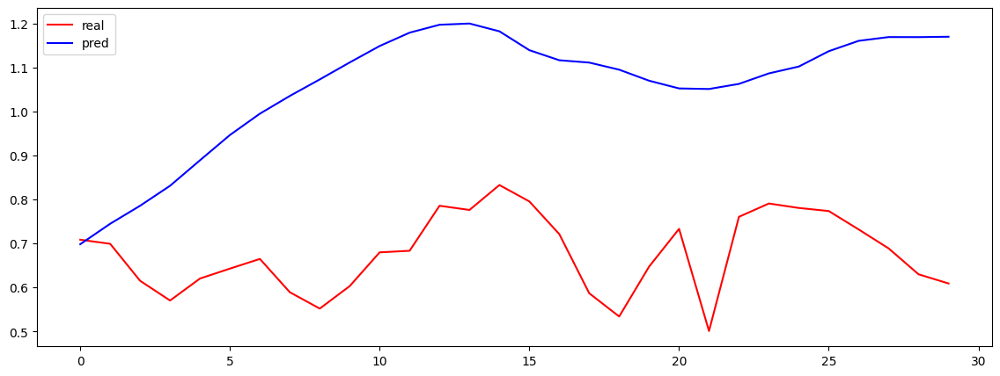

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


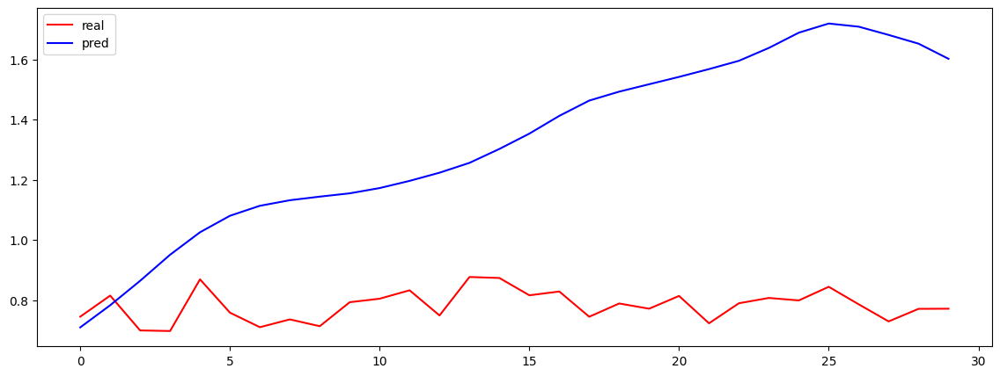

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


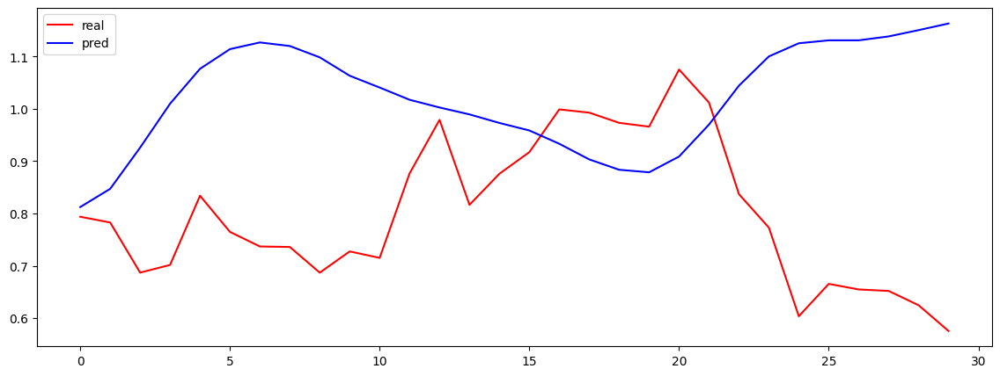

In [116]:

for i in range(0, y_test.shape[0]- bin_size, bin_size):
    batch_x_test = x_test[i:i+bin_size, :]
    print( batch_x_test.shape )

    batch_y_test = y_test[i:i+bin_size, :]
    print( batch_y_test.shape )
    print("---------------")
    bins_inference_model_pt(model, batch_x_test, batch_y_test)




## LSTM


In [117]:

class LSTM(nn.Module):
    def __init__(self, seq_length, input_size, output_size, n_features, n_layers):
        super(LSTM, self).__init__()
        self.n_layers   = n_layers
        self.hidden_dim = n_features
        self.output_size= output_size
        self.seq_length = seq_length
        self.input_size = input_size

        self.lstm    = nn.LSTM(input_size, n_features, n_layers, batch_first=False)
        self.dropout = nn.Dropout(0.2)
        self.fc      = nn.Linear(n_features, output_size)

        self.fc1     = nn.Linear(n_features, 30)
        self.relu    = nn.ReLU()
        self.fc2     = nn.Linear(30, output_size)
        
    def forward(self, x, hn):
        x = x.view(-1, self.seq_length, self.input_size)
        x = x.permute(1, 0, 2)

        ## hn is a tuple here of (h0, c0)
        lstm_o, (hn, cn) = self.lstm(x, hn)
    
        lstm_o = self.dropout(lstm_o)

        
        output = self.fc( hn )
        ## output    = self.fc1( hn )
        ## output    = self.relu( output )
        ## output    = self.dropout(  output  )
        ## output    = self.fc2( output )
    
        ##                     batch_size, n_classes) 
        output  = output.view( -1,  self.output_size ) 
        
        return output, hn


    def init_hidden(self, batch_size_x_data):
        weight = next(self.parameters()).data
        hidden = ( weight.new(self.n_layers, 1, self.hidden_dim).zero_(),
                   weight.new(self.n_layers, 1, self.hidden_dim).zero_()   )
        N_batches_rc = batch_size_x_data    ## or is this the size of the x set ??
        hidden2 = ( torch.zeros( self.n_layers,   N_batches_rc,    self.hidden_dim ),
                    torch.zeros( self.n_layers,   N_batches_rc,    self.hidden_dim )    )
        return hidden2


0/500 - Loss:  1.0077348947525024, val_loss: 0.605944812297821
25/500 - Loss:  0.22285614907741547, val_loss: 0.1879139393568039
50/500 - Loss:  0.12208829820156097, val_loss: 0.10672084987163544
75/500 - Loss:  0.09000164270401001, val_loss: 0.0797066017985344
100/500 - Loss:  0.07646521925926208, val_loss: 0.06888146698474884
125/500 - Loss:  0.06919872760772705, val_loss: 0.06324239820241928
150/500 - Loss:  0.06447016447782516, val_loss: 0.05995502695441246
175/500 - Loss:  0.061008550226688385, val_loss: 0.057581350207328796
200/500 - Loss:  0.058234866708517075, val_loss: 0.05559202656149864
225/500 - Loss:  0.05826973915100098, val_loss: 0.05402027443051338
250/500 - Loss:  0.05406307429075241, val_loss: 0.05225187540054321
275/500 - Loss:  0.05238327756524086, val_loss: 0.05096190422773361
300/500 - Loss:  0.05078974366188049, val_loss: 0.0494818277657032
325/500 - Loss:  0.04946427047252655, val_loss: 0.04811166971921921
350/500 - Loss:  0.048352357000112534, val_loss: 0.04689

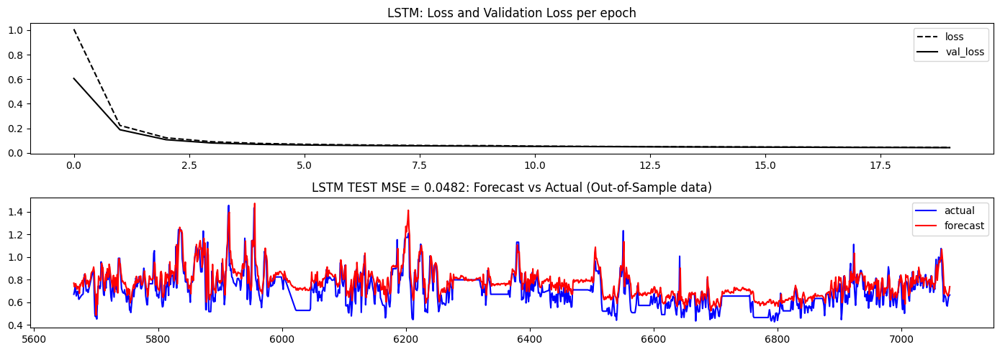

In [118]:

si_lstm, history_a_lstm = train_model_pt('LSTM', **params_si)



## LSTM Inference



## Inference sanity check first


In [119]:

model = si_lstm


In [120]:

l_real, l_pred = inference_model_pt_2(model, model_type='LSTM', **params_si)


0


In [121]:

l_real[:20]


[0.6701333516575041,
 0.6945333514481496,
 0.7340000189779606,
 0.7052000114135476,
 0.6553333238432836,
 0.6790666413499427,
 0.6959999718339985,
 0.6699666490142091,
 0.6255113279102797,
 0.6321122467587986,
 0.6404795978381159,
 0.6488469489174333,
 0.6572142999967507,
 0.6647356021726963,
 0.6660000204627368,
 0.6741000168630318,
 0.7731333545292922,
 0.8446000019552969,
 0.842999997462379,
 0.7542000138473319]

In [122]:

l_pred[:20]


[array([0.768445], dtype=float32),
 array([0.7355511], dtype=float32),
 array([0.7587439], dtype=float32),
 array([0.76389015], dtype=float32),
 array([0.74449956], dtype=float32),
 array([0.71602285], dtype=float32),
 array([0.7369725], dtype=float32),
 array([0.740441], dtype=float32),
 array([0.7217035], dtype=float32),
 array([0.6779296], dtype=float32),
 array([0.7580046], dtype=float32),
 array([0.7440938], dtype=float32),
 array([0.77196854], dtype=float32),
 array([0.7750563], dtype=float32),
 array([0.79344946], dtype=float32),
 array([0.7361754], dtype=float32),
 array([0.815081], dtype=float32),
 array([0.82046264], dtype=float32),
 array([0.851992], dtype=float32),
 array([0.82943046], dtype=float32)]

1415


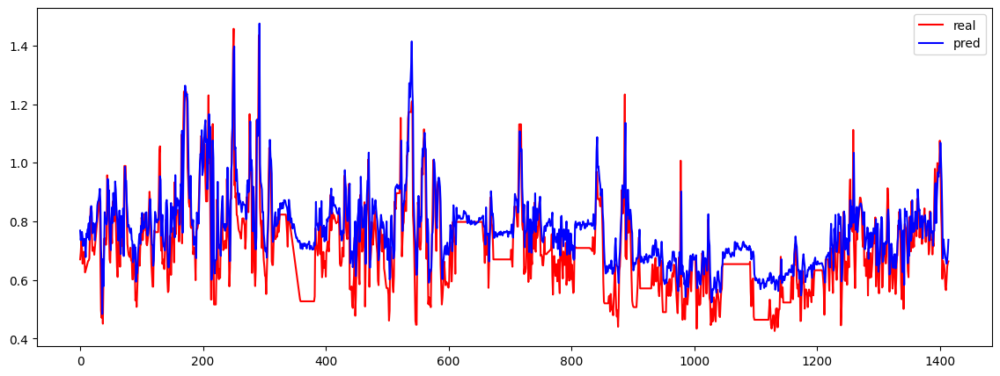

In [123]:

# create data 
x = [ i for i in range(len(l_real)) ] 
print(len(x))
  
# plot lines 

plt.plot(x, l_real, label = "real", color='red') 
plt.plot(x, l_pred, label = "pred", color='blue') 
plt.legend() 
plt.show()



## Now run actual INFERENCE to predict x vector and silicon together


In [124]:

model = si_lstm


In [125]:

l_real, l_pred = inference_model_pt(model, model_type='LSTM', **params_si)


0


In [126]:

l_real[:50]


[0.6701333516575041,
 0.6945333514481496,
 0.7340000189779606,
 0.7052000114135476,
 0.6553333238432836,
 0.6790666413499427,
 0.6959999718339985,
 0.6699666490142091,
 0.6255113279102797,
 0.6321122467587986,
 0.6404795978381159,
 0.6488469489174333,
 0.6572142999967507,
 0.6647356021726963,
 0.6660000204627368,
 0.6741000168630318,
 0.7731333545292922,
 0.8446000019552969,
 0.842999997462379,
 0.7542000138473319,
 0.6989999962943689,
 0.701300019934527,
 0.7110000208277398,
 0.6858650155941144,
 0.7100252428823162,
 0.7342269075799827,
 0.7584285906046766,
 0.7826302736293707,
 0.806831938327037,
 0.8310336213517311,
 0.8552352952129113,
 0.8737899170324739,
 0.8749999956856003,
 0.6531431707337494,
 0.49562350455559456,
 0.47099997000898286,
 0.5538666517379065,
 0.45053333521466676,
 0.5938999909619437,
 0.7409999905260293,
 0.7409999905260293,
 0.7424666475659334,
 0.719799981394192,
 0.7392999937703786,
 0.9569666783235754,
 0.924000025609926,
 0.924000025609926,
 0.7614666803014

In [127]:

l_pred[:500]


[array([0.768445], dtype=float32),
 array([0.8091242], dtype=float32),
 array([0.83455396], dtype=float32),
 array([0.8483938], dtype=float32),
 array([0.85546094], dtype=float32),
 array([0.8577173], dtype=float32),
 array([0.8554317], dtype=float32),
 array([0.8493205], dtype=float32),
 array([0.8403], dtype=float32),
 array([0.82919765], dtype=float32),
 array([0.81683916], dtype=float32),
 array([0.80420226], dtype=float32),
 array([0.79250395], dtype=float32),
 array([0.7832003], dtype=float32),
 array([0.77781045], dtype=float32),
 array([0.7775163], dtype=float32),
 array([0.7826718], dtype=float32),
 array([0.792596], dtype=float32),
 array([0.8059412], dtype=float32),
 array([0.82133585], dtype=float32),
 array([0.83762527], dtype=float32),
 array([0.8536334], dtype=float32),
 array([0.8681367], dtype=float32),
 array([0.88026184], dtype=float32),
 array([0.8897602], dtype=float32),
 array([0.8969503], dtype=float32),
 array([0.9024809], dtype=float32),
 array([0.9070578], dty

1415


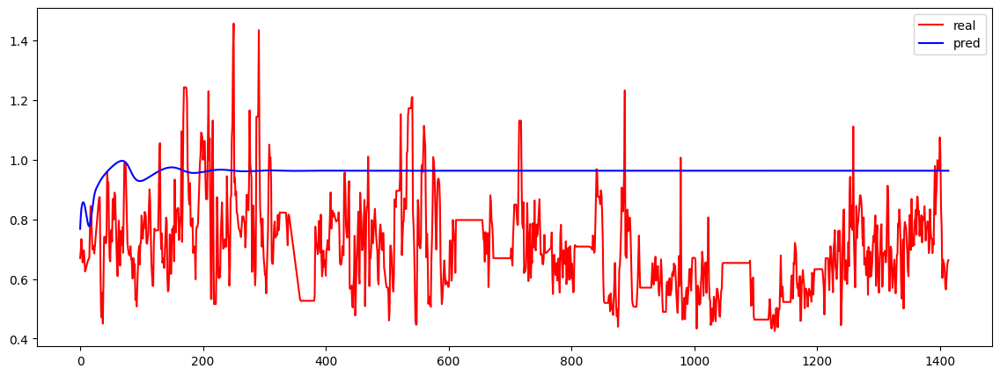

In [128]:

# create data 
x = [ i for i in range(len(l_real)) ] 
print(len(x))
  
# plot lines 

plt.plot(x, l_real, label = "real", color='red') 
plt.plot(x, l_pred, label = "pred", color='blue') 
plt.legend() 
plt.show()



## Break up test set into test bins 

* example
* input is 30 (about 7.5 hours)
* predicts rest of week


In [129]:

model = si_lstm


In [130]:


x_test, y_test   = params_si['test_data']

## l_real, l_pred = bins_inference_model_pt(model, x_test, y_test)



In [131]:

x_test.shape


torch.Size([1415, 57])

In [132]:

bin_size = int( x_test.shape[0] / window )
bin_size 


471

In [133]:

bin_size = 30


torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


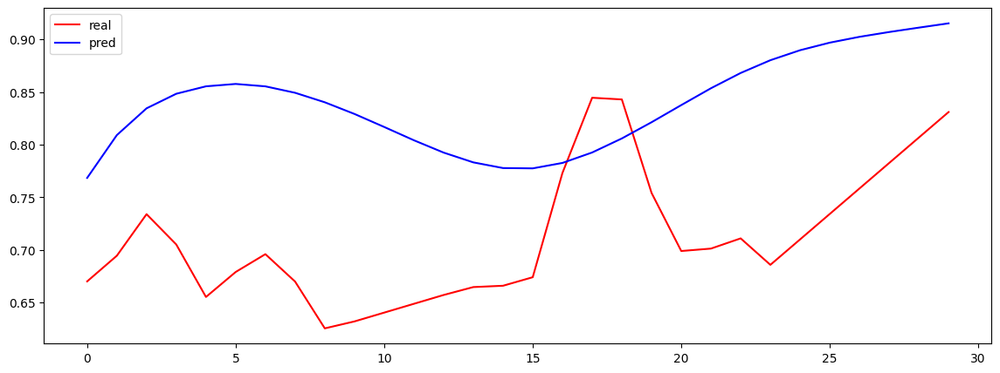

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


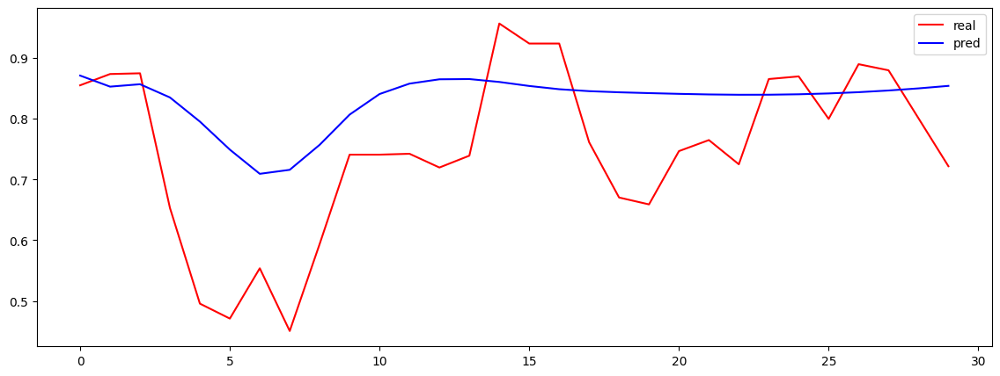

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


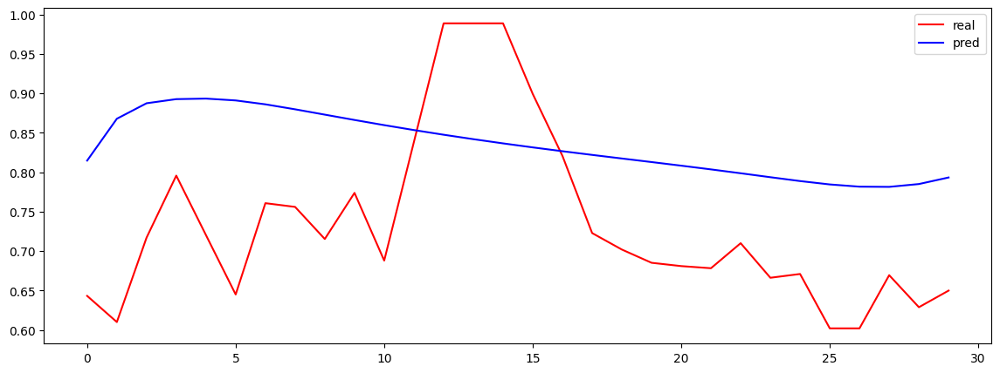

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


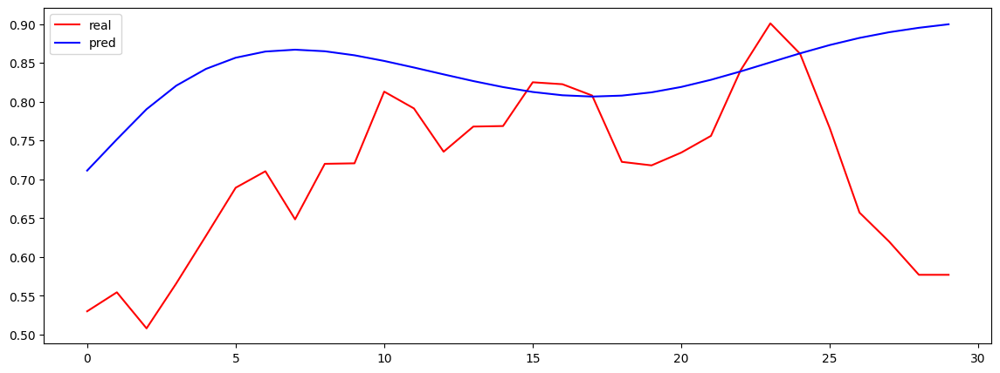

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


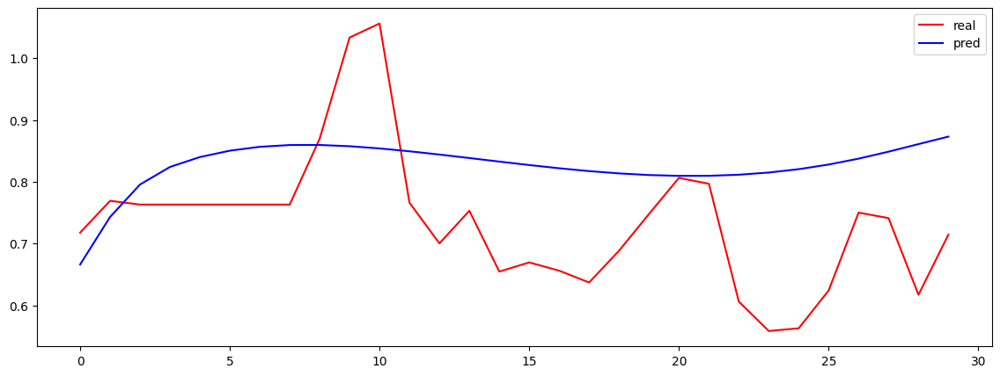

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


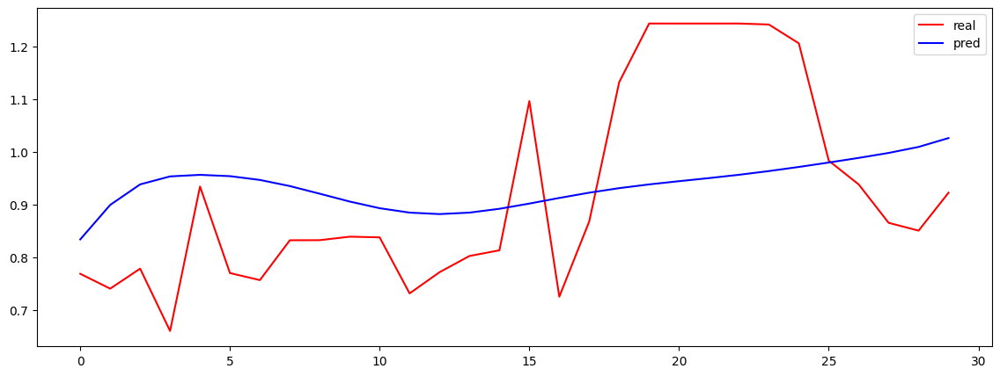

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


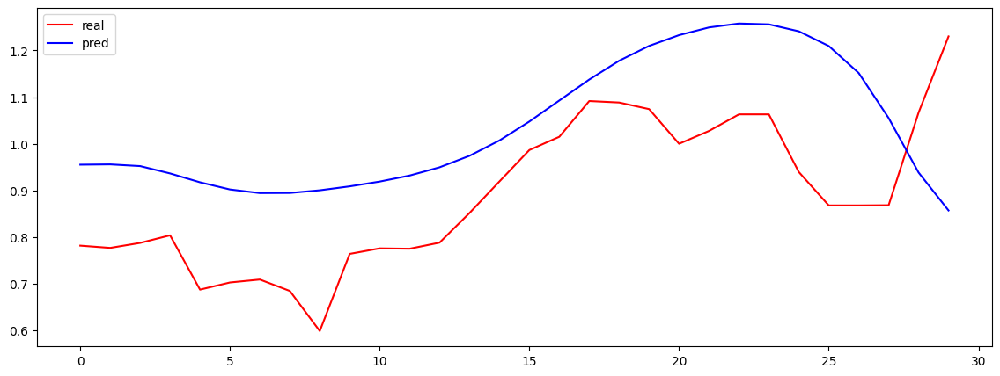

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


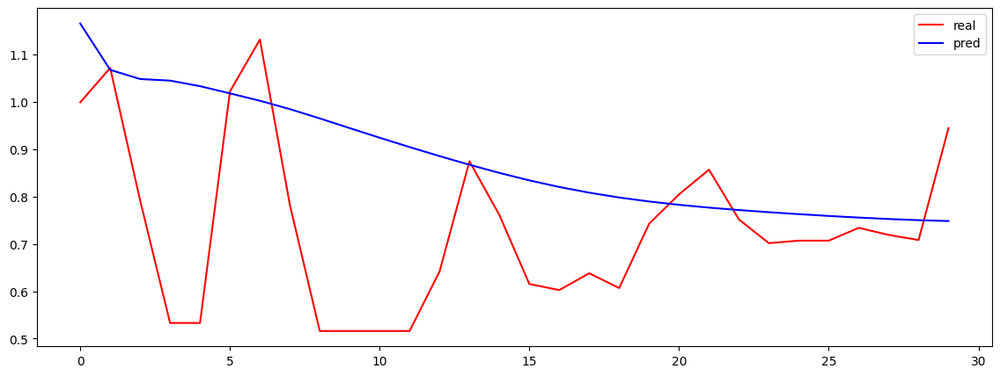

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


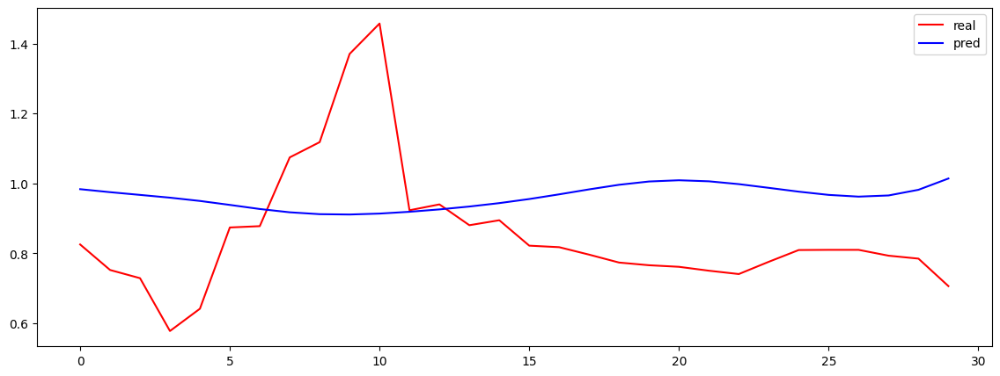

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


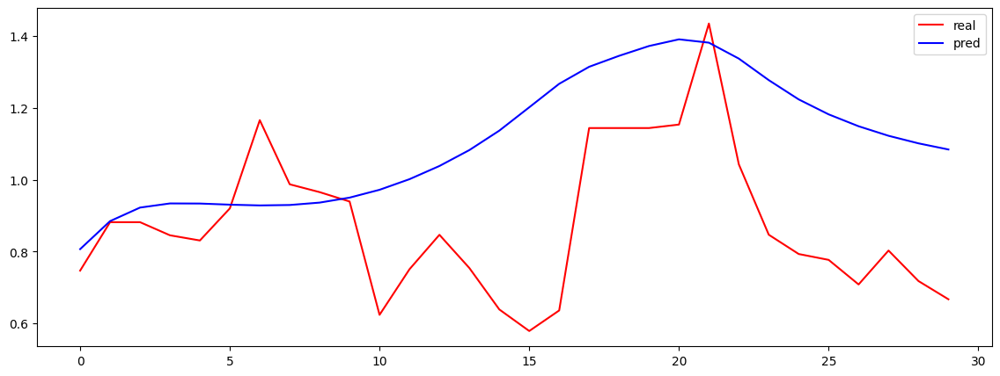

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


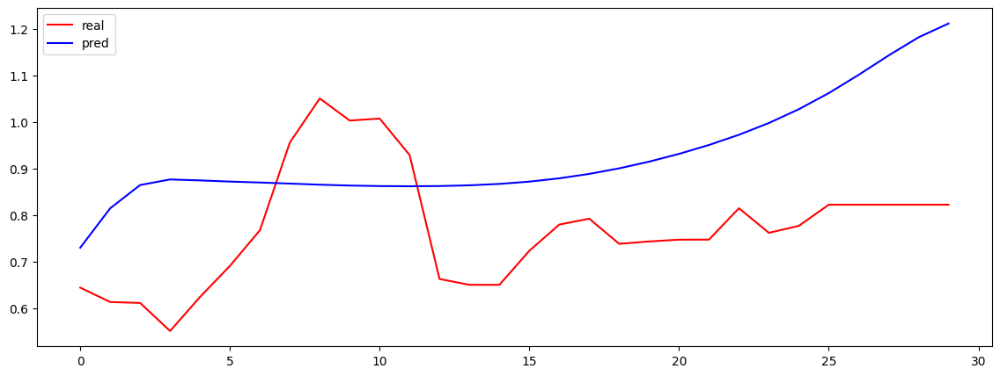

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


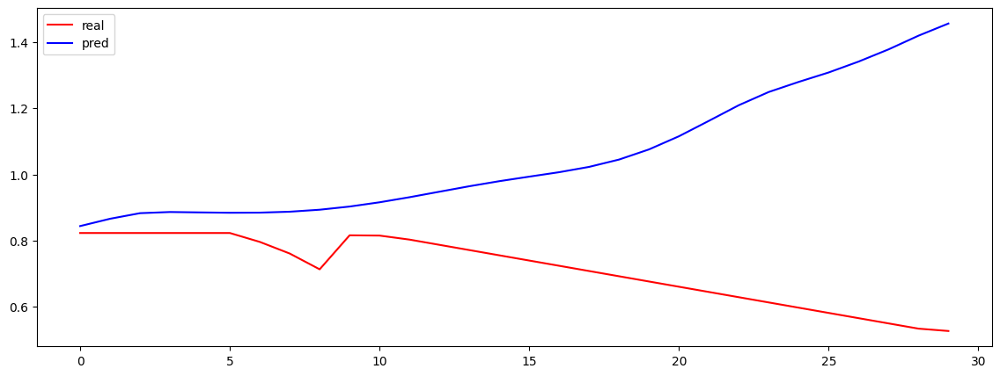

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


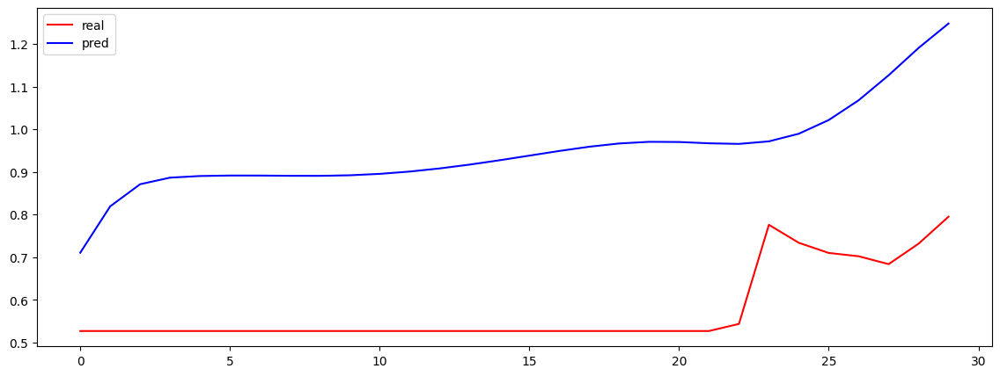

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


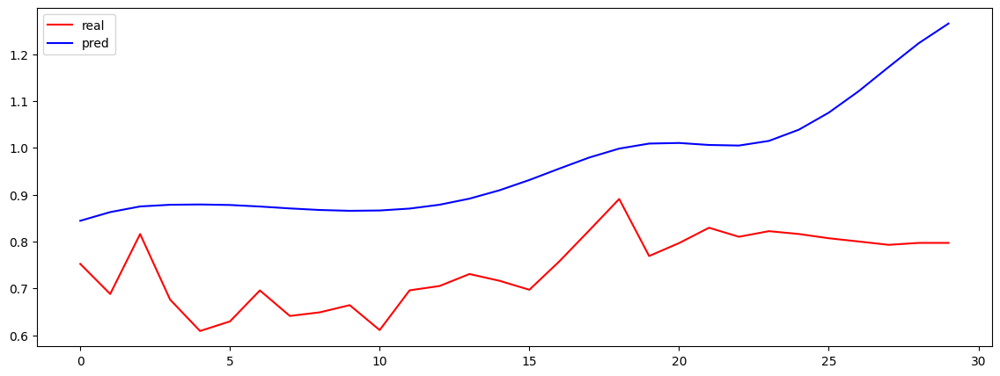

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


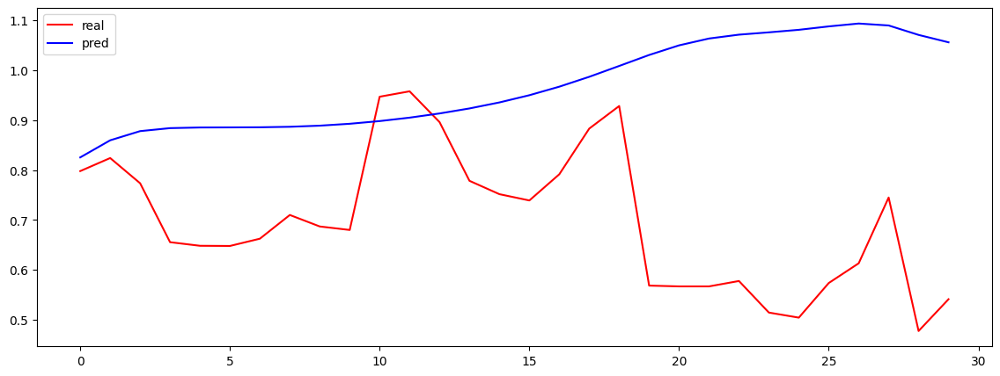

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


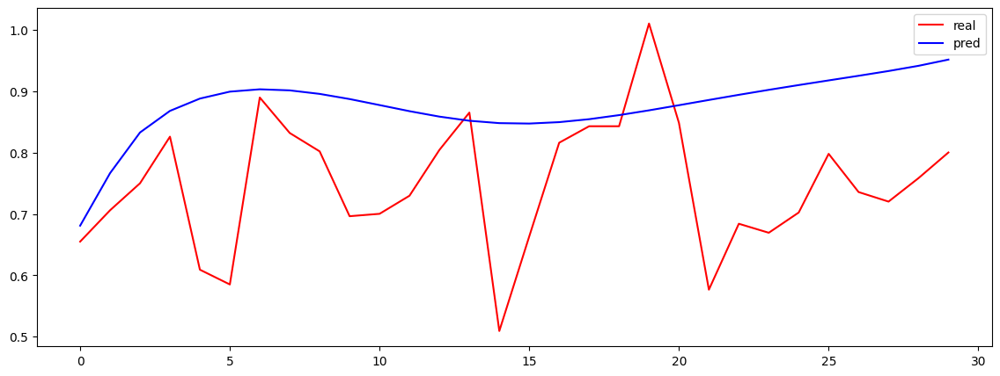

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


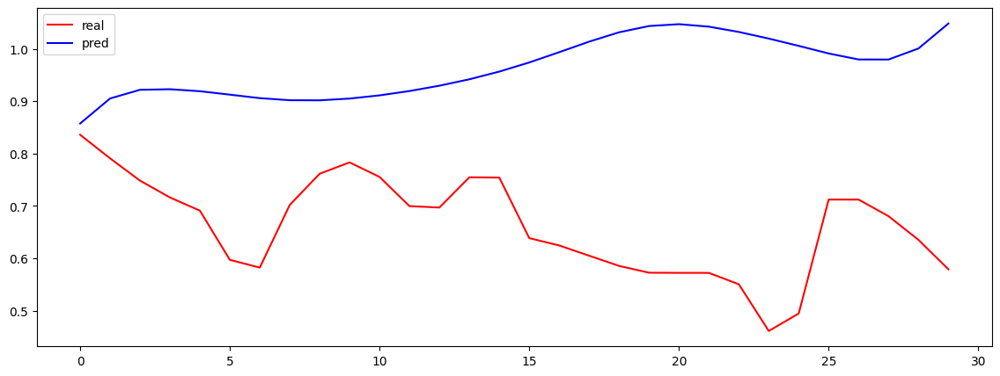

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


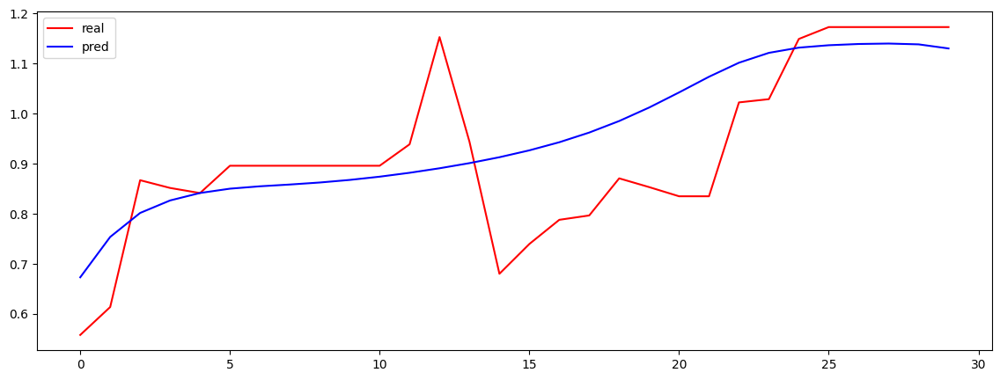

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


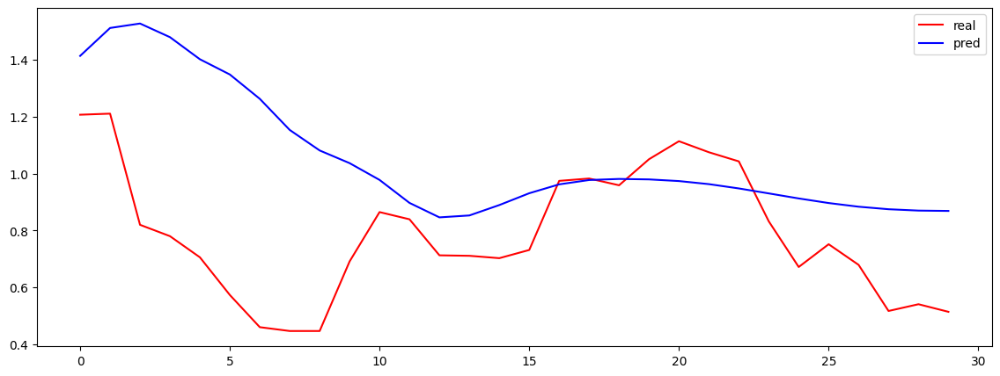

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


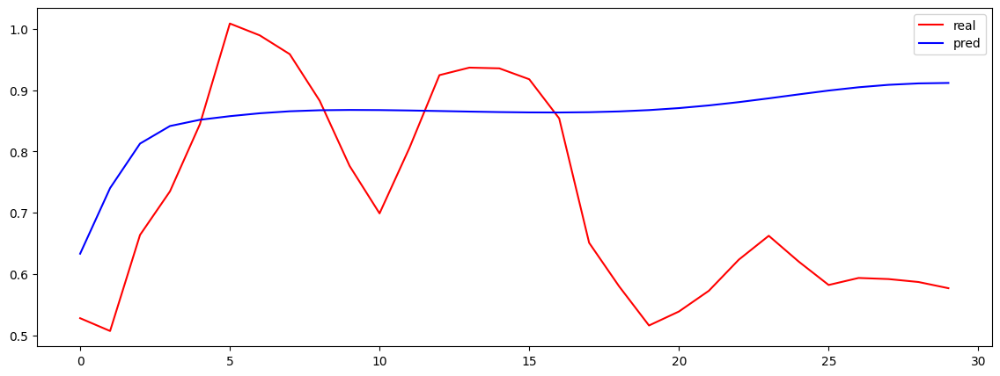

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


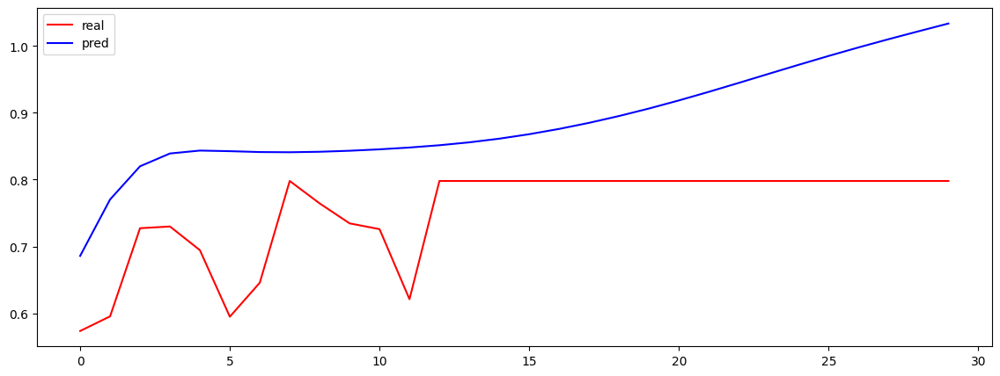

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


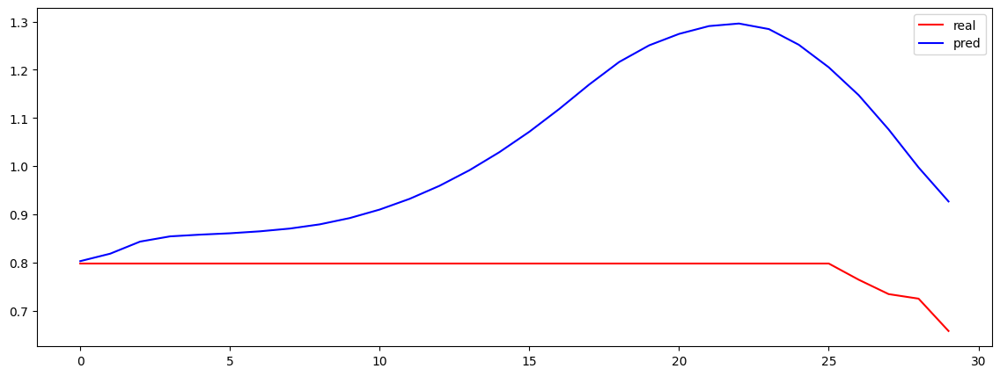

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


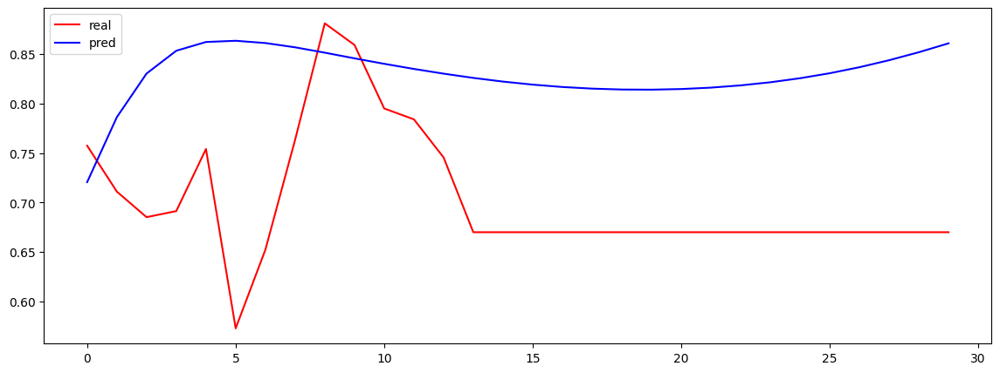

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


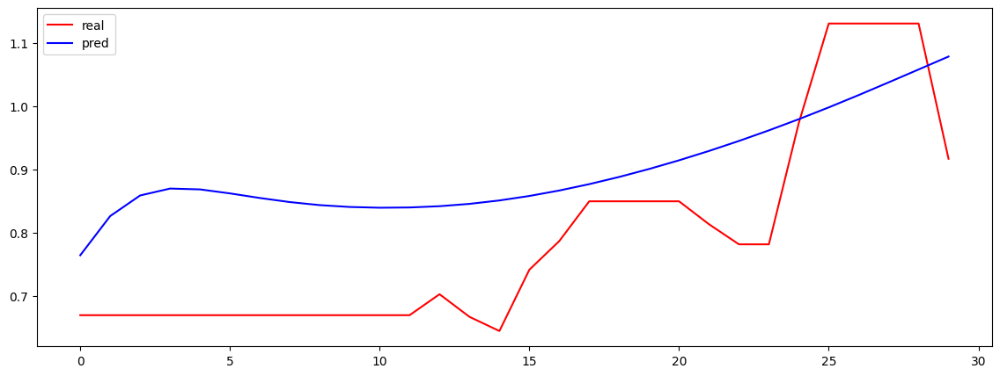

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


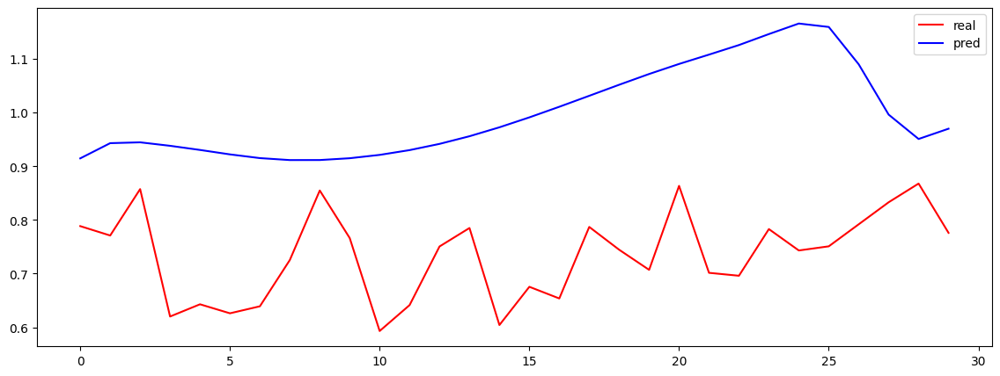

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


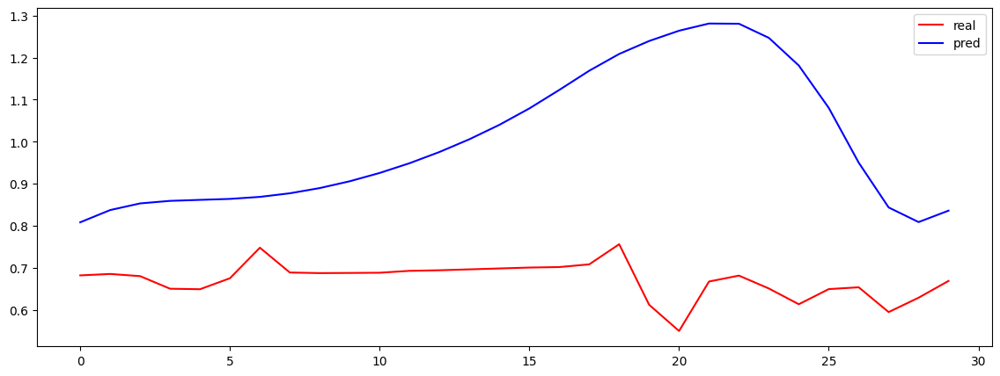

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


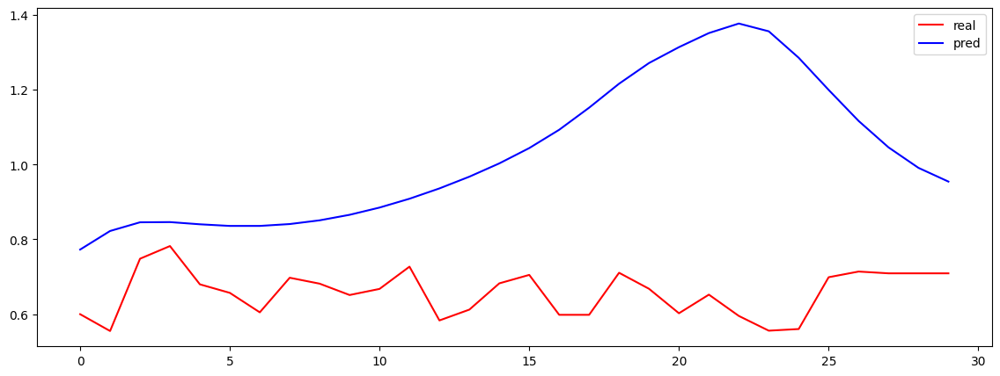

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


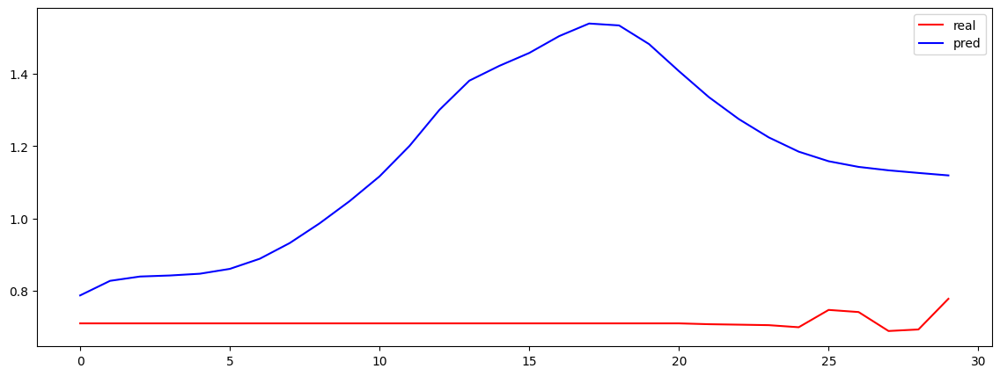

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


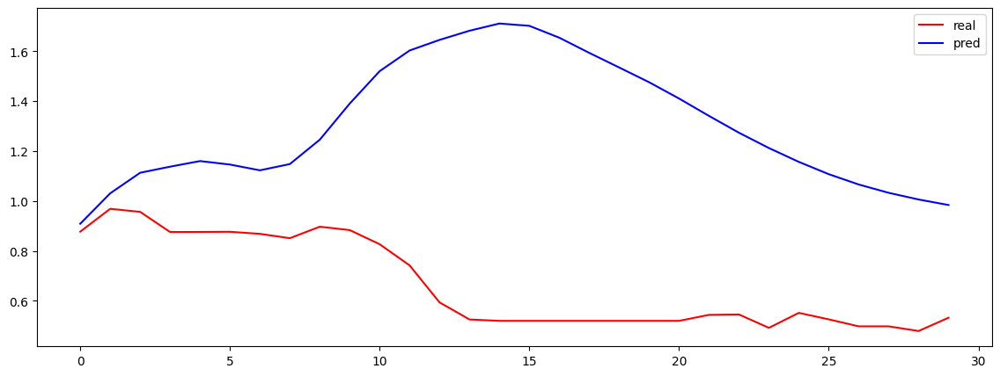

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


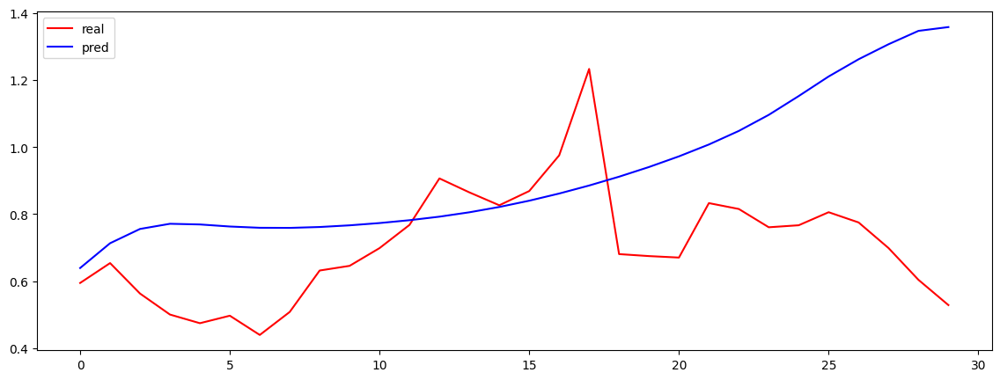

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


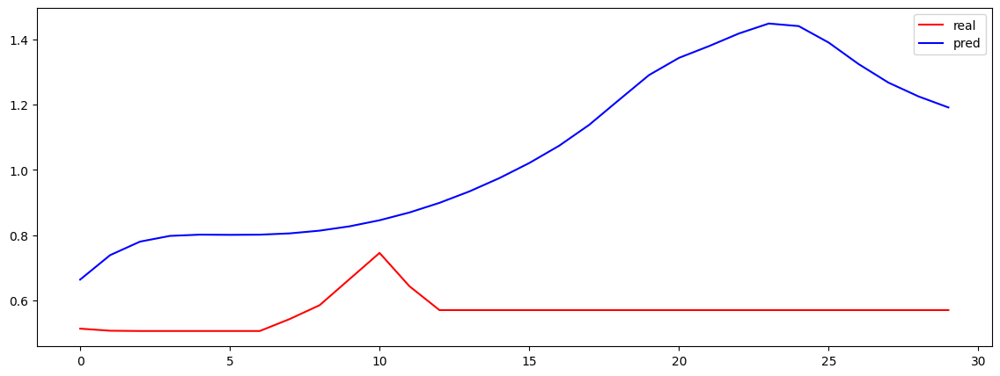

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


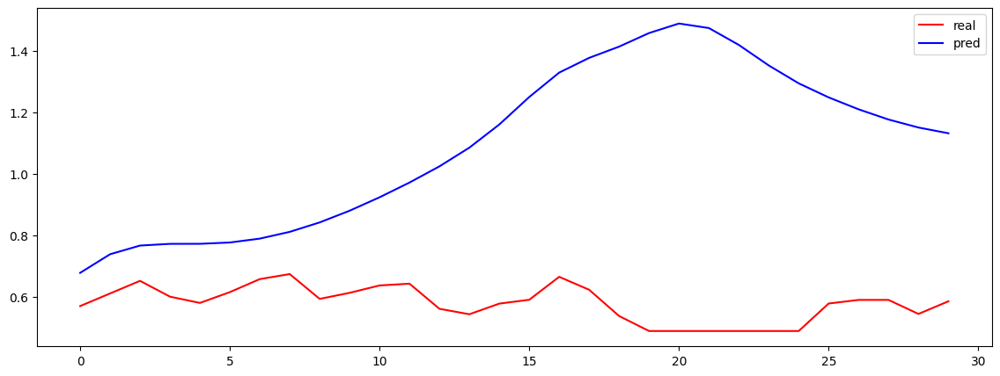

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


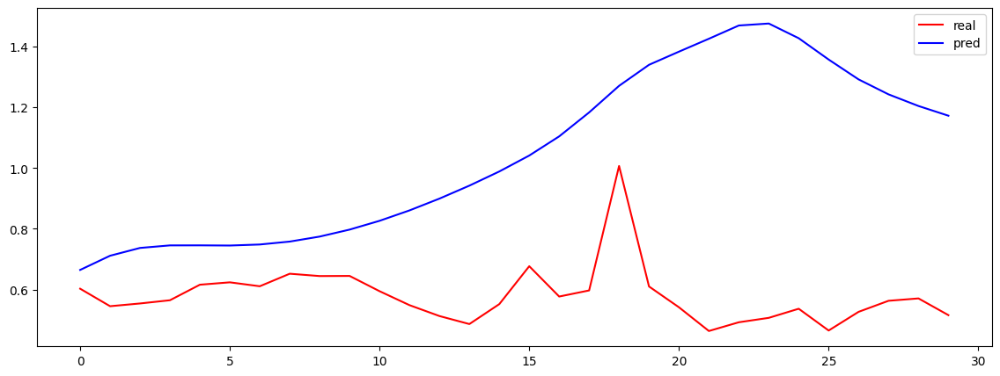

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


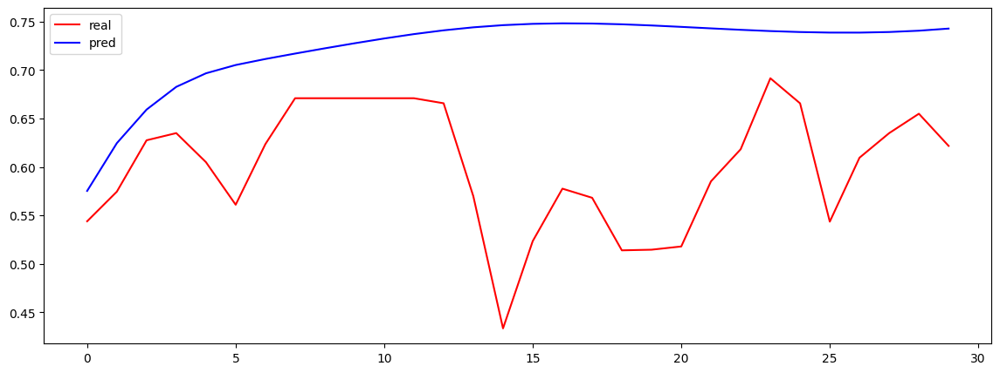

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


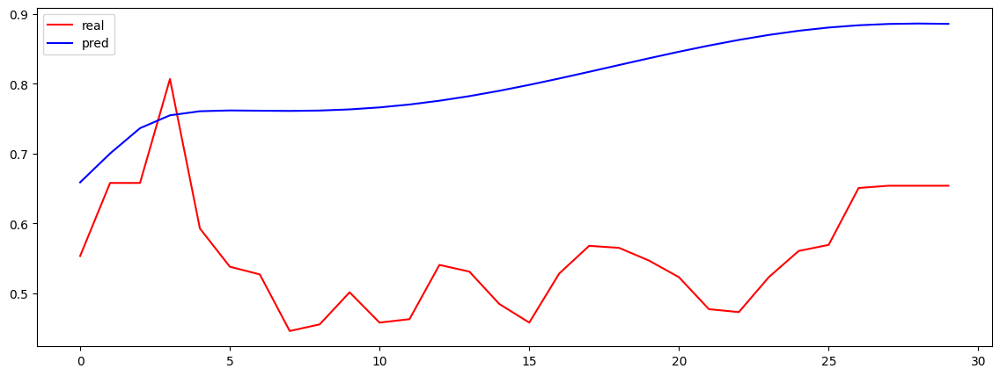

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


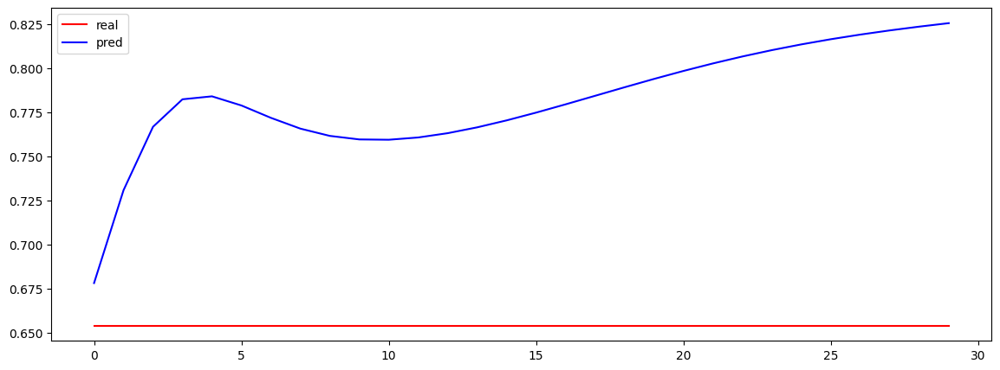

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


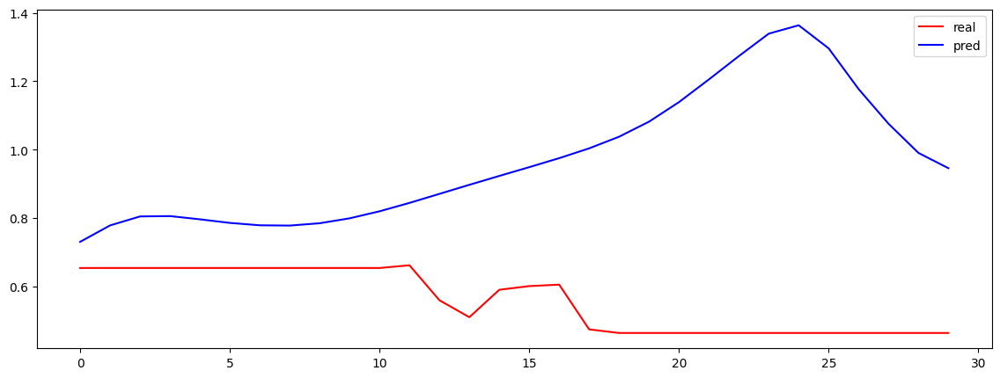

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


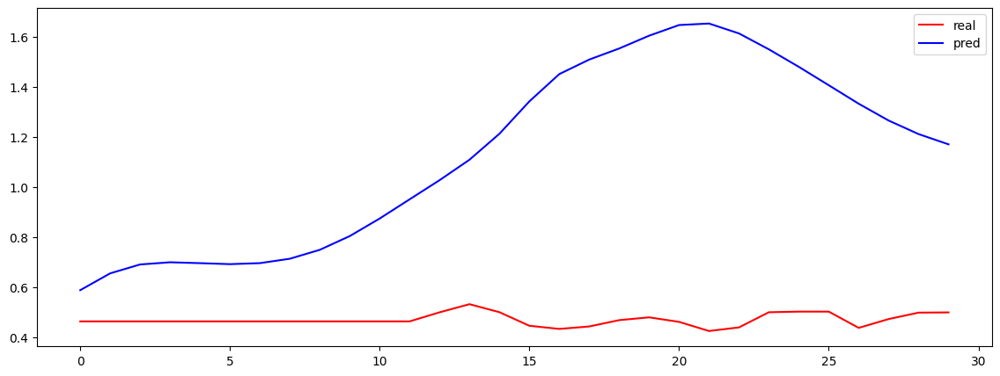

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


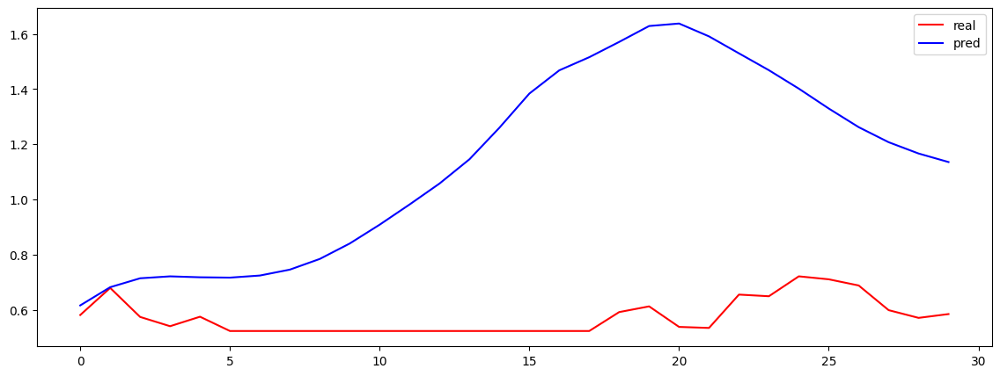

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


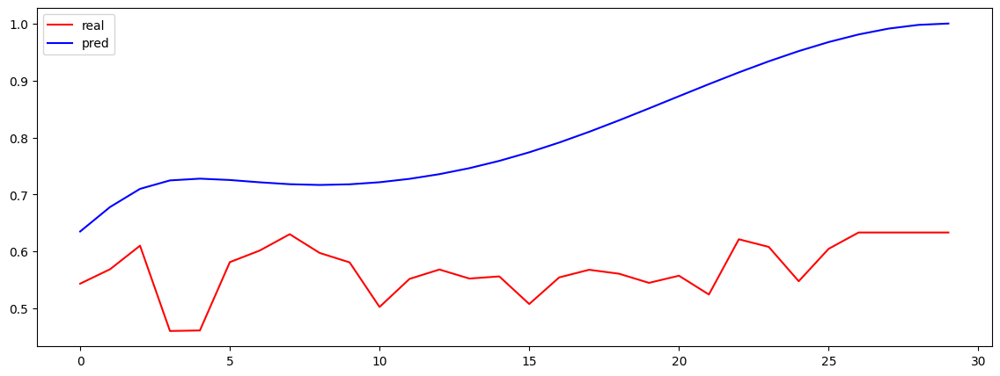

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


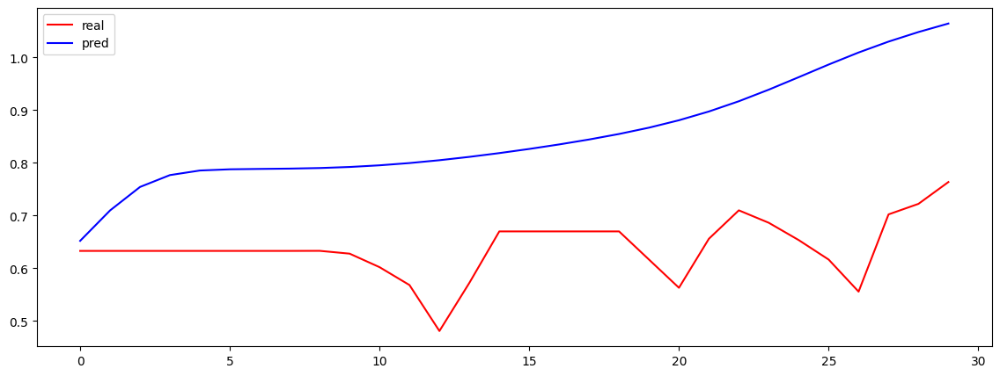

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


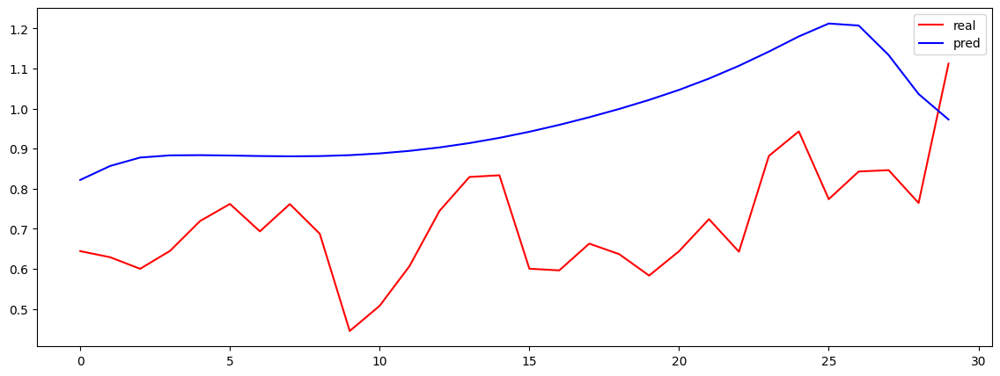

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


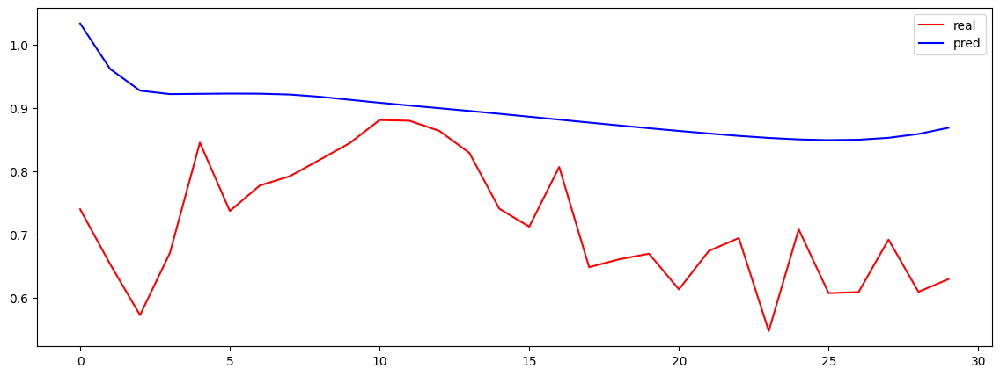

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


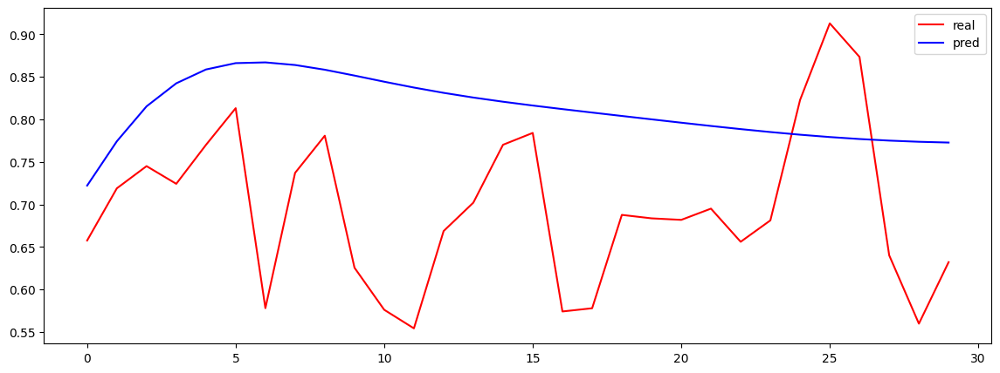

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


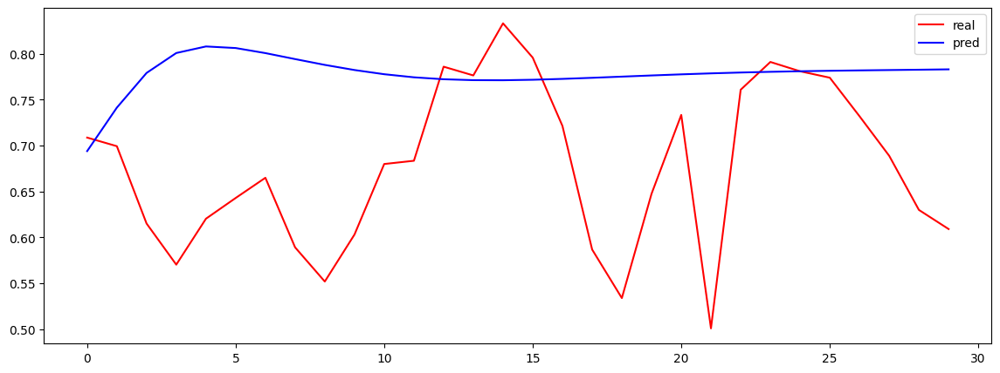

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


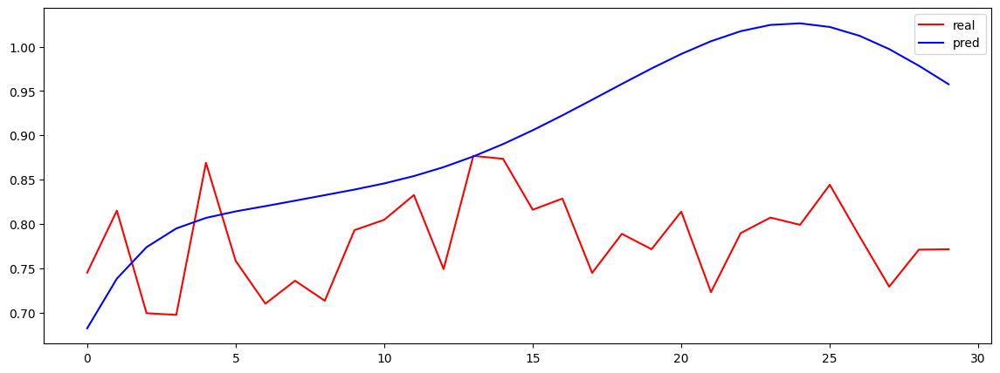

torch.Size([30, 57])
torch.Size([30, 19])
---------------
0
30


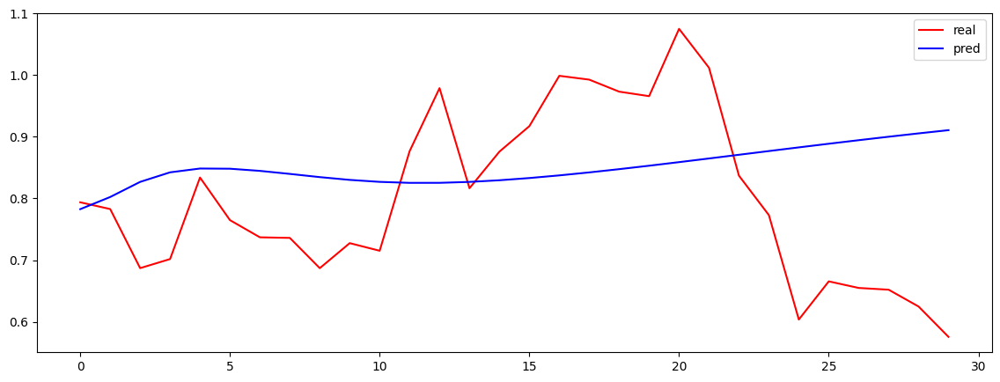

In [134]:



for i in range(0, y_test.shape[0]- bin_size, bin_size):
    batch_x_test = x_test[i:i+bin_size, :]
    print( batch_x_test.shape )

    batch_y_test = y_test[i:i+bin_size, :]
    print( batch_y_test.shape )
    print("---------------")
    bins_inference_model_pt(model, batch_x_test, batch_y_test)



## View all predicted Xs


In [135]:


            
            
def View_all_predicted_Xs(x_index, model, model_type='RNN', **kwargs):
 
    x_test, y_test   = kwargs['test_data']
 
    ## Prediction
    model.eval()
    with torch.no_grad():
        h0    = model.init_hidden( x_test.shape[0] )
        y_hat = model(x_test, h0)
        
    y_hat, _ = y_hat
 
    ## Plotting
    fig, ax = plt.subplots(2, 1) 
    
    ax[0].set_title(f"{model_type} TEST MSE = {0:.4f}: Forecast vs Actual (Out-of-Sample data)")
    scale = kwargs['scale']
    print("ricardo check this")
    print(y_test.shape)
    print(y_hat.shape )
    actual = scale.inverse_y(y_test.detach().numpy() ) ## .ravel() )
    pred   = scale.inverse_y( y_hat.detach().numpy() ) ## .ravel() )
    idx = kwargs['idx']
    ##pd.Series(actual, index=idx).plot(style='k--', label='actual', alpha=0.65, color='blue')
    ##pd.Series(pred,   index=idx).plot(style='k',   label='forecast' , color='red')
    print(actual.shape)
    print(pred.shape)
    actual = actual[:, x_index]
    pred   =   pred[:, x_index]
    
    pd.Series(pred,   index=idx).plot( label='forecast' , color='red' )
    pd.Series(actual, index=idx).plot( label='actual',    color='blue')
    
    fig.tight_layout()
    ax[1].legend(); plt.show()
    
    return 0, 0
    
           

            



ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


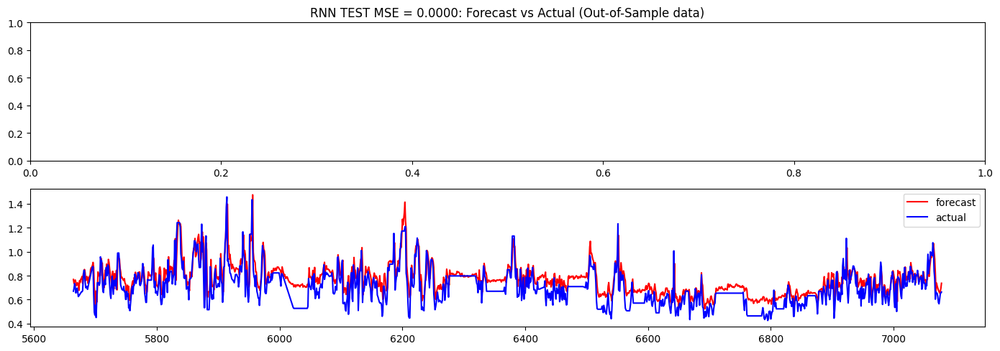

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


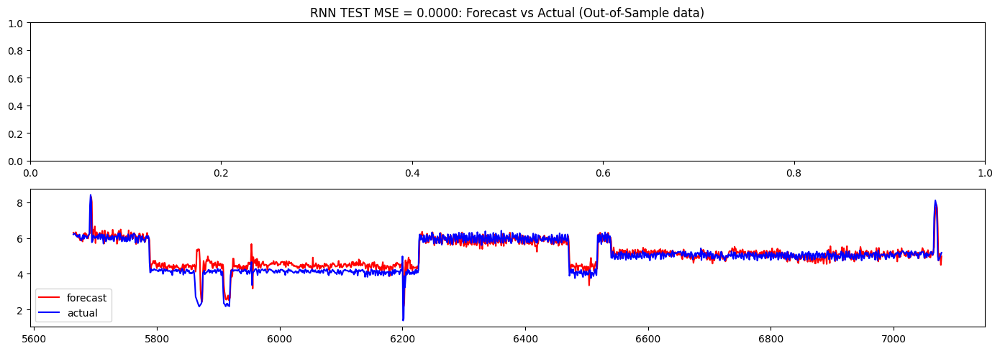

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


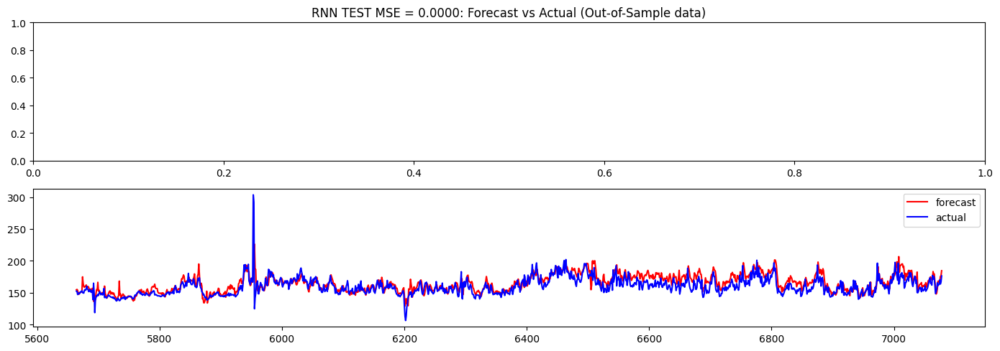

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


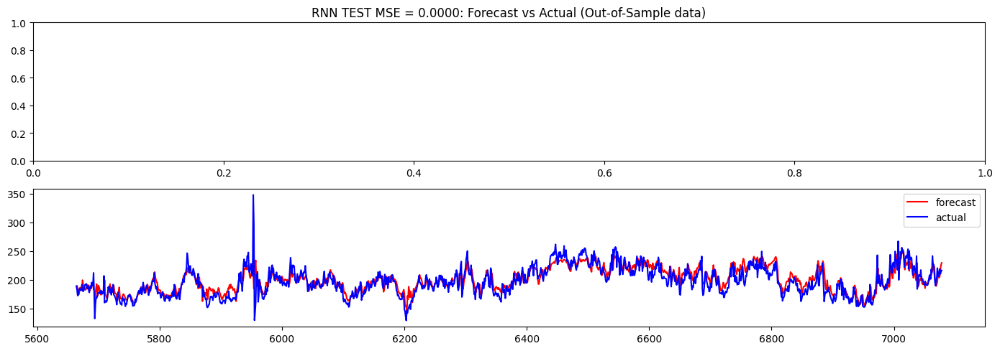

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


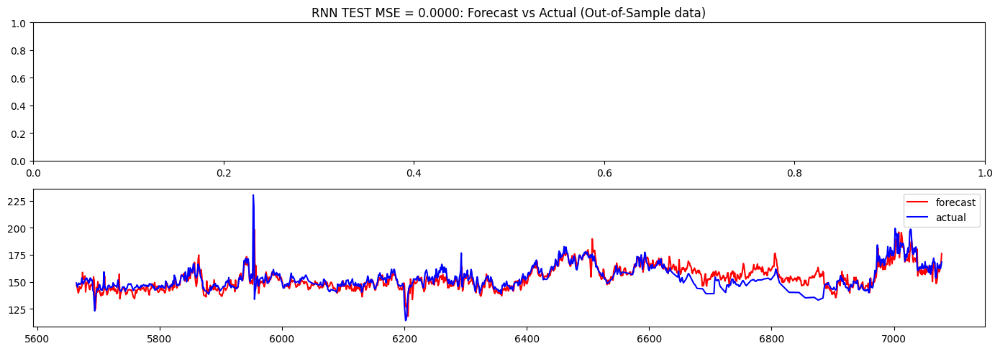

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


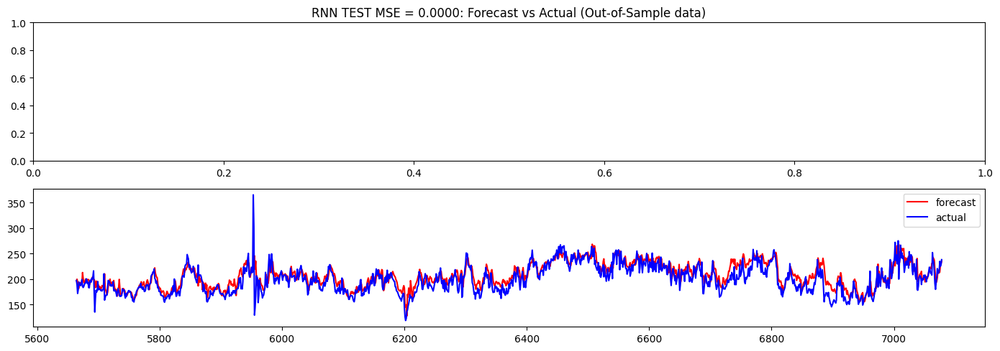

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


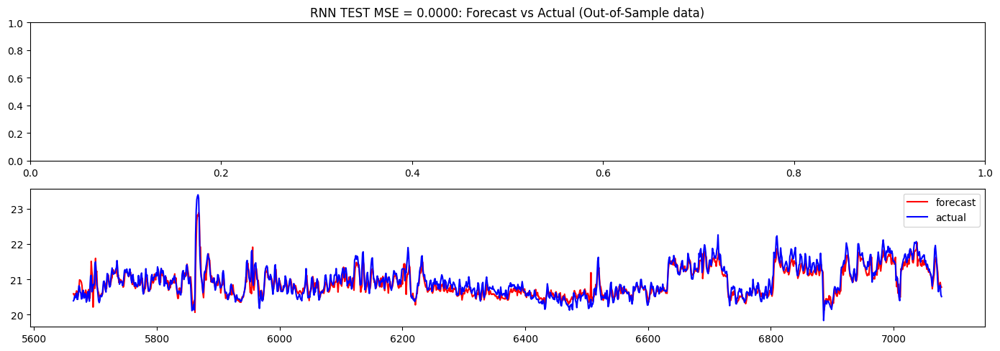

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


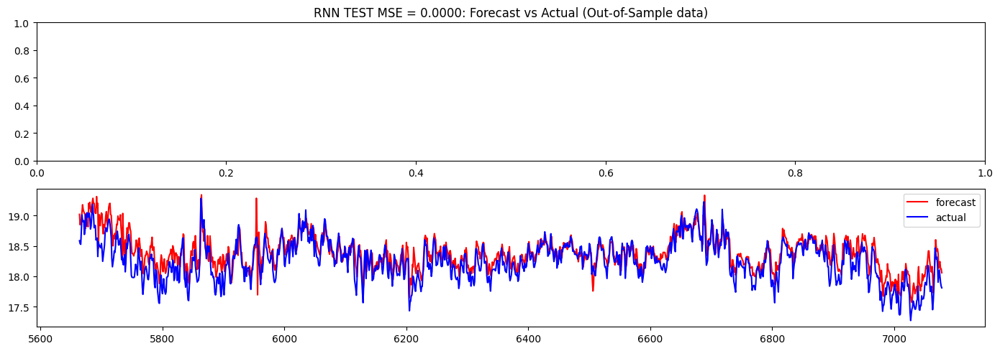

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


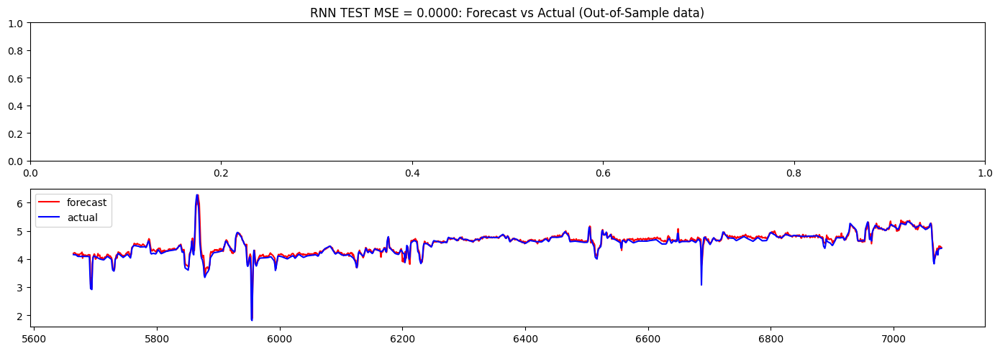

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


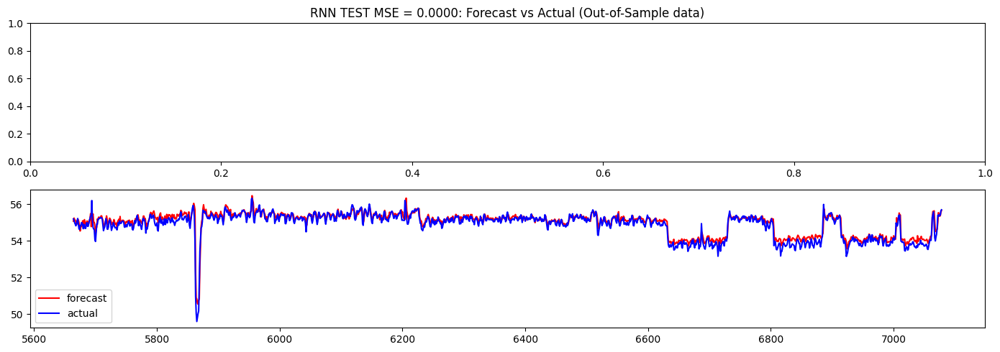

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


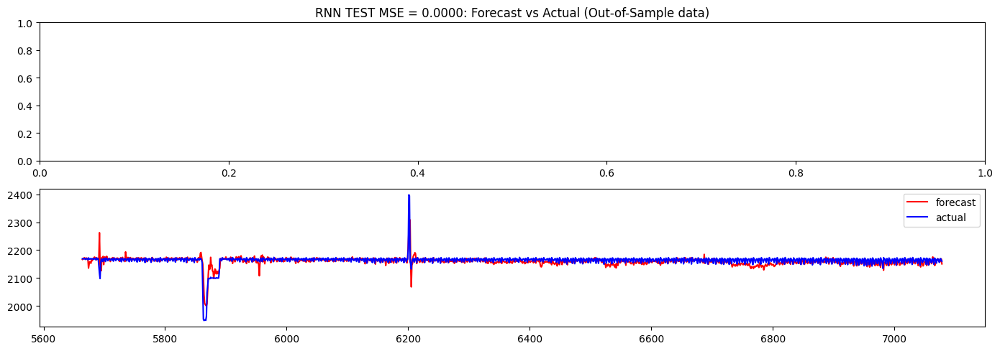

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


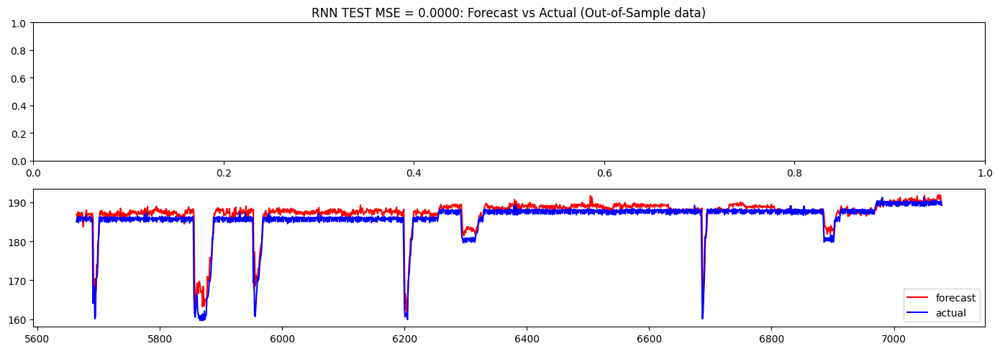

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


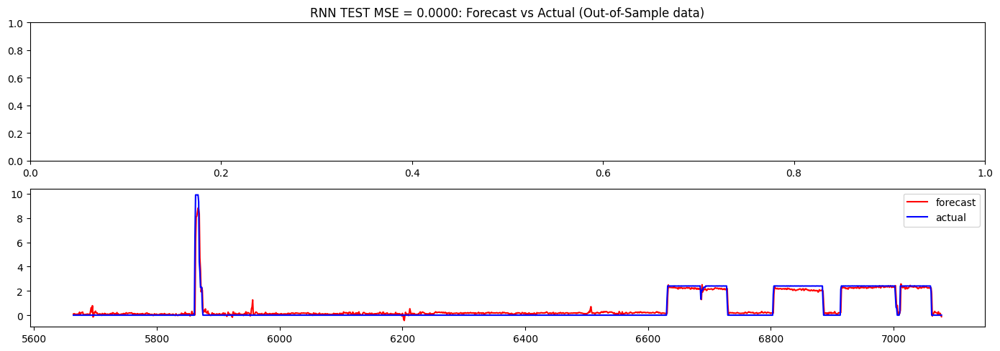

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


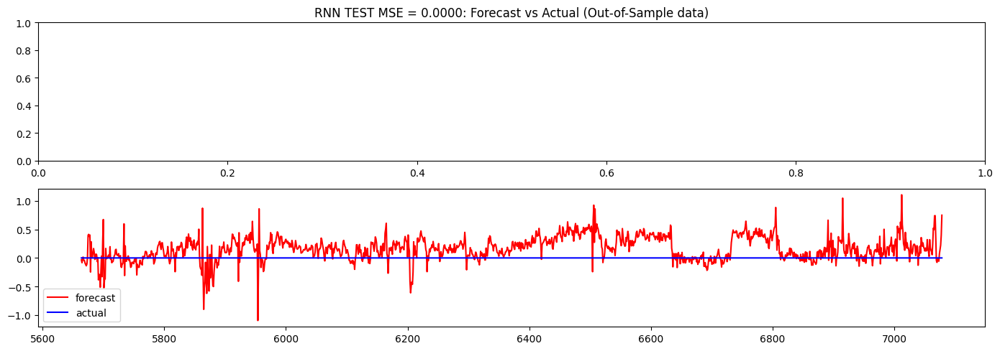

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


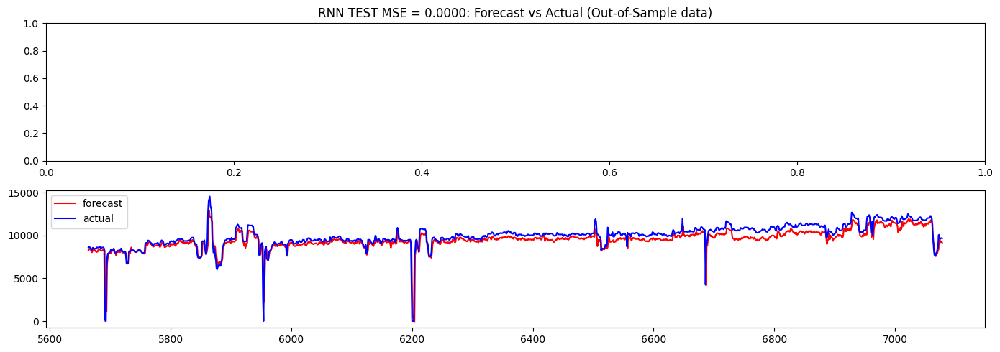

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


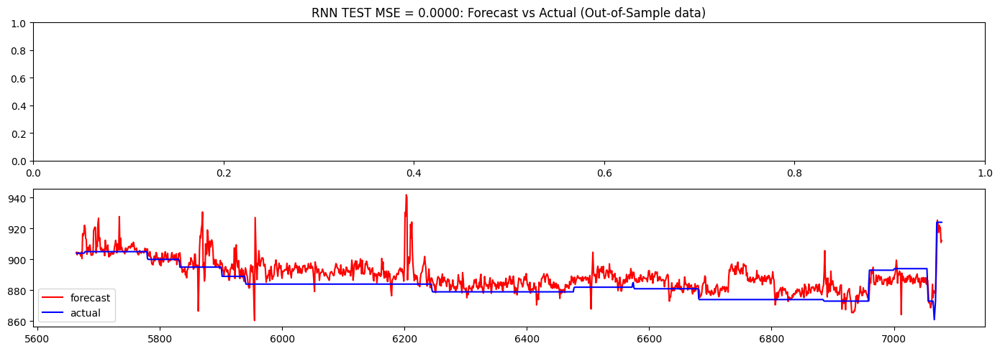

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


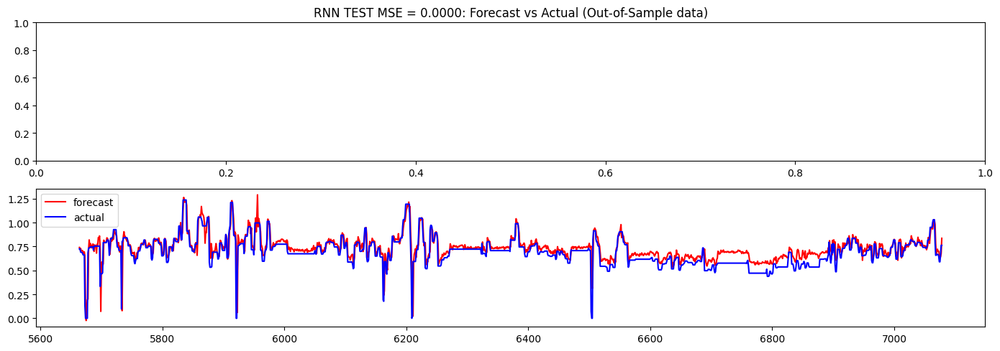

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


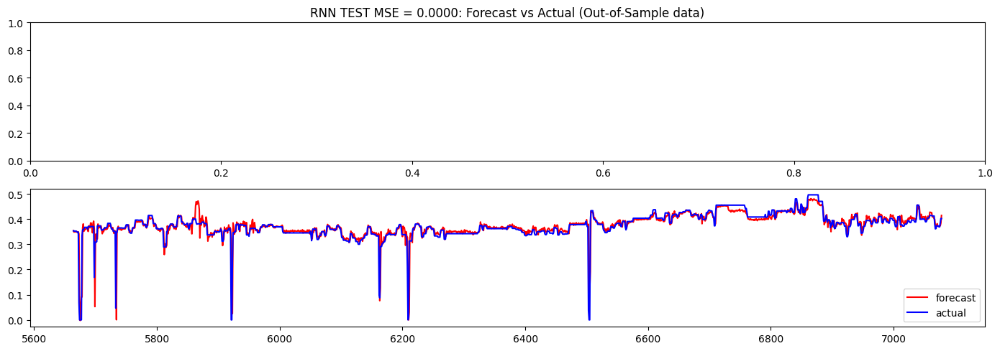

ricardo check this
torch.Size([1415, 19])
torch.Size([1415, 19])
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(76,)
(76,)
(19,)
(19,)
(1415, 19)
(1, 19)
(1, 19)
(1415, 19)
(1415, 19)


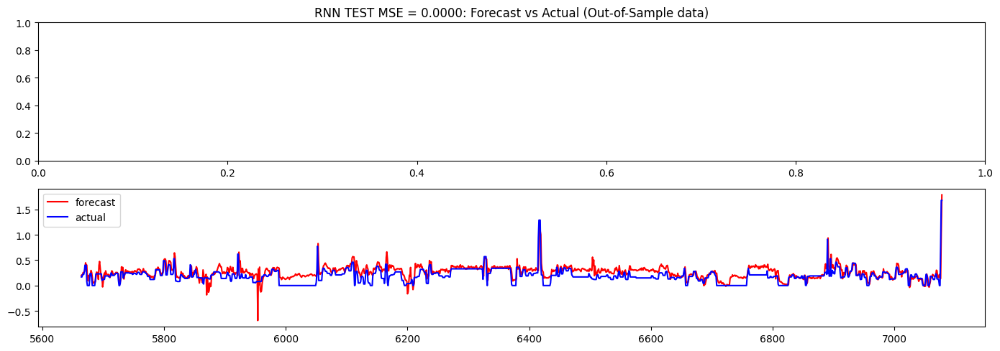

In [136]:

for i in range(19):

    x_index = i

    l1, l2 = View_all_predicted_Xs(x_index, model, model_type='RNN', **params_si )            
